# Separate runs by HKLE due to size limits

In [1]:
datafile='TCGA/focused.1000.T.csv.gz'

In [2]:
hkle='SVA_B'

['HERVK113', 'SVA_A', 'SVA_B', 'SVA_C', 'SVA_D', 'SVA_E', 'SVA_F']

In [3]:
threshold=3

---

In [4]:
import numpy as np
np.__version__

'1.20.3'

In [5]:
import pandas as pd
pd.__version__

'1.2.4'

In [6]:
import matplotlib
matplotlib.__version__

'3.4.2'

In [7]:
import matplotlib.pyplot as plt

In [8]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [9]:
import scipy
scipy.__version__

'1.7.0'

In [10]:
from scipy import stats

In [11]:
import seaborn as sns
sns.__version__

'0.11.1'

In [12]:
from datetime import datetime

In [13]:
import sklearn
sklearn.__version__

'0.24.2'

In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [15]:
default_max_columns=pd.get_option('display.max_columns')

In [16]:
default_max_rows=pd.get_option('display.max_rows')

In [17]:
default_precision=pd.get_option('display.precision')

In [18]:
pd.set_option('display.precision', 2)

In [19]:
#default_threshold=np.get_printoptions()['threshold']

In [20]:
#np.set_printoptions(threshold=10000000)

---

# Read Metadata 1

In [21]:
mt1=pd.read_csv("TCGA/metadata.cart.TCGA.GBM-LGG.WGS.bam.2020-07-17.csv",header=None,
 names=['subject','sequencing','days_to_death','gender','disease_type','center_name','unknown'])
mt1.head()

,subject,sequencing,days_to_death,gender,disease_type,center_name,unknown
0,02-2483,02-2483-01A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
1,02-2483,02-2483-10A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
2,02-2485,02-2485-01A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
3,02-2485,02-2485-10A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
4,06-0125,06-0125-01A-01D-1490-08,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


In [22]:
mt1.shape

(278, 7)

In [23]:
mt1.rename(columns={"submitter": "subject"},inplace=True)
mt1.rename(columns={"gender": "gender1"},inplace=True)
mt1.shape

(278, 7)

In [24]:
mt1=mt1.drop('sequencing',axis='columns')
mt1=mt1.drop_duplicates()
mt1.shape

(127, 6)

In [25]:
list(mt1)

['subject',
 'days_to_death',
 'gender1',
 'disease_type',
 'center_name',
 'unknown']

In [26]:
mt1['subject']

0      02-2483
2      02-2485
4      06-0125
7      06-0152
8      06-0157
        ...   
263    IK-7675
265    TM-A7CF
268    TQ-A7RK
272    TQ-A7RV
275    TQ-A8XE
Name: subject, Length: 127, dtype: object

---

# Read Metadata 2

In [27]:
mt2=pd.read_csv("TCGA/TCGA.Glioma.metadata.tsv",sep="\t")

In [28]:
mt2.shape

(1114, 18)

In [29]:
mt2.head()

,case_submitter_id,project_id,primary_diagnosis,race,ethnicity,gender,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,WHO_groups,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status
0,TCGA-02-0001,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,44.0,11.76,1.0
1,TCGA-02-0003,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,50.0,4.73,1.0
2,TCGA-02-0004,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,NaN,NaN,IDH-WT:1p19q-NA,NaN,IDH-WT:1p19q-NA:TERT-NA,MD Anderson Cancer Center,NaN,59.0,11.33,1.0
3,TCGA-02-0006,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,56.0,18.33,1.0
4,TCGA-02-0007,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,40.0,23.16,1.0


In [30]:
list(mt2)

['case_submitter_id',
 'project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status']

In [31]:
mt2['subject']=mt2['case_submitter_id'].astype(str).str[5:12]

In [32]:
mt2[['subject','case_submitter_id']].head()

,subject,case_submitter_id
0,02-0001,TCGA-02-0001
1,02-0003,TCGA-02-0003
2,02-0004,TCGA-02-0004
3,02-0006,TCGA-02-0006
4,02-0007,TCGA-02-0007


In [33]:
mt2.drop('case_submitter_id',axis='columns',inplace=True)
mt2.rename(columns={"gender": "gender2"},inplace=True)

In [34]:
list(mt2)

['project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender2',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status',
 'subject']

---

# Merge Metadata

In [35]:
meta=mt2.merge(mt1,on='subject',suffixes=["_mt2","_mt1"],how='inner')

In [36]:
del mt1
del mt2

In [37]:
meta.head()

,project_id,primary_diagnosis,race,ethnicity,gender2,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,...,MGMT,Age,Survival_months,Vital_status,subject,days_to_death,gender1,disease_type,center_name,unknown
0,TCGA-GBM,Glioblastoma,asian,not hispanic or latino,male,02-2483-01A-01R-1849-01+1,Mutant,non-codel,WT,IDH-Mutant:1p19q-non-codel,...,Methylated,43.0,15.31,0.0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
1,TCGA-GBM,Glioblastoma,black or african american,not hispanic or latino,male,02-2485-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Unmethylated,53.0,15.44,0.0,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
2,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0125-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Methylated,63.0,47.57,1.0,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
3,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,...,NaN,68.0,12.32,1.0,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
4,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0157-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,NaN,63.0,3.19,1.0,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


In [38]:
meta.drop(meta[(meta['subject']=='CS-6186') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [39]:
meta.drop(meta[(meta['subject']=='DU-5872') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [40]:
meta.columns

Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name', 'unknown'],
      dtype='object')

In [41]:
meta['primary_diagnosis'].value_counts()

Glioblastoma                     35
Oligodendroglioma, NOS           33
Astrocytoma, anaplastic          24
Mixed glioma                     16
Astrocytoma, NOS                  9
Oligodendroglioma, anaplastic     8
Name: primary_diagnosis, dtype: int64

In [42]:
meta['TERT'].value_counts()

Mutant    68
WT        54
Name: TERT, dtype: int64

In [43]:
meta['IDH'].value_counts()

Mutant    74
WT        50
Name: IDH, dtype: int64

In [44]:
meta['x1p19q'].value_counts()

non-codel    102
codel         23
Name: x1p19q, dtype: int64

In [45]:
meta['disease_type'].value_counts()

Brain Lower Grade Glioma    90
Glioblastoma Multiforme     35
Name: disease_type, dtype: int64

In [46]:
meta['gender1'].value_counts()

male      72
female    53
Name: gender1, dtype: int64

In [47]:
meta['race'].value_counts()

white                        114
black or african american      7
not reported                   3
asian                          1
Name: race, dtype: int64

In [48]:
meta['ethnicity'].value_counts()

not hispanic or latino    108
not reported               11
hispanic or latino          6
Name: ethnicity, dtype: int64

In [49]:
meta['IDH_1p19q_status'].value_counts()

IDH-Mutant:1p19q-non-codel    51
IDH-WT:1p19q-non-codel        50
IDH-Mutant:1p19q-codel        23
IDH-NA:1p19q-non-codel         1
Name: IDH_1p19q_status, dtype: int64

In [50]:
meta['WHO_groups'].value_counts()

glioblastoma:IDH-WT:1p19q-non-codel             29
oligodendroglioma:IDH-Mutant:1p19q-codel        23
astrocytoma:IDH-Mutant:1p19q-non-codel          18
astrocytoma:IDH-WT:1p19q-non-codel              13
oligodendroglioma:IDH-Mutant:1p19q-non-codel    13
oligoastrocytoma:IDH-Mutant:1p19q-non-codel     11
glioblastoma:IDH-Mutant:1p19q-non-codel          5
oligodendroglioma:IDH-WT:1p19q-non-codel         4
oligoastrocytoma:IDH-WT:1p19q-non-codel          4
Name: WHO_groups, dtype: int64

In [51]:
meta['Triple_group'].value_counts()

IDH-Mutant:1p19q-non-codel:TERT-WT        49
IDH-WT:1p19q-non-codel:TERT-Mutant        44
IDH-Mutant:1p19q-codel:TERT-Mutant        22
IDH-WT:1p19q-non-codel:TERT-WT             4
IDH-WT:1p19q-non-codel:TERT-NA             2
IDH-Mutant:1p19q-non-codel:TERT-NA         1
IDH-NA:1p19q-non-codel:TERT-Mutant         1
IDH-Mutant:1p19q-codel:TERT-WT             1
IDH-Mutant:1p19q-non-codel:TERT-Mutant     1
Name: Triple_group, dtype: int64

In [52]:
meta['MGMT'].value_counts()

Methylated      87
Unmethylated    27
Name: MGMT, dtype: int64

In [53]:
meta['center_name'].value_counts()

Broad Institute of MIT and Harvard    75
Harvard Medical School                50
Name: center_name, dtype: int64

---

# Read raw data and cleanup

In [54]:
#df=pd.read_csv("focused.csv.gz",header=[0,1,2,3],index_col=[0,1])
#df.columns.names=['sample','pup','hkle','q']
#df=df.T
df=pd.read_csv(datafile,header=[0,1],index_col=[0,1,2,3])
#df.reset_index(inplace=True)
#df=pd.read_csv(datafile,header=[0,1]) #,index_col=[0,1,2,3])
df.head()

chromosome                                   chr1                          \
position                                  1102000 1308000 1409000 1410000   
sample               pup    hkle     mapq                                   
02-2483-01A-01D-1494 paired HERVK113 Q20        0       0       4       1   
                            SVA_A    Q20        0       0       0       0   
                            SVA_B    Q20        0       0       0       0   
                            SVA_C    Q20        0       0       0       0   
                            SVA_D    Q20        0       0       0       0   

chromosome                                                                 \
position                                  1580000 1581000 2211000 3129000   
sample               pup    hkle     mapq                                   
02-2483-01A-01D-1494 paired HERVK113 Q20        4       0       0       0   
                            SVA_A    Q20        0       0       0       0   
                            SVA_B    Q20        0       0       0       0   
                            SVA_C    Q20        0       0       0       0   
                            SVA_D    Q20        0       0       0       0   

chromosome                                                 ...     chrY  \
position                                  3315000 3321000  ... 15075000   
sample               pup    hkle     mapq                  ...            
02-2483-01A-01D-1494 paired HERVK113 Q20        0       0  ...        0   
                            SVA_A    Q20        0       0  ...        0   
                            SVA_B    Q20        0       0  ...        0   
                            SVA_C    Q20        0       0  ...        0   
                            SVA_D    Q20        0       0  ...        0   

chromosome                                                                     \
position                                  15774000 17181000 19536000 19699000   
sample               pup    hkle     mapq                                       
02-2483-01A-01D-1494 paired HERVK113 Q20         0        0        0        2   
                            SVA_A    Q20         0        0        0        0   
                            SVA_B    Q20         0        0        0        0   
                            SVA_C    Q20         0        0        0        0   
                            SVA_D    Q20         0        0        0        0   

chromosome                                                                     \
position                                  19700000 20553000 20976000 21047000   
sample               pup    hkle     mapq                                       
02-2483-01A-01D-1494 paired HERVK113 Q20         0        0        0        0   
                            SVA_A    Q20         0        0        0        0   
                            SVA_B    Q20         0        0        0        0   
                            SVA_C    Q20         0        0        0        0   
                            SVA_D    Q20         0        0        0        0   

chromosome                                          
position                                  21217000  
sample               pup    hkle     mapq           
02-2483-01A-01D-1494 paired HERVK113 Q20         0  
                            SVA_A    Q20         0  
                            SVA_B    Q20         0  
                            SVA_C    Q20         0  
                            SVA_D    Q20         0  

[5 rows x 12550 columns]

In [55]:
df.columns= [' '.join(col).strip() for col in df.columns.values]
df.head()

chr1 1102000  chr1 1308000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              0             0   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 1409000  chr1 1410000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              4             1   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 1580000  chr1 1581000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              4             0   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 2211000  chr1 3129000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              0             0   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 3315000  chr1 3321000  ...  \
sample               pup    hkle     mapq                              ...   
02-2483-01A-01D-1494 paired HERVK113 Q20              0             0  ...   
                            SVA_A    Q20              0             0  ...   
                            SVA_B    Q20              0             0  ...   
                            SVA_C    Q20              0             0  ...   
                            SVA_D    Q20              0             0  ...   

                                           chrY 15075000  chrY 15774000  \
sample               pup    hkle     mapq                                 
02-2483-01A-01D-1494 paired HERVK113 Q20               0              0   
                            SVA_A    Q20               0              0   
                            SVA_B    Q20               0              0   
                            SVA_C    Q20               0              0   
                            SVA_D    Q20               0              0   

                                           chrY 17181000  chrY 19536000  \
sample               pup    hkle     mapq                                 
02-2483-01A-01D-1494 paired HERVK113 Q20               0              0   
                            SVA_A    Q20               0              0   
                            SVA_B    Q20               0              0   
                            SVA_C    Q20               0              0   
                            SVA_D    Q20               0              0   

                                           chrY 19699000  chrY 19700000  \
sample               pup    hkle     mapq                                 
02-2483-01A-01D-1494 paired HERVK113 Q20               2              0   
                            SVA_A    Q20               0              0   
                            SVA_B    Q20               0              0   
                     

In [56]:
df.reset_index(inplace=True)

In [57]:
df.rename(columns={"sample": "sequencing"},inplace=True)
df['sample']=df['sequencing'].str[0:11]
#df['sample']=df['sample'].str[0:11]
df['subject']=df['sample'].str[0:7]
df['subject']

0       02-2483
1       02-2483
2       02-2483
3       02-2483
4       02-2483
         ...   
1024    TQ-A8XE
1025    TQ-A8XE
1026    TQ-A8XE
1027    TQ-A8XE
1028    TQ-A8XE
Name: subject, Length: 1029, dtype: object

In [58]:
df.columns

Index(['sequencing', 'pup', 'hkle', 'mapq', 'chr1 1102000', 'chr1 1308000',
       'chr1 1409000', 'chr1 1410000', 'chr1 1580000', 'chr1 1581000',
       ...
       'chrY 17181000', 'chrY 19536000', 'chrY 19699000', 'chrY 19700000',
       'chrY 20553000', 'chrY 20976000', 'chrY 21047000', 'chrY 21217000',
       'sample', 'subject'],
      dtype='object', length=12556)

In [59]:
df.head()

,sequencing,pup,hkle,mapq,chr1 1102000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,...,chrY 17181000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,sample,subject
0,02-2483-01A-01D-1494,paired,HERVK113,Q20,0,0,4,1,4,0,...,0,0,2,0,0,0,0,0,02-2483-01A,02-2483
1,02-2483-01A-01D-1494,paired,SVA_A,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483
2,02-2483-01A-01D-1494,paired,SVA_B,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483
3,02-2483-01A-01D-1494,paired,SVA_C,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483
4,02-2483-01A-01D-1494,paired,SVA_D,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483


In [60]:
df=df[df['hkle']==hkle]

In [61]:
#df.set_index(['subject','sample','sequencing','pup','hkle','mapq'],inplace=True)
df.set_index(['subject','sample','sequencing','pup','hkle','mapq'],inplace=True)
df.head()

chr1 1102000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_B Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_B Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_B Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_B Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_B Q20              0   

                                                            chr1 1308000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_B Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_B Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_B Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_B Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_B Q20              0   

                                                            chr1 1409000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_B Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_B Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_B Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_B Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_B Q20              0   

                                                            chr1 1410000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_B Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_B Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_B Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_B Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_B Q20              0   

                                                            chr1 1580000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_B Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_B Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_B Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_B Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_B Q20              0   

                                                            chr1 1581000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_B Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_B Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_B Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_B Q20              1   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_B Q20              0   

                                                            chr1 2211000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_B Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_B Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_B Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_B Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_B Q20              0   

                                                            chr1 3129000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_B Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_B Q20              0   
02-2485 02-2485-01A 02-24

In [62]:
df.shape

(147, 12550)

---

## Remove "pup" and "q" as they are useless in this dataset.

In [63]:
df=df.droplevel('pup',axis='index').droplevel('mapq',axis='index').droplevel('hkle',axis='index')

In [64]:
df.head()

chr1 1102000  chr1 1308000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 1409000  chr1 1410000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 1580000  chr1 1581000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             1   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 2211000  chr1 3129000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 3315000  chr1 3321000  ...  \
subject sample      sequencing                                        ...   
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0  ...   
        02-2483-10A 02-2483-10A-01D-1494             0             0  ...   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0  ...   
        02-2485-10A 02-2485-10A-01D-1494             0             0  ...   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0  ...   

                                          chrY 15075000  chrY 15774000  \
subject sample      sequencing                                           
02-2483 02-2483-01A 02-2483-01A-01D-1494              0              0   
        02-2483-10A 02-2483-10A-01D-1494              0              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494              0              0   
        02-2485-10A 02-2485-10A-01D-1494              0              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490              0              0   

                                          chrY 17181000  chrY 19536000  \
subject sample      sequencing                                           
02-2483 02-2483-01A 02-2483-01A-01D-1494              0              0   
        02-2483-10A 02-2483-10A-01D-1494              0              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494              0              0   
        02-2485-10A 02-2485-10A-01D-1494              0              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490              0              0   

                                          chrY 19699000  chrY 19700000  \
subject sample      sequencing                                           
02-2483 02-2483-01A 02-2483-01A-01D-1494              0              0   
        02-2483-10A 02-2483-10A-01D-1494              0              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494              0              0   
        02-2485-10A 02-2485-10A-01D-1494              0              0   


In [65]:
df.shape

(147, 12550)

---

## Drop recurrent tumor (-02?)

---

## Drop solid normal (-11?) (I've seen a couple)

---

## Drop solitary tumor / normal ( not sure how to do this programmatically )

* FG-5963-01A
* CS-5390-10A

In [66]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'sequencing'])

In [67]:
df.drop(df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index,axis='index',inplace=True)

In [68]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'sequencing'])

In [69]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([('CS-5390', 'CS-5390-10A', 'CS-5390-10A-01D-1468')],
           names=['subject', 'sample', 'sequencing'])

In [70]:
df.drop(df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index,axis='index',inplace=True)

In [71]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([], names=['subject', 'sample', 'sequencing'])

In [72]:
df.shape

(146, 12550)

In [73]:
df

chr1 1102000  chr1 1308000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 1409000  chr1 1410000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 1580000  chr1 1581000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             1   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             1   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             1   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 2211000  chr1 3129000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 3315000  chr1 3321000  ...  \
subject sample      sequencing                                        ...   
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0  ...   
        02-2483-10A 02-2483-10A-01D-1494             0         

---

In [74]:
#df.set_index(['subject','sample'],inplace=True)

In [75]:
tmp=df[df>threshold].count(axis='columns')
tmp

subject  sample       sequencing          
02-2483  02-2483-01A  02-2483-01A-01D-1494     350
         02-2483-10A  02-2483-10A-01D-1494     264
02-2485  02-2485-01A  02-2485-01A-01D-1494     329
         02-2485-10A  02-2485-10A-01D-1494     244
06-0125  06-0125-01A  06-0125-01A-01D-1490    1118
                                              ... 
TQ-A7RK  TQ-A7RK-10A  TQ-A7RK-10A-01D-A33W      51
TQ-A7RV  TQ-A7RV-01A  TQ-A7RV-01A-21D-A34A     173
         TQ-A7RV-10A  TQ-A7RV-10A-01D-A34A      90
TQ-A8XE  TQ-A8XE-01A  TQ-A8XE-01A-11D-A36O     145
         TQ-A8XE-10A  TQ-A8XE-10A-01D-A367     117
Length: 146, dtype: int64

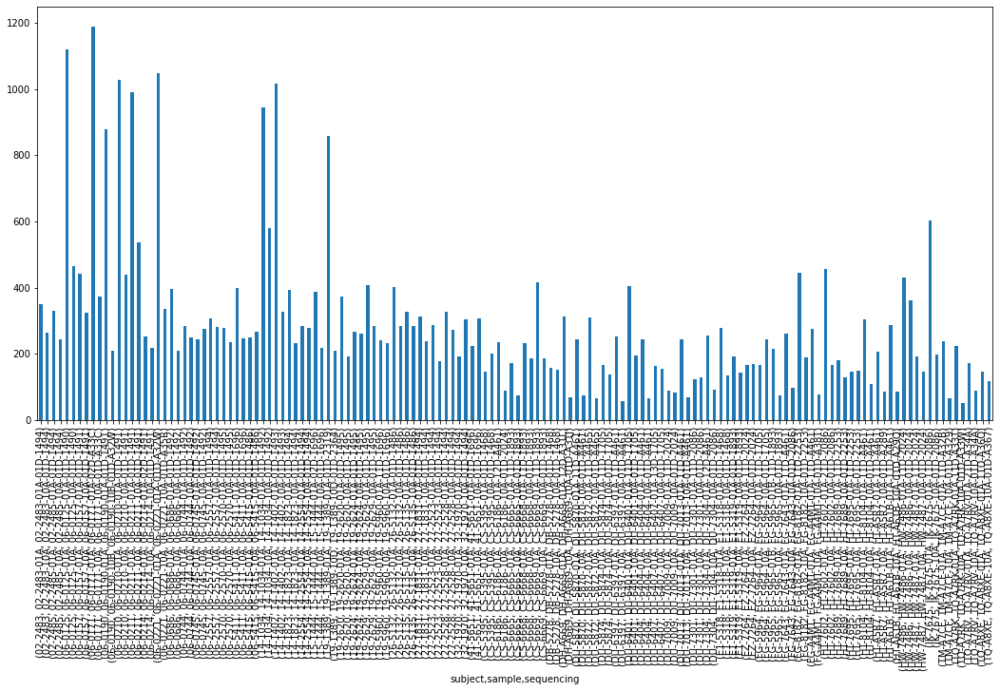

In [76]:
tmp[tmp>=0].plot(kind='bar')
plt.show()

# Read RAW read counts

In [77]:
rc=pd.read_csv('TCGA/sequencing_paired_read_counts.csv',header=None,names=['sequencing','count'])
#rc['sample']=rc['sequencing'].str[0:11]
rc.head()

,sequencing,count
0,02-2483-01A-01D-1494,566024474
1,02-2483-10A-01D-1494,579304076
2,02-2485-01A-01D-1494,575060540
3,02-2485-10A-01D-1494,478851061
4,06-0125-01A-01D-1490,1066268796


---

# Normalize tmp by RAW read count

In [78]:
#df.reset_index(inplace=True)

In [79]:
#tmp=df.merge(rc,on='sample')
tmp=df.merge(rc,on='sequencing')
#tmp.drop('sequencing',axis='columns',inplace=True)
#df.set_index(['subject','sample','sequencing'],inplace=True)
#tmp.set_index(['subject','sample','sequencing'],inplace=True)
tmp.set_index(['sequencing'],inplace=True)
tmp

,chr1 1102000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 2211000,chr1 3129000,chr1 3315000,chr1 3321000,...,chrY 15774000,chrY 17181000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,count
sequencing,,,,,,,,,,,,,,,,,,,,,
02-2483-01A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,566024474
02-2483-10A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,579304076
02-2485-01A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,575060540
02-2485-10A-01D-1494,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,478851061
06-0125-01A-01D-1490,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1066268796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TQ-A7RK-10A-01D-A33W,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,372900517
TQ-A7RV-01A-21D-A34A,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,626661130
TQ-A7RV-10A-01D-A34A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,362586651


In [80]:
tmp[tmp.columns[tmp.columns.str.contains("^chr")]]=(
    1e9*tmp[tmp.columns[tmp.columns.str.contains("^chr")]].values)/tmp[['count']].values
tmp

,chr1 1102000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 2211000,chr1 3129000,chr1 3315000,chr1 3321000,...,chrY 15774000,chrY 17181000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,count
sequencing,,,,,,,,,,,,,,,,,,,,,
02-2483-01A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,566024474
02-2483-10A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,579304076
02-2485-01A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.74,575060540
02-2485-10A-01D-1494,0.0,0.0,0.0,0.0,0.0,2.09,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,478851061
06-0125-01A-01D-1490,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,1066268796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TQ-A7RK-10A-01D-A33W,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,372900517
TQ-A7RV-01A-21D-A34A,0.0,0.0,0.0,0.0,0.0,1.60,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,626661130
TQ-A7RV-10A-01D-A34A,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,362586651


In [81]:
tmp=tmp[tmp>threshold].count(axis='columns')
tmp

sequencing
02-2483-01A-01D-1494    1106
02-2483-10A-01D-1494     983
02-2485-01A-01D-1494    1069
02-2485-10A-01D-1494     975
06-0125-01A-01D-1490    1119
                        ... 
TQ-A7RK-10A-01D-A33W     340
TQ-A7RV-01A-21D-A34A     660
TQ-A7RV-10A-01D-A34A     441
TQ-A8XE-01A-11D-A36O     263
TQ-A8XE-10A-01D-A367     563
Length: 146, dtype: int64

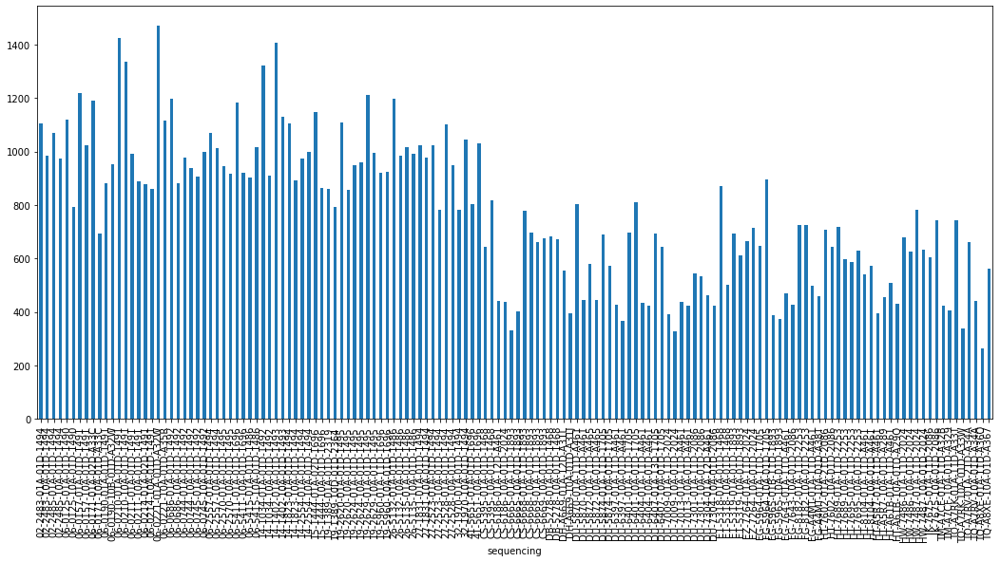

In [82]:
tmp[tmp>=0].plot(kind='bar')
plt.show()

---

# Normalize df

In [83]:
df.reset_index(inplace=True)
df=df.merge(rc,on='sequencing')
df.set_index(['subject','sample','sequencing'],inplace=True)
df=df.droplevel('sequencing',axis='index')
df[df.columns[df.columns.str.contains("^chr")]]=(
    1e9*df[df.columns[df.columns.str.contains("^chr")]].values)/df[['count']].values
df.drop('count',axis='columns',inplace=True)
df

chr1 1102000  chr1 1308000  chr1 1409000  chr1 1410000  \
subject sample                                                                
02-2483 02-2483-01A           0.0           0.0           0.0           0.0   
        02-2483-10A           0.0           0.0           0.0           0.0   
02-2485 02-2485-01A           0.0           0.0           0.0           0.0   
        02-2485-10A           0.0           0.0           0.0           0.0   
06-0125 06-0125-01A           0.0           0.0           0.0           0.0   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0           0.0           0.0   
TQ-A7RV TQ-A7RV-01A           0.0           0.0           0.0           0.0   
        TQ-A7RV-10A           0.0           0.0           0.0           0.0   
TQ-A8XE TQ-A8XE-01A           0.0           0.0           0.0           0.0   
        TQ-A8XE-10A           0.0           0.0           0.0           0.0   

                     chr1 1580000  chr1 1581000  chr1 2211000  chr1 3129000  \
subject sample                                                                
02-2483 02-2483-01A           0.0          0.00           0.0           0.0   
        02-2483-10A           0.0          0.00           0.0           0.0   
02-2485 02-2485-01A           0.0          0.00           0.0           0.0   
        02-2485-10A           0.0          2.09           0.0           0.0   
06-0125 06-0125-01A           0.0          0.00           0.0           0.0   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0          0.00           0.0           0.0   
TQ-A7RV TQ-A7RV-01A           0.0          1.60           0.0           0.0   
        TQ-A7RV-10A           0.0          0.00           0.0           0.0   
TQ-A8XE TQ-A8XE-01A           0.0          1.38           0.0           0.0   
        TQ-A8XE-10A           0.0          0.00           0.0           0.0   

                     chr1 3315000  chr1 3321000  ...  chrY 15075000  \
subject sample                                   ...                  
02-2483 02-2483-01A           0.0           0.0  ...            0.0   
        02-2483-10A           0.0           0.0  ...            0.0   
02-2485 02-2485-01A           0.0           0.0  ...            0.0   
        02-2485-10A           0.0           0.0  ...            0.0   
06-0125 06-0125-01A           0.0           0.0  ...            0.0   
...                           ...           ...  ...            ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0  ...            0.0   
TQ-A7RV TQ-A7RV-01A           0.0           0.0  ...            0.0   
        TQ-A7RV-10A           0.0           0.0  ...            0.0   
TQ-A8XE TQ-A8XE-01A           0.0           0.0  ...            0.0   
        TQ-A8XE-10A           0.0           0.0  ...            0.0   

                     chrY 15774000  chrY 17181000  chrY 19536000  \
subject sample                                                     
02-2483 02-2483-01A            0.0            0.0            0.0   
        02-2483-10A            0.0            0.0            0.0   
02-2485 02-2485-01A            0.0            0.0            0.0   
        02-2485-10A            0.0            0.0            0.0   
06-0125 06-0125-01A            0.0            0.0            0.0   
...                            ...            ...            ...   
TQ-A7RK TQ-A7RK-10A            0.0            0.0            0.0   
TQ-A7RV TQ-A7RV-01A            0.0            0.0            0.0   
        TQ-A7RV-10A            0.0            0.0            0.0   
TQ-A8XE TQ-A8XE-01A            0.0            0.0            0.0   
        TQ-A8XE-10A            0.0            0.0            0.0   

                     chrY 19699000  chrY 19700000  chrY 20553000  \
subject sample                                                     
02-2483 02-2483-01A 

# drop any that are all 0

In [84]:
df.drop(df.columns[df.sum(axis='index')==0],axis='columns',inplace=True)
df

chr1 1410000  chr1 1581000  chr1 3315000  chr1 3321000  \
subject sample                                                                
02-2483 02-2483-01A           0.0          0.00           0.0           0.0   
        02-2483-10A           0.0          0.00           0.0           0.0   
02-2485 02-2485-01A           0.0          0.00           0.0           0.0   
        02-2485-10A           0.0          2.09           0.0           0.0   
06-0125 06-0125-01A           0.0          0.00           0.0           0.0   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0          0.00           0.0           0.0   
TQ-A7RV TQ-A7RV-01A           0.0          1.60           0.0           0.0   
        TQ-A7RV-10A           0.0          0.00           0.0           0.0   
TQ-A8XE TQ-A8XE-01A           0.0          1.38           0.0           0.0   
        TQ-A8XE-10A           0.0          0.00           0.0           0.0   

                     chr1 4763000  chr1 5112000  chr1 6304000  chr1 6306000  \
subject sample                                                                
02-2483 02-2483-01A           0.0           0.0          0.00          0.00   
        02-2483-10A           0.0           0.0          0.00          0.00   
02-2485 02-2485-01A           0.0           0.0          0.00          0.00   
        02-2485-10A           0.0           0.0          0.00          0.00   
06-0125 06-0125-01A           0.0           0.0          0.94          0.00   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0          0.00          5.36   
TQ-A7RV TQ-A7RV-01A           0.0           0.0          0.00          0.00   
        TQ-A7RV-10A           0.0           0.0          0.00          0.00   
TQ-A8XE TQ-A8XE-01A           0.0           0.0          0.00          6.90   
        TQ-A8XE-10A           0.0           0.0          0.00          8.08   

                     chr1 6714000  chr1 6716000  ...  chrY 12352000  \
subject sample                                   ...                  
02-2483 02-2483-01A          0.00          8.83  ...           3.53   
        02-2483-10A          0.00          5.18  ...           3.45   
02-2485 02-2485-01A          0.00          1.74  ...           3.48   
        02-2485-10A          0.00          0.00  ...           8.35   
06-0125 06-0125-01A          0.94          2.81  ...           0.00   
...                           ...           ...  ...            ...   
TQ-A7RK TQ-A7RK-10A          0.00          0.00  ...           0.00   
TQ-A7RV TQ-A7RV-01A          1.60          3.19  ...           0.00   
        TQ-A7RV-10A          0.00          0.00  ...           0.00   
TQ-A8XE TQ-A8XE-01A          0.00          0.00  ...           0.00   
        TQ-A8XE-10A          0.00          8.08  ...           0.00   

                     chrY 12452000  chrY 12878000  chrY 12879000  \
subject sample                                                     
02-2483 02-2483-01A           7.07            0.0            0.0   
        02-2483-10A           1.73            0.0            0.0   
02-2485 02-2485-01A           1.74            0.0            0.0   
        02-2485-10A           4.18            0.0            0.0   
06-0125 06-0125-01A           0.00            0.0            0.0   
...                            ...            ...            ...   
TQ-A7RK TQ-A7RK-10A           0.00            0.0            0.0   
TQ-A7RV TQ-A7RV-01A           3.19            0.0            0.0   
        TQ-A7RV-10A           5.52            0.0            0.0   
TQ-A8XE TQ-A8XE-01A           0.00            0.0            0.0   
        TQ-A8XE-10A           0.00            0.0            0.0   

                     chrY 14539000  chrY 14669000  chrY 19536000  \
subject sample                                                     
02-2483 02-2483-01A 

# Match earlier HERVK113 notebook counts
* CS-5390-10A - 553
* FG-5963-01A - 68
* CS-6186-01A - 1100
* CS-6186-10A - 950
* DU-5872-01A - 1108
* DU-5872-10A - 776
* 02-2483-01A - 568
* 02-2483-10A - 557
* 02-2485-01A - 587
* 02-2485-10A - 498
* 06-0125-01A - 734

## Keep only Broad and drop Harvard Medical School

### Harvard's samples were really low coverage?

## Search for the presence of HKLE insertions with positions unique to tumor or normal

### Copy raw dataframe, remove sample level and clear out the values

compdf2=df.copy()
compdf2.drop(compdf2.loc[compdf2.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)
compdf2=compdf2.droplevel('sample',axis='index')
compdf2.loc[:,:] = 0
compdf2.head(10)

## Ok. This is some dark magic I think. Gotta be a better, cleaner way to do this.

* Loop over the subjects and hkles. (Loops aren't really pythony.)
* Do an "XOR-AND" for the first (tumor 01) and second (normal 10) samples.
* This returns a Boolean mask
* Change it to 0/1
* Subtract the tumor array from the normal array and assign it to the subject/hkle

### This will create a dataframe of positions representing "tumor - normal" so with values of only

* -1 : normal only
*  0 : both or neither
* +1 : tumor only


for subject in df.index.get_level_values('subject').unique():
    for hkle in df.index.get_level_values('hkle').unique():
        tm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[0]>0))
        tm.replace([False,True],[0,1],inplace=True)
        nm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[1]>0))
        nm.replace([False,True],[0,1],inplace=True)
        compdf2.loc[subject,hkle]=tm.values-nm.values

compdf.equals(compdf2)

# New technique. Separate the tumor and normal counts.
### Remove the sample column
### DO NOT RESHAPE

In [85]:
n=df.copy()    # NORMAL
t=df.copy()    # TUMOR

In [86]:
n.drop(n.loc[n.index.get_level_values('sample').str.contains("-01.$")].index,axis='index',inplace=True)
t.drop(t.loc[t.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)

In [87]:
n=n.droplevel('sample',axis='index')
t=t.droplevel('sample',axis='index')

In [88]:
n.head()

,chr1 1410000,chr1 1581000,chr1 3315000,chr1 3321000,chr1 4763000,chr1 5112000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,...,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 14539000,chrY 14669000,chrY 19536000,chrY 20553000,chrY 21047000,chrY 21217000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,5.18,...,3.45,1.73,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
02-2485,0.0,2.09,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,...,8.35,4.18,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
06-0125,0.0,1.44,0.0,0.0,0.0,0.0,0.0,0.0,1.44,2.88,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
06-0157,0.0,1.78,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0
06-0171,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1.39,2.77,...,0.00,4.16,0.0,0.0,0.0,0.0,0.0,0.0,1.39,0.0


In [89]:
t.head()

,chr1 1410000,chr1 1581000,chr1 3315000,chr1 3321000,chr1 4763000,chr1 5112000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,...,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 14539000,chrY 14669000,chrY 19536000,chrY 20553000,chrY 21047000,chrY 21217000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,8.83,...,3.53,7.07,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00
02-2485,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,1.74,...,3.48,1.74,0.0,0.0,0.0,0.0,0.0,0.00,0.0,1.74
06-0125,0.0,0.0,0.0,0.0,0.0,0.0,0.94,0.0,0.94,2.81,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00
06-0157,0.0,0.0,0.0,0.0,0.0,0.0,1.81,0.0,0.00,1.81,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00
06-0171,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,...,0.85,2.56,0.0,0.0,0.0,0.0,0.0,0.85,0.0,0.85


In [90]:
n_index=n.index
t_index=t.index

### Compare the indexes. An empty array shows that the indexes are the same. Yay.

In [91]:
n_index[n_index != t_index]

Index([], dtype='object', name='subject')

In [92]:
compdf=(
    ((n>threshold)^(t>threshold))&(t>threshold)).replace([False,True],[0,1]) - (
    ((n>threshold)^(t>threshold))&(n>threshold)).replace([False,True],[0,1])

In [93]:
compdf

,chr1 1410000,chr1 1581000,chr1 3315000,chr1 3321000,chr1 4763000,chr1 5112000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,...,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 14539000,chrY 14669000,chrY 19536000,chrY 20553000,chrY 21047000,chrY 21217000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
02-2485,0,0,0,0,0,0,0,0,0,0,...,0,-1,0,0,0,0,0,0,0,0
06-0125,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,-1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IK-7675,0,0,0,0,0,0,0,-1,0,0,...,0,1,0,0,0,0,0,0,0,0
TM-A7CF,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
TQ-A7RK,0,0,0,0,0,0,0,-1,0,0,...,1,0,0,0,0,0,0,0,0,0


### This is cleaner, faster and more pythonic than what follows for compdf.


In [94]:
compdf.head()

,chr1 1410000,chr1 1581000,chr1 3315000,chr1 3321000,chr1 4763000,chr1 5112000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,...,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 14539000,chrY 14669000,chrY 19536000,chrY 20553000,chrY 21047000,chrY 21217000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
02-2485,0,0,0,0,0,0,0,0,0,0,...,0,-1,0,0,0,0,0,0,0,0
06-0125,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,-1,0,0,0,0,0,0,0,0


In [95]:
compdf.shape

(73, 5005)

### Keep only positions with any sample with something other than 0

### We lose over 3000 positions

In [96]:
compdf=compdf.loc[:, (compdf != 0).any(axis=0)]

In [97]:
compdf.shape

(73, 3518)

In [98]:
compdf

,chr1 1581000,chr1 3315000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7602000,chr1 7952000,chr1 8503000,chr1 8912000,...,chrX 155223000,chrY 4294000,chrY 4296000,chrY 7180000,chrY 8917000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 19536000,chrY 20553000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,-1,0,0,0,0,...,0,0,0,-1,0,0,1,0,0,0
02-2485,0,0,0,0,0,-1,0,1,1,0,...,0,-1,-1,-1,0,0,-1,0,0,0
06-0125,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,0,0,0,0,-1,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,-1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IK-7675,0,0,-1,0,0,0,-1,1,0,0,...,0,-1,0,-1,0,0,1,0,0,0
TM-A7CF,0,0,1,0,0,0,0,-1,0,0,...,0,0,0,0,0,0,0,0,0,0
TQ-A7RK,0,0,-1,0,0,0,0,0,0,0,...,0,-1,0,0,0,1,0,0,0,0


### Get the chromosome columns for analysis after merging with the metadata

In [99]:
#chromosome_columns=compdf.columns[compdf.columns.get_level_values('chromosome').str.contains("^chr")]
chromosome_columns=compdf.columns[compdf.columns.str.contains("^chr")]
chromosome_columns

Index(['chr1 1581000', 'chr1 3315000', 'chr1 6306000', 'chr1 6714000',
       'chr1 6716000', 'chr1 7600000', 'chr1 7602000', 'chr1 7952000',
       'chr1 8503000', 'chr1 8912000',
       ...
       'chrX 155223000', 'chrY 4294000', 'chrY 4296000', 'chrY 7180000',
       'chrY 8917000', 'chrY 12352000', 'chrY 12452000', 'chrY 12878000',
       'chrY 19536000', 'chrY 20553000'],
      dtype='object', length=3518)

### Merge with the metadata for later grouping

In [100]:
compdf.reset_index(inplace=True)
compdf=pd.merge(compdf,meta,on='subject',how='left')
#compdf=compdf.merge(meta,on='subject',how='inner')
#compdf=compdf.merge(meta,on='subject')
#compdf.set_index(['subject','hkle'],inplace=True)
compdf.set_index(['subject'],inplace=True)
compdf.head()

,chr1 1581000,chr1 3315000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7602000,chr1 7952000,chr1 8503000,chr1 8912000,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name,unknown
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,-1,0,0,0,0,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
02-2485,0,0,0,0,0,-1,0,1,1,0,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
06-0125,0,0,0,0,0,1,0,0,0,0,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
06-0157,0,0,0,0,0,0,0,0,0,-1,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
06-0171,0,0,0,0,0,0,0,0,0,0,...,Henry Ford Hospital,NaN,65.0,13.11,1.0,399.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


### More dark magic here. 

* Select all subjects and HERVK113 on the y-axis and all the chromosome columns on the x-axis.
* We will count all the incidence of each of the previously computed "tumor-normal" values
* Then we will transpose and sort descending by "-1". This will put the highest occurence of normal at the top.


In [101]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:10'

In [102]:
compdf.shape

(73, 3540)

In [103]:
#compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
compdf[chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[-1],ascending=False).head(10)


,-1,0,1
chr10 43244000,24.0,33.0,16.0
chr10 75749000,23.0,34.0,16.0
chr10 31978000,23.0,38.0,12.0
chr10 51392000,23.0,33.0,17.0
chr13 51077000,23.0,34.0,16.0
chr9 87760000,22.0,34.0,17.0
chr2 192893000,22.0,37.0,14.0
chr10 120214000,22.0,34.0,17.0
chr3 118717000,22.0,49.0,2.0
chr4 78006000,22.0,39.0,12.0


In [104]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:14'

### We see that the unique normal positions aren't really that unique.

### If we do the same, but sort by tumor ...

In [105]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:14'

In [106]:
#compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
#compdf.loc[pd.IndexSlice[:,],chromosome_columns].apply(
compdf[chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[1],ascending=False).head(10)


,-1,0,1
chr19 9680000,8.0,33.0,32.0
chr7 129217000,15.0,27.0,31.0
chr7 91889000,8.0,35.0,30.0
chr17 29532000,9.0,35.0,29.0
chr12 33022000,11.0,33.0,29.0
chr7 27988000,7.0,38.0,28.0
chr20 43608000,10.0,36.0,27.0
chr6 17734000,15.0,31.0,27.0
chr3 175087000,12.0,34.0,27.0
chr3 197601000,9.0,37.0,27.0


In [107]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:17'

In [108]:
def ttests_boxplots_and_heatmaps(localdf,columns,group_column,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    groups=localdf[group_column].unique().tolist()
    print("T-Testing")
    for col in columns:
        if ( col not in localdf.columns ):
            continue
        for group in groups:
            others = groups.copy()
            others.remove(group)
            for other in others:
                #t,p = stats.ttest_rel(
                t,p = stats.ttest_ind(
                    localdf[localdf[group_column]==group][col],
                    localdf[localdf[group_column]==other][col])
                #if(p<0.1):
                #    print(col,group,other,t,p)
                if(( p > 0 ) and ( p < heat_p )):
                    select_p_values.append([abs(t),p,col])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col'])                        
    pdf=pdf.drop_duplicates().sort_values('p')
    print("Boxplotting")
    for index, row in pdf.iterrows():
        if(( row['p'] > 0 ) and ( row['p'] < box_p )):
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+str(row['col']))
            
            localdf.boxplot(column=row['col'],by=[group_column])
            plt.title(str(row['col']))
            plt.xticks(rotation=75,ha='right')
            plt.show()                            

    print("Clustermapping")

    selected=['subject',group_column]
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)
    print(selected)
    
    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    #['IDH_1p19q_status' 'chrY 7711000' 'subject']
    if len(selected) > 3: #7:
        tmp=localdf[selected].copy()
        tmp.set_index(['subject',group_column],inplace=True)

        #tmp-=tmp.min() # This may almost always be 0 now.
#        tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
        # ...
        #standard_scale int or None, optional
        #Either 0 (rows) or 1 (columns).
        #Whether or not to standardize that dimension, meaning for each row or column,
        #subtract the minimum and divide each by its maximum.
        # how would that deal with 0s or empty cells

        tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this

        tmp.reset_index(inplace=True)

        tmp=tmp.sort_values([group_column])
        tmp.set_index(['subject'],inplace=True)

        diagnoses=tmp.pop(group_column)
        tmp=tmp.T

        network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                            light=.9, dark=.1, reverse=True,
                            start=1, rot=-2)
        #print(network_pal)
        network_pal
        #print('lut')
        network_lut = dict(zip(diagnoses.unique(), network_pal))
        #print(network_lut)
        #print('labels')
        # Convert the palette to vectors that will be drawn on the side of the matrix
        network_labels = diagnoses
        #print(network_labels)
        network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
        #print('colors')
        #print(network_colors)

#        print(tmp)

        g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 1 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        #g.cax.set_position([.97, .2, .03, .45])
        g.cax.set_position([0, .15, .005, .6])
        plt.show()

        g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 2 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        # [dist from left,dist from bottom?,width?,height?]
        g.cax.set_position([0, .15, .005, .6])
        plt.show()  
        


        pcadf=localdf[selected].copy()

        #pcadf=tmp[(tmp["Lab kit"]==labkit) & (tmp["trimmer"]==trimmer) & tmp['diag'].isin(diags)].copy()
        #pcadf=pcadf.drop('trimmer',axis='columns')
        #pcadf=pcadf.drop('Lab kit',axis='columns')
        pcadf.set_index(['subject',group_column],inplace=True)
        elements=pcadf.columns
        pcadf.reset_index(inplace=True)
        scaler = StandardScaler()
        scaler.fit(pcadf[elements])
        scaled_data = scaler.transform(pcadf[elements])
        #scaled_data[0]
        
        #ValueError: n_components=8 must be between 0 and min(n_samples, n_features)=2 with svd_solver='full'
        n=min([len(pcadf),len(pcadf.columns)-2,8])
        pca = PCA(n_components=n)
        
        pca.fit(scaled_data)
        x_pca = pca.transform(scaled_data)
        
        # for color
        groups=pcadf[group_column].unique().tolist()
        pcadf['group_index']=pcadf[group_column].apply(lambda x: groups.index(x))
        
        fig = plt.figure(figsize = (18,8))
        ax = fig.add_subplot(1,1,1) 
        ax.set_xlabel('Principal Component 1', fontsize = 15)
        ax.set_ylabel('Principal Component 2', fontsize = 15)
        ax.set_title(''+str(n)+' component PCA '+group_column, fontsize = 20)

        colors = ['r','g','b','c','m','y','k']
        for target, color in zip(groups,colors):
            indicesToKeep = pcadf[group_column] == target
            ax.scatter(x_pca[indicesToKeep, 0], x_pca[indicesToKeep, 1], c = color, s = 50)
        ax.legend(groups)
        ax.grid()
        #plt.title(group_column)
        plt.show()

    else:
        print("Not enough data to produce cluster maps")
        

In [109]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:17'

In [110]:
compdf.reset_index(inplace=True)
compdf.head()

,subject,chr1 1581000,chr1 3315000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7602000,chr1 7952000,chr1 8503000,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name,unknown
0,02-2483,0,0,0,0,0,-1,0,0,0,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
1,02-2485,0,0,0,0,0,-1,0,1,1,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
2,06-0125,0,0,0,0,0,1,0,0,0,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
3,06-0157,0,0,0,0,0,0,0,0,0,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
4,06-0171,0,0,0,0,0,0,0,0,0,...,Henry Ford Hospital,NaN,65.0,13.11,1.0,399.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


primary_diagnosis
T-Testing
Boxplotting
 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr22 19083000


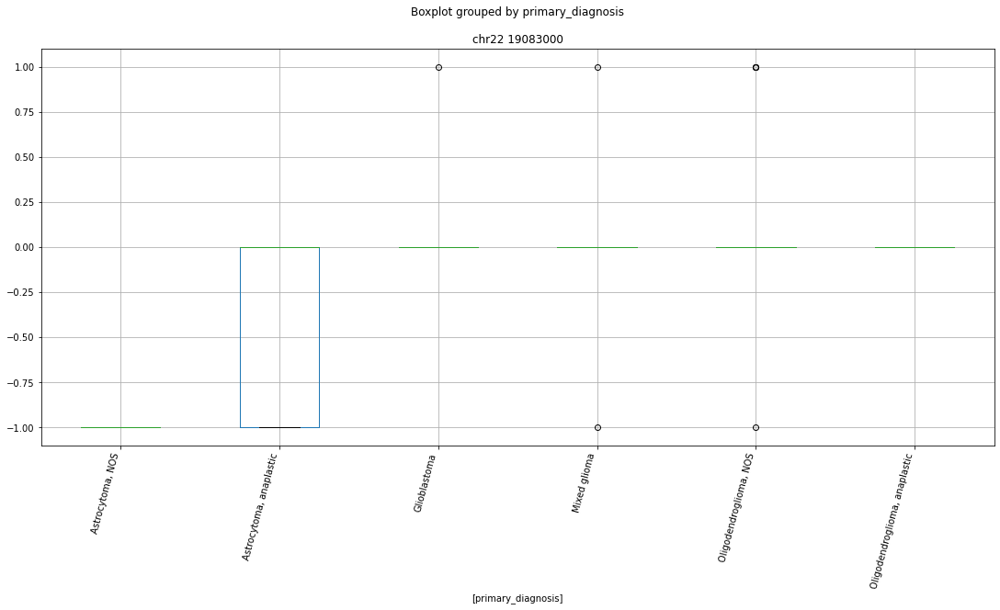

 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr11 82181000


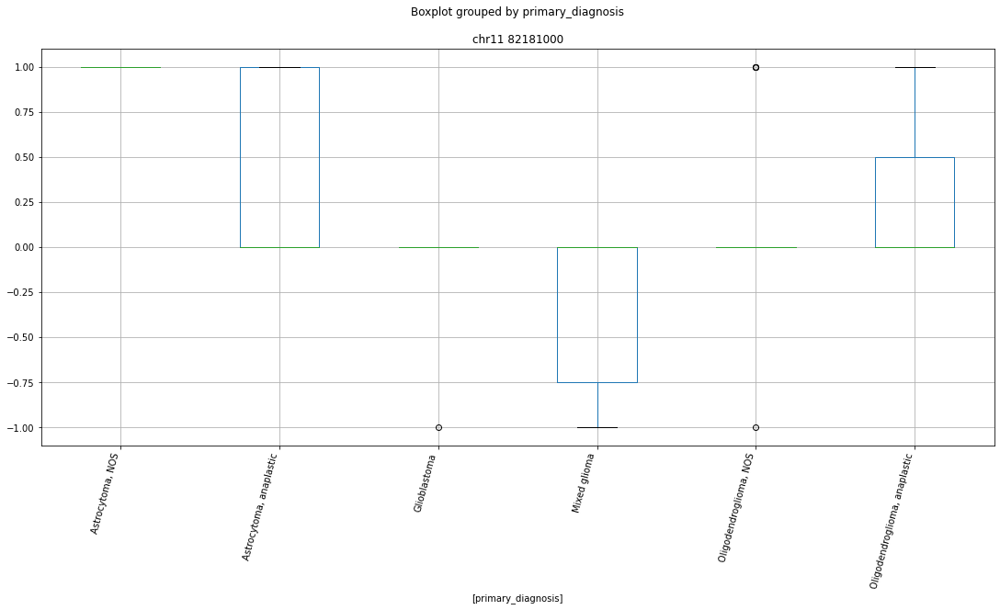

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 133484000


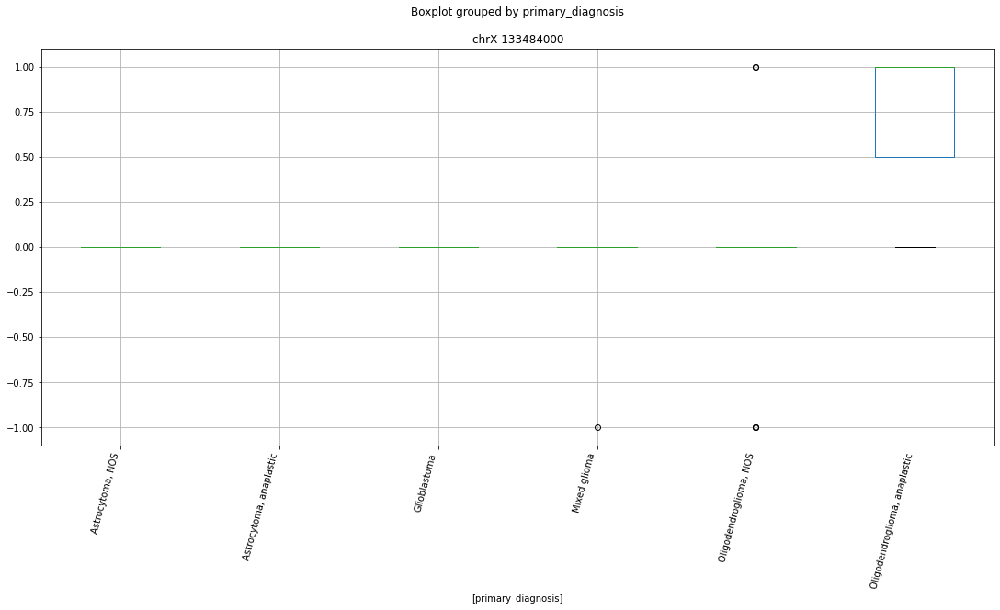

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 63808000


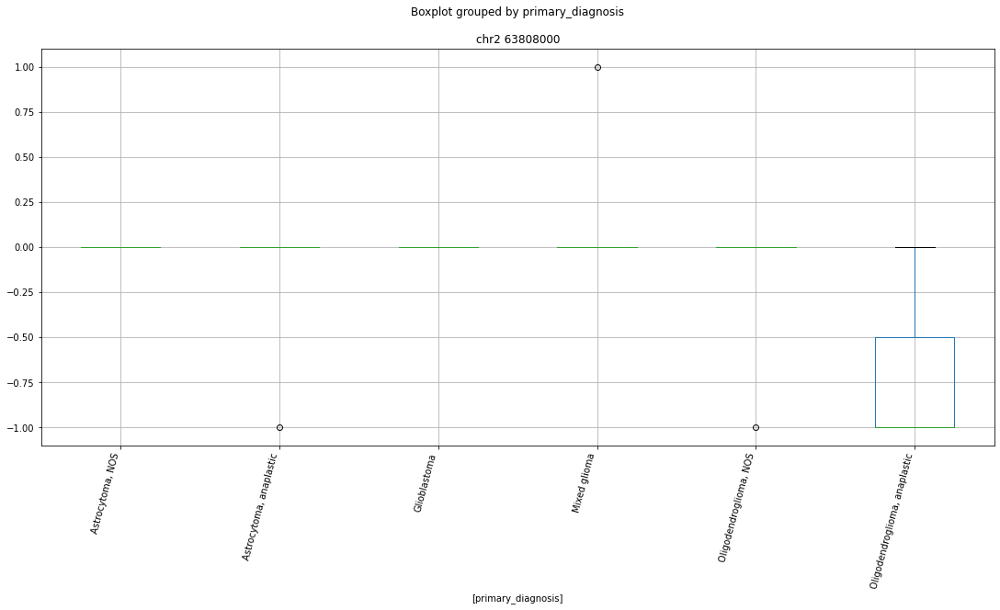

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 58454000


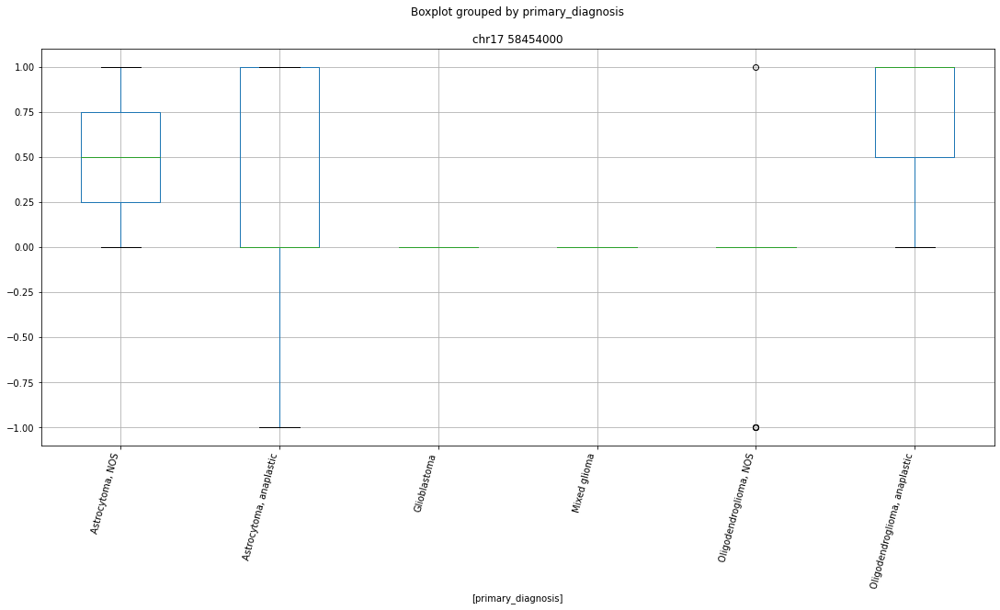

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr16 67712000


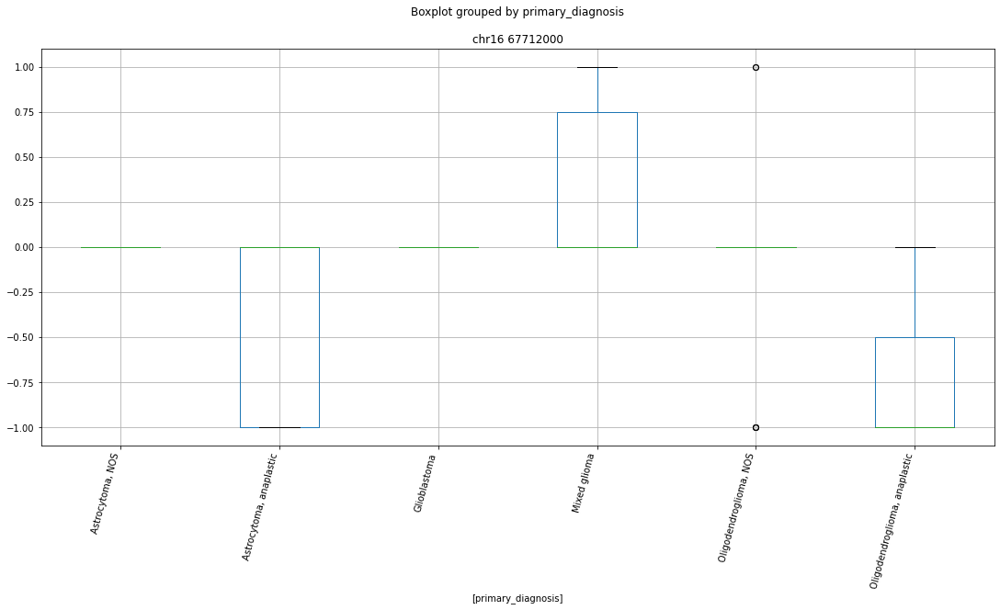

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 28838000


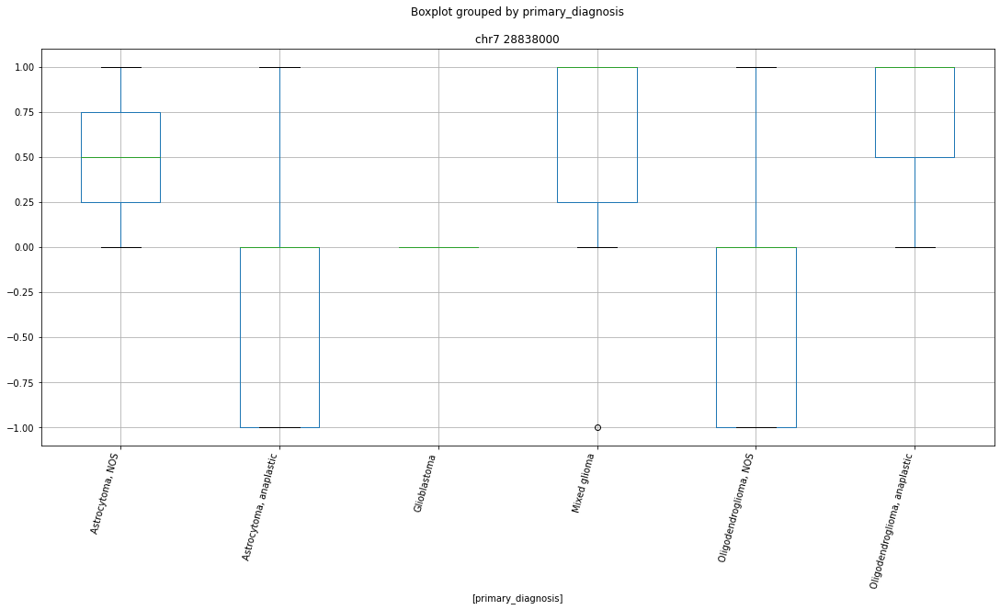

 p : 3.4049793131136327e-09  ( t : 7.895146188218008 ) :  chr14 19867000


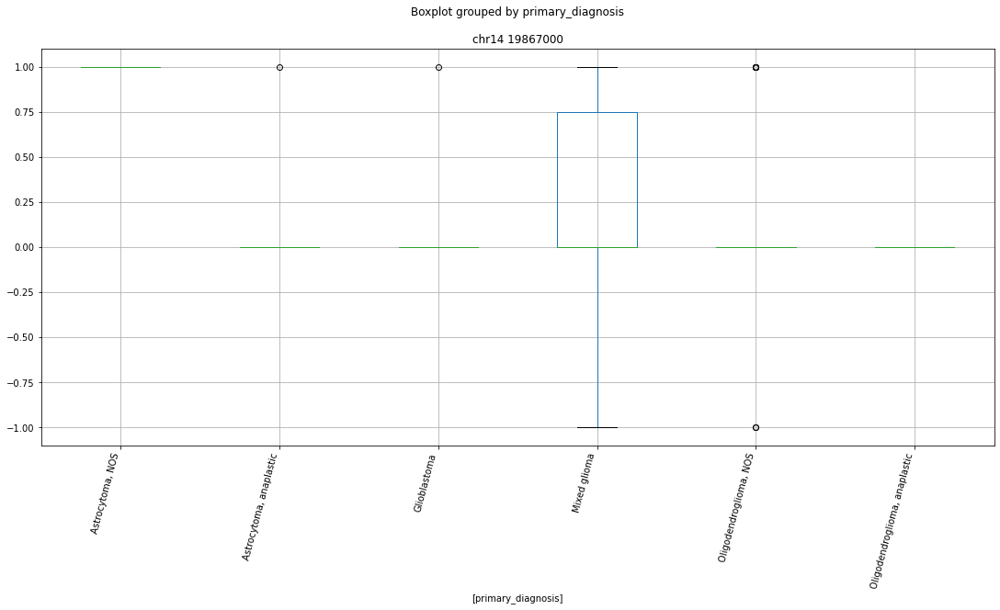

 p : 9.260861664096648e-08  ( t : 7.307041613598292 ) :  chr7 55311000


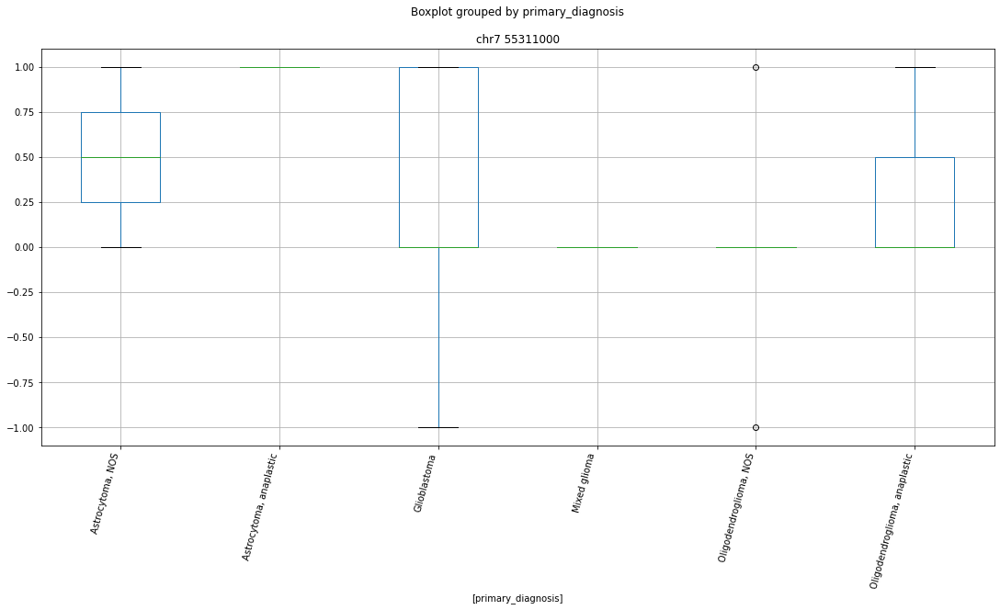

 p : 4.4800980612265565e-07  ( t : 6.940788532619723 ) :  chr19 8738000


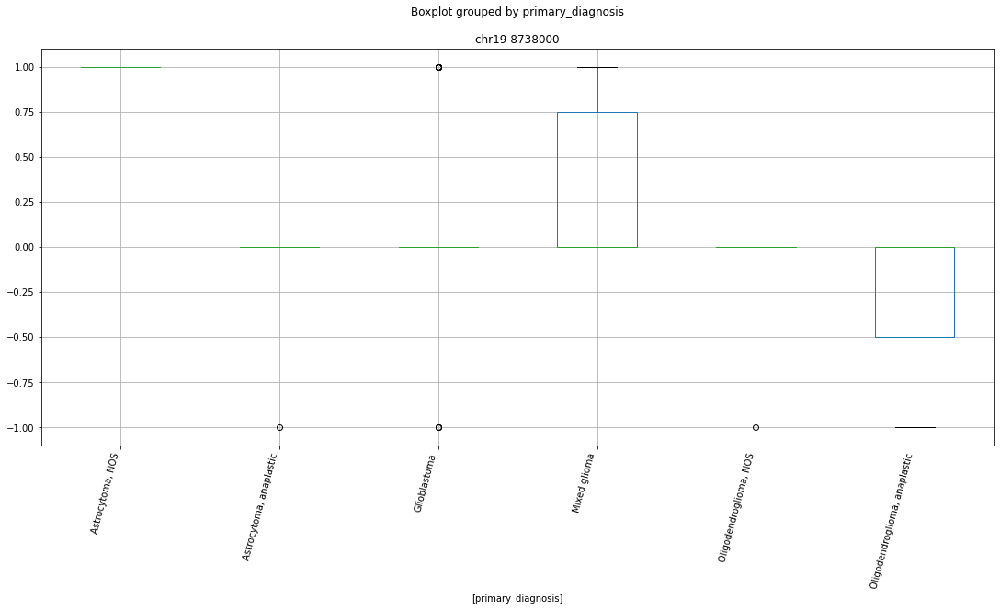

 p : 4.4800980612265565e-07  ( t : 6.940788532619723 ) :  chr10 97842000


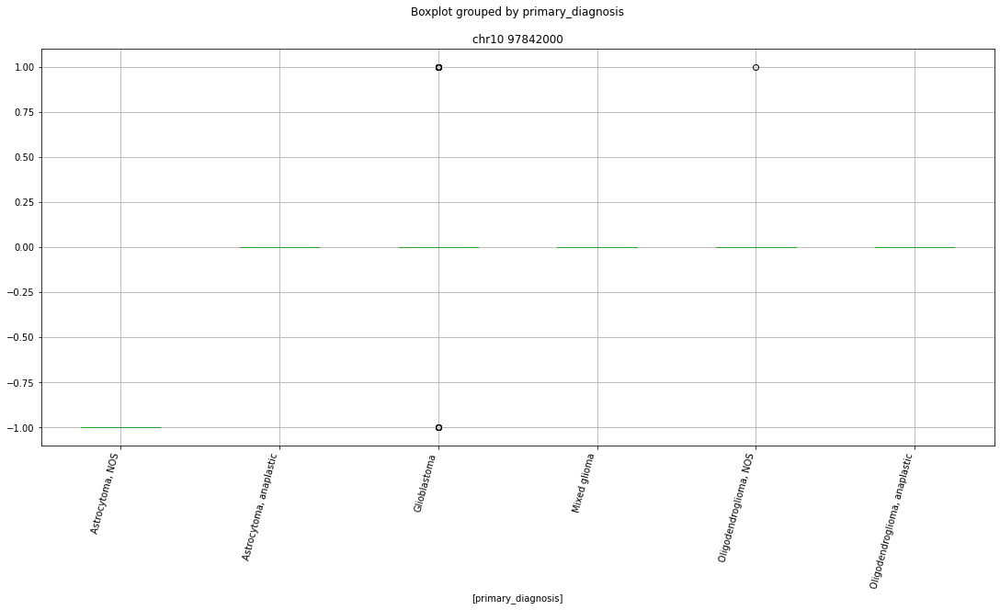

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr7 99426000


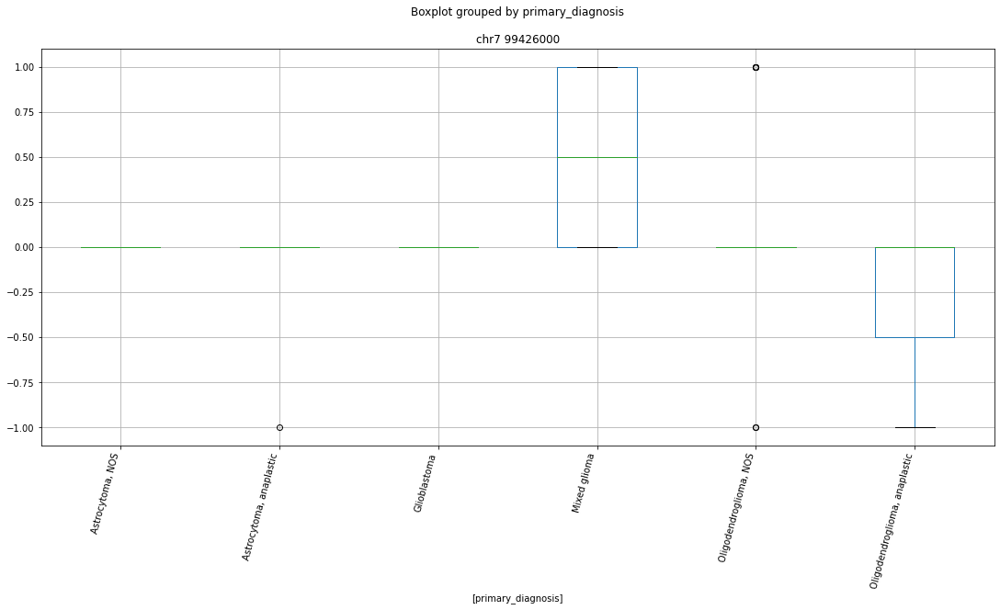

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr16 49211000


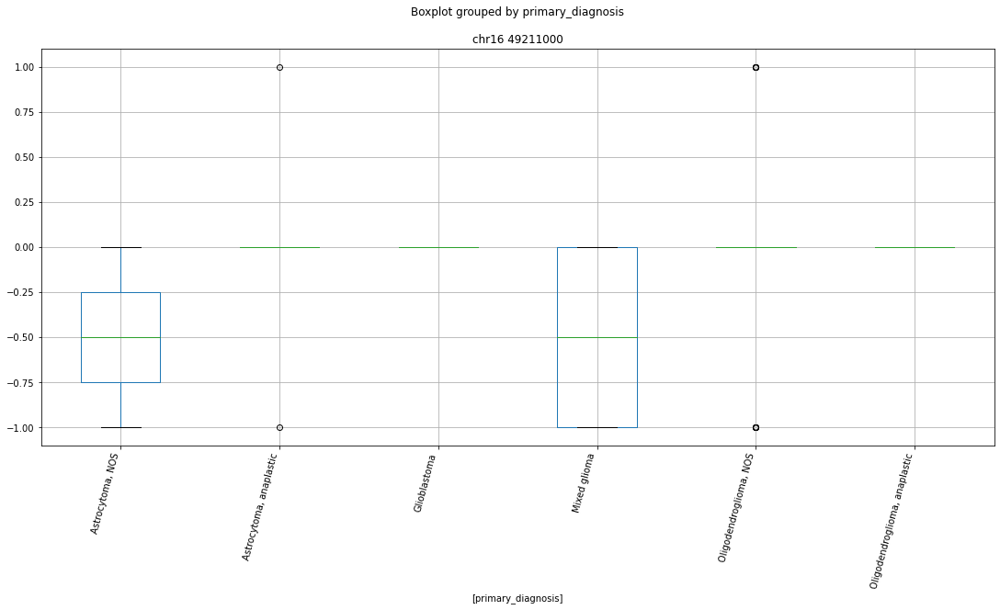

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr11 118729000


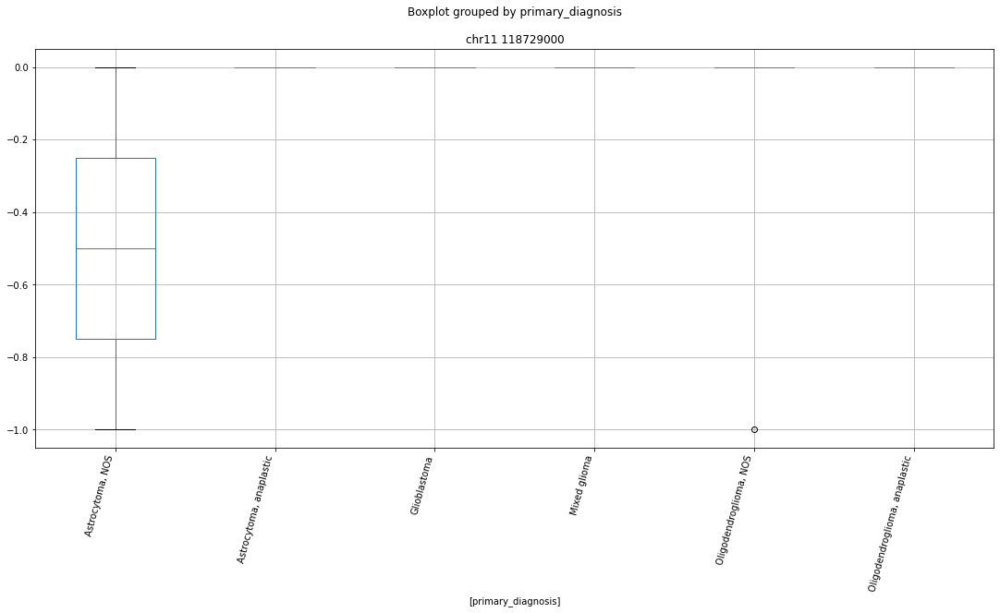

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr22 25278000


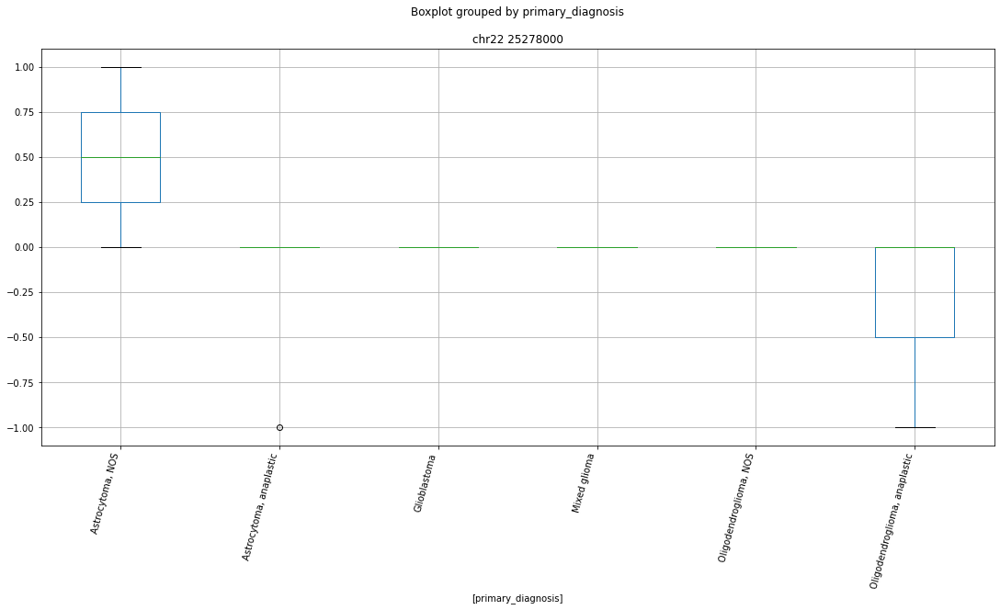

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr15 20203000


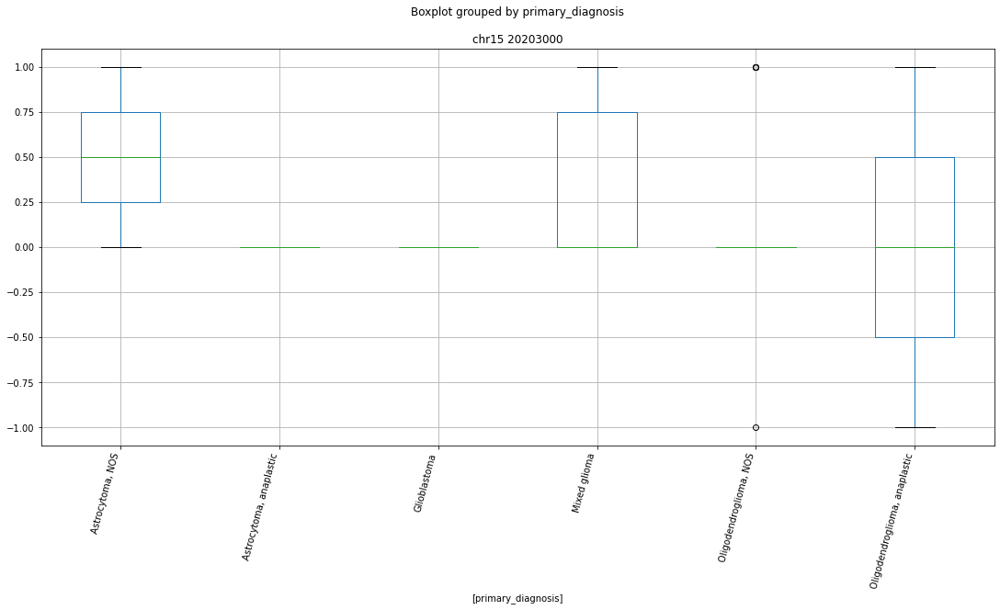

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr11 131085000


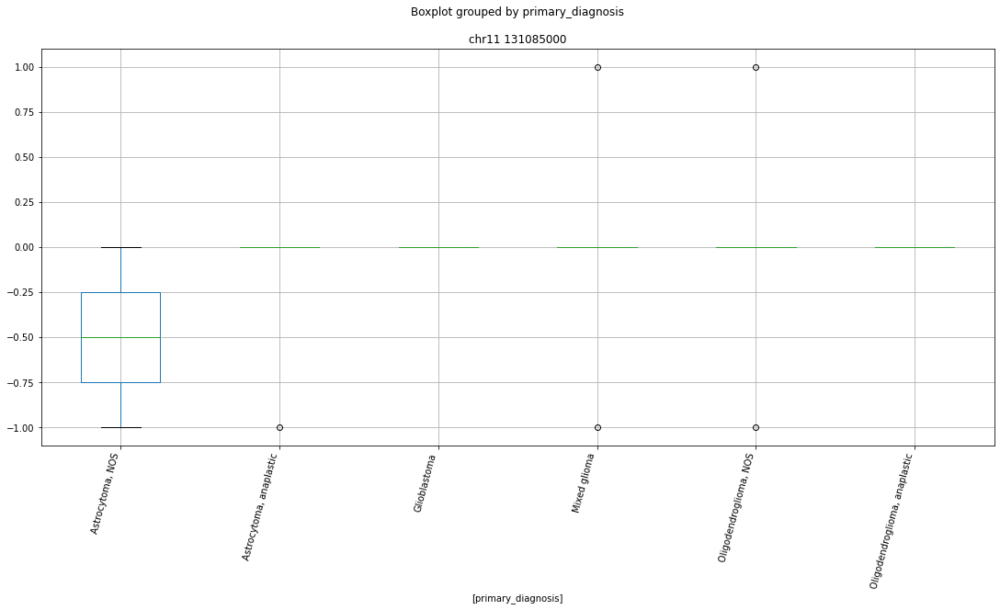

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 146095000


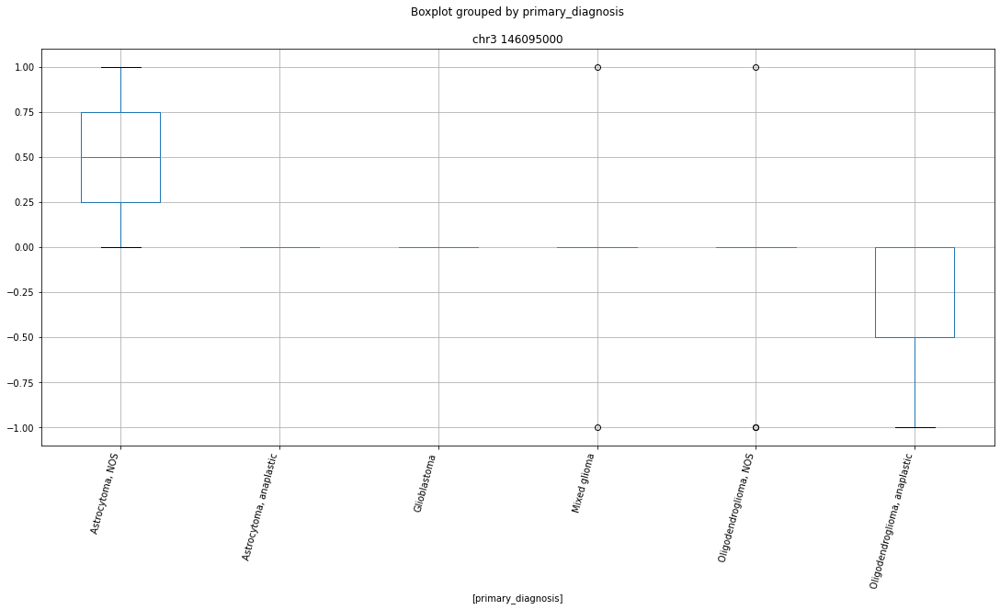

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr5 138071000


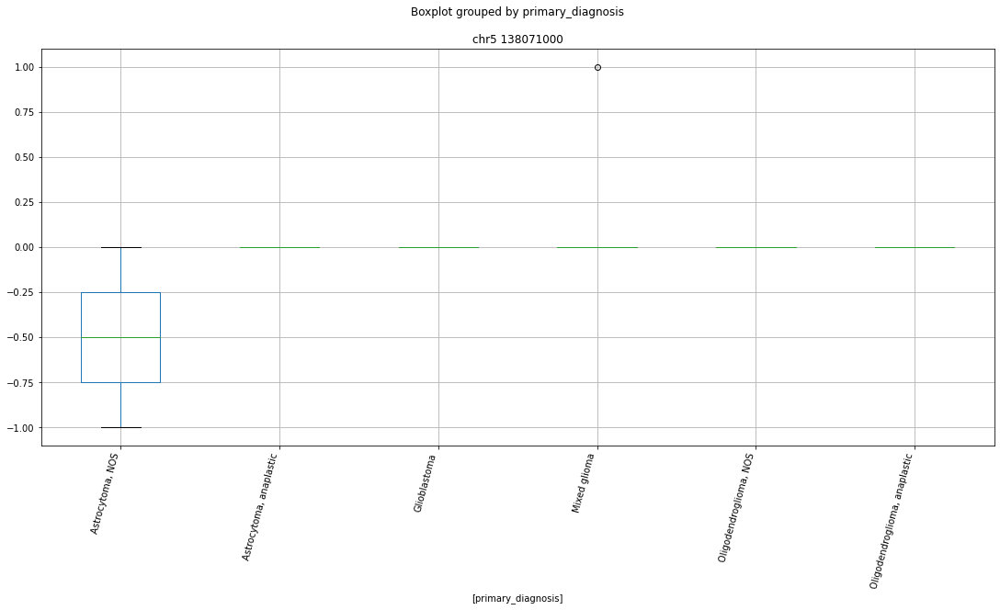

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 39914000


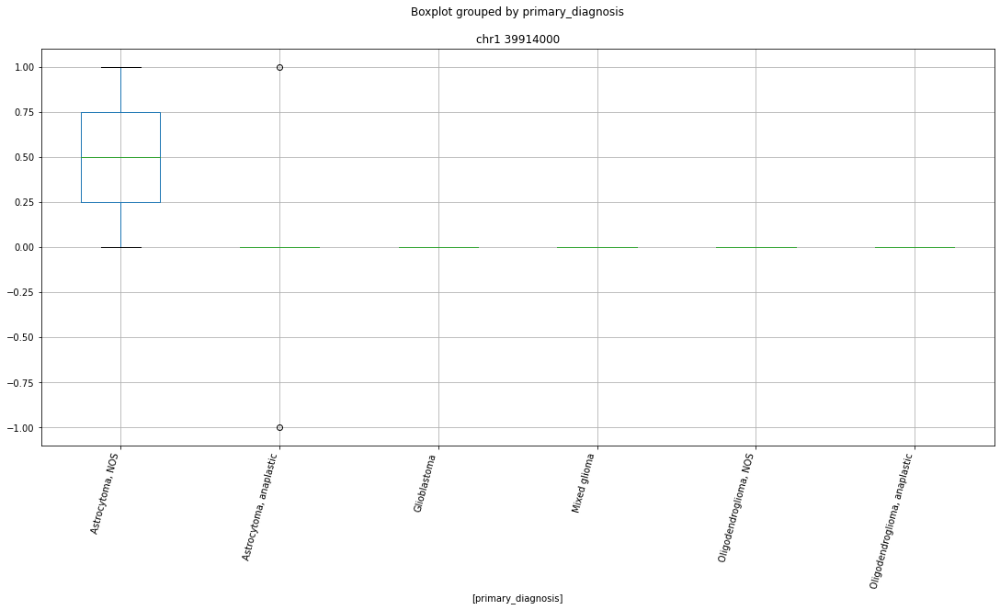

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 32663000


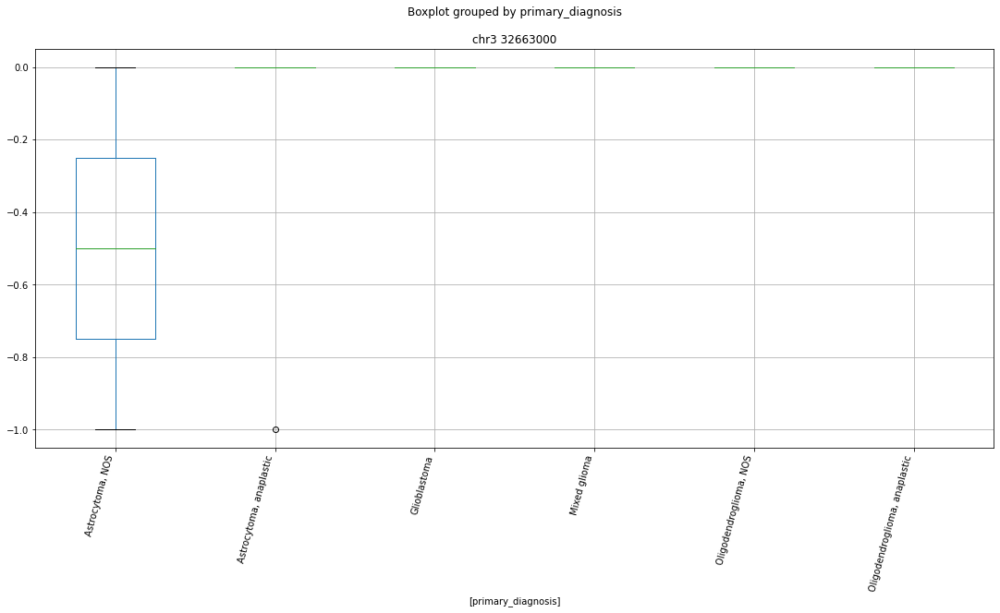

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 50313000


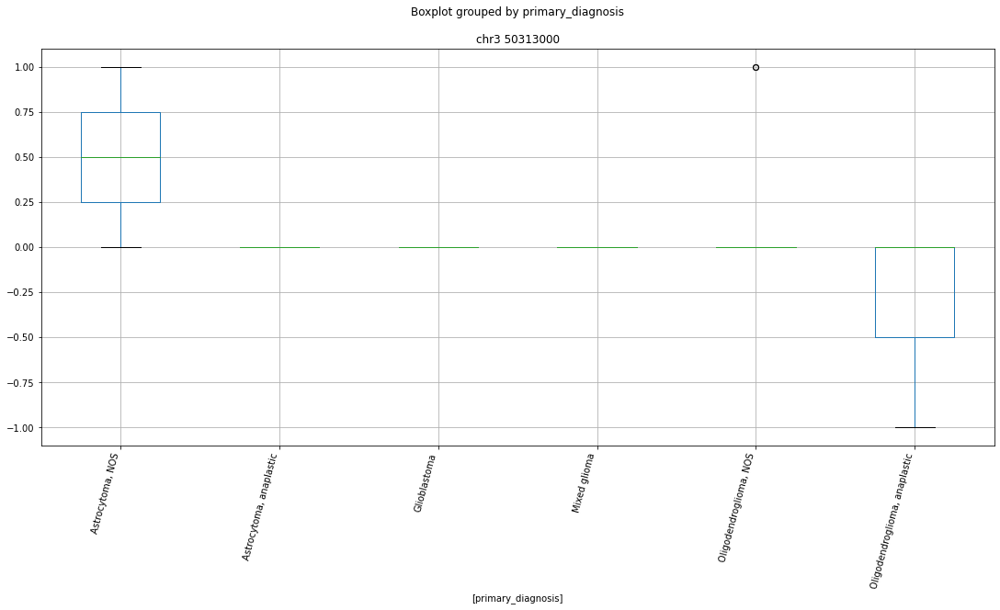

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 220467000


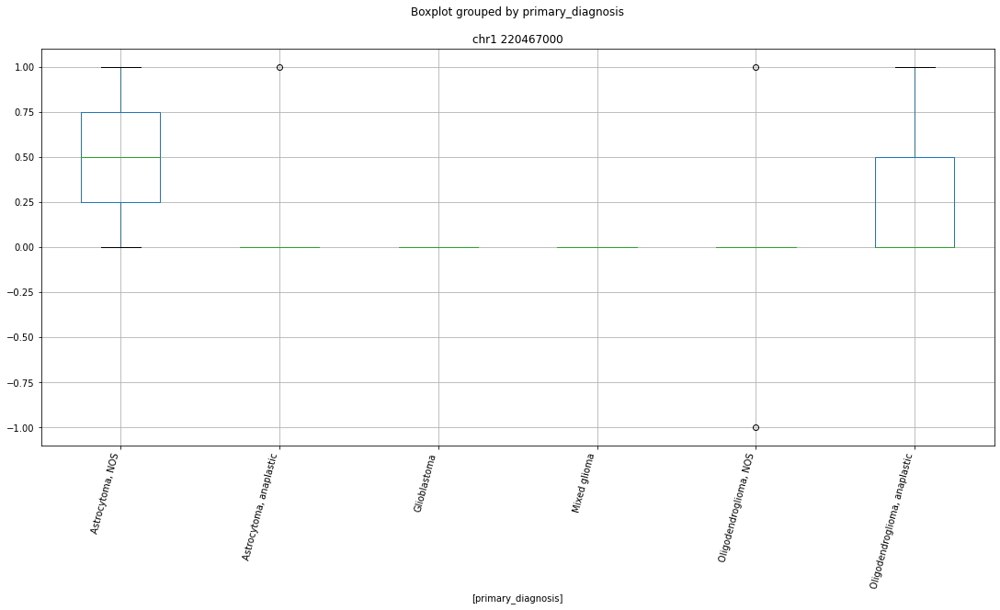

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr7 28838000


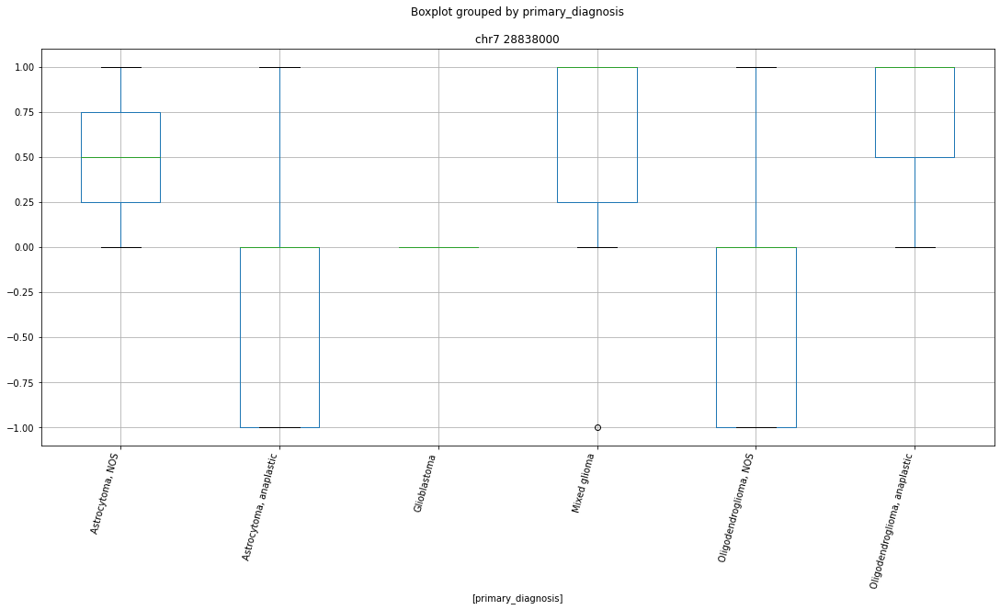

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr5 176433000


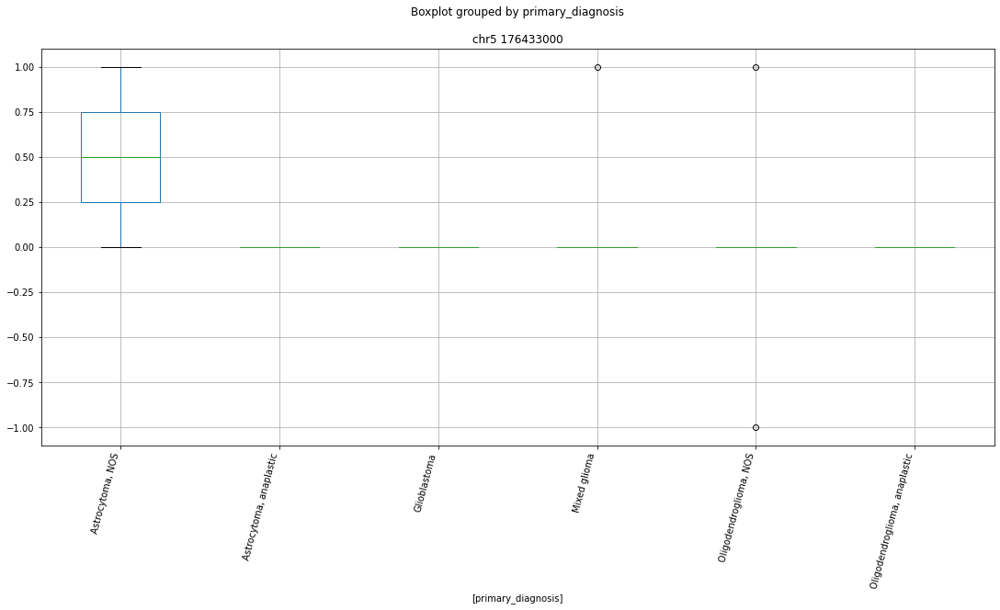

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 125517000


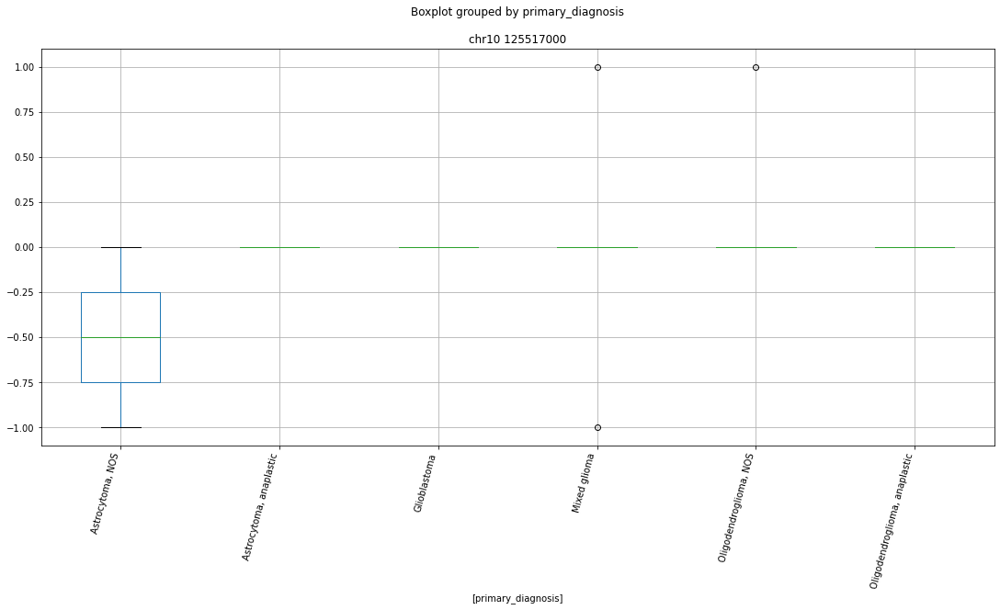

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 219544000


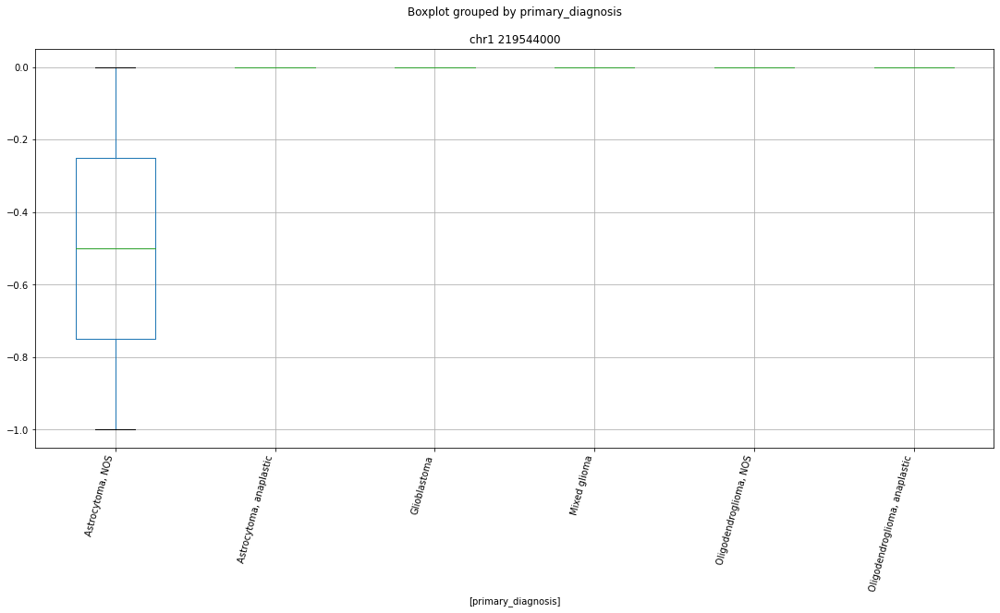

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 39807000


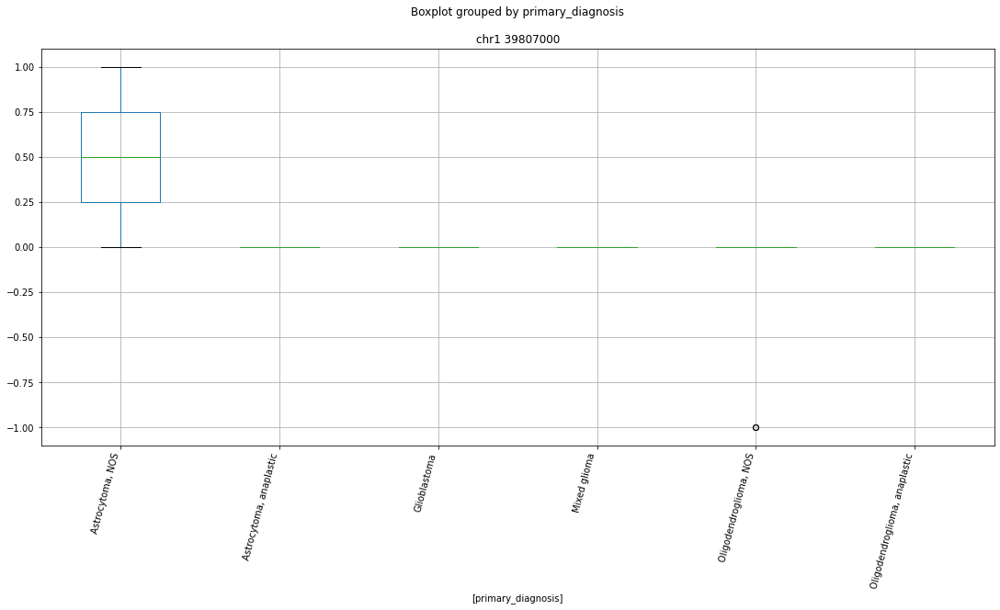

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr15 100775000


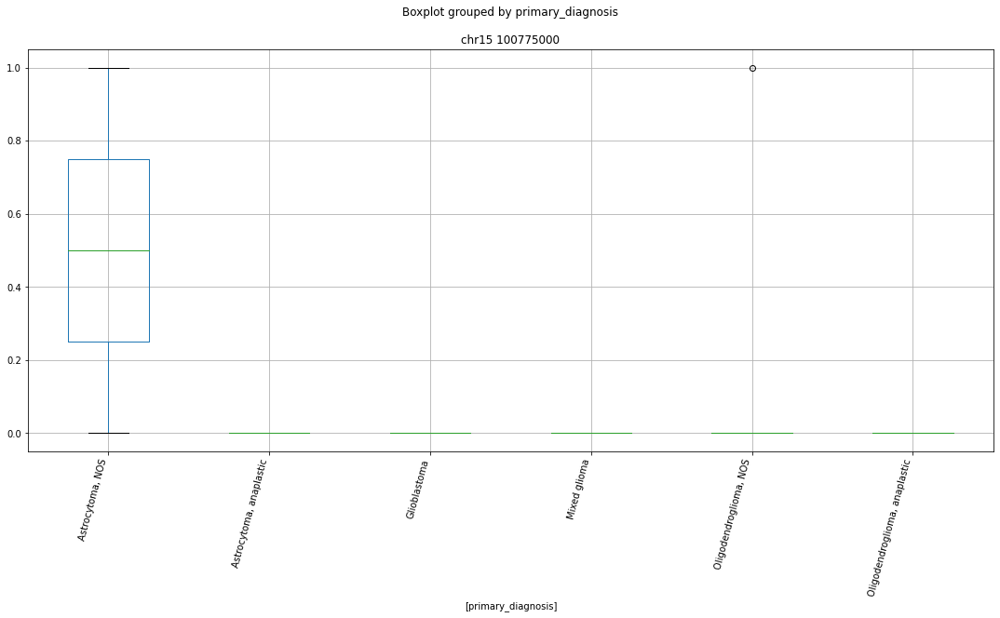

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 61672000


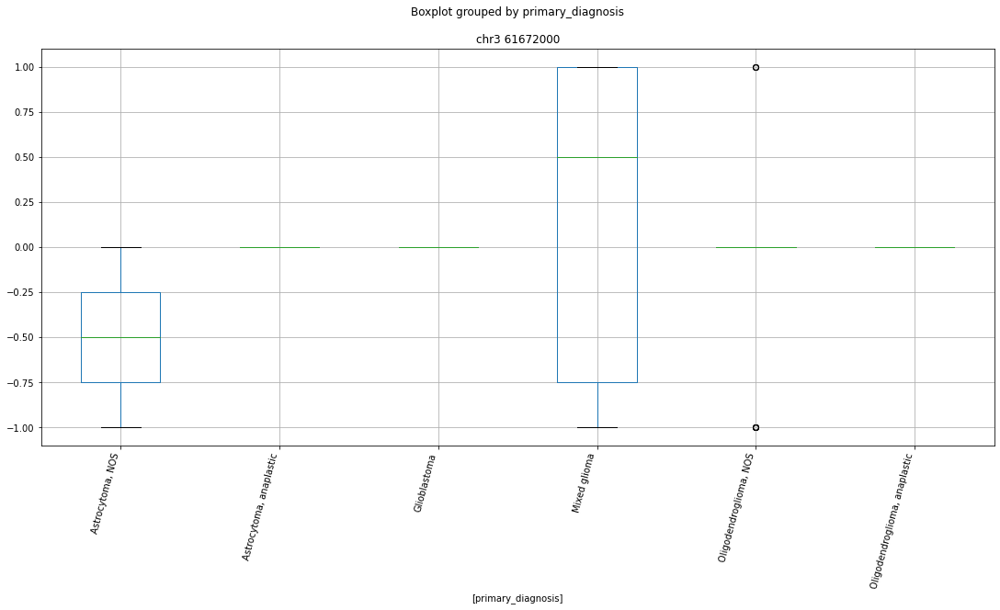

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 87079000


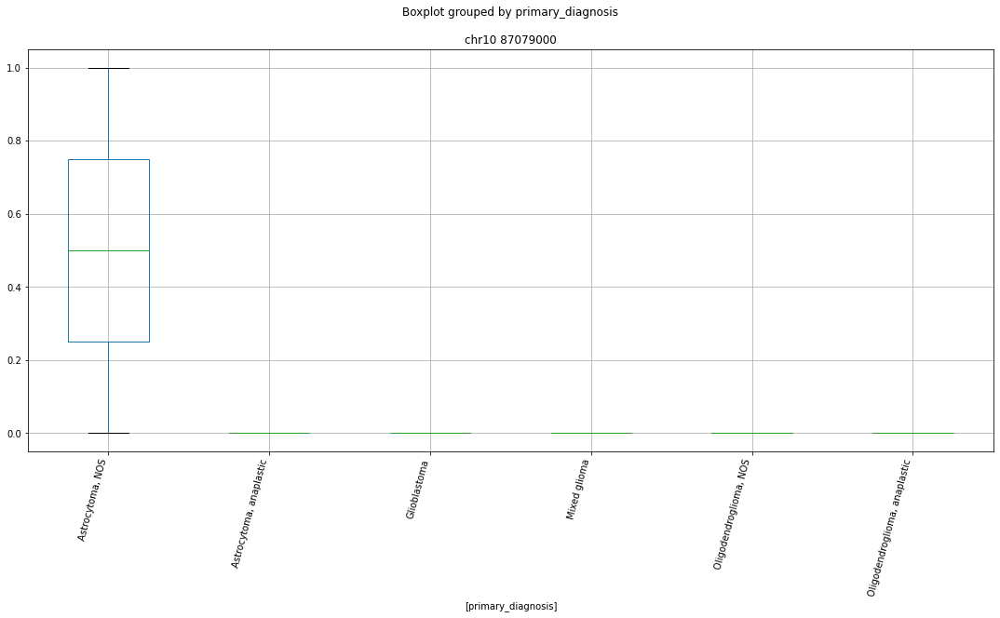

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr19 57482000


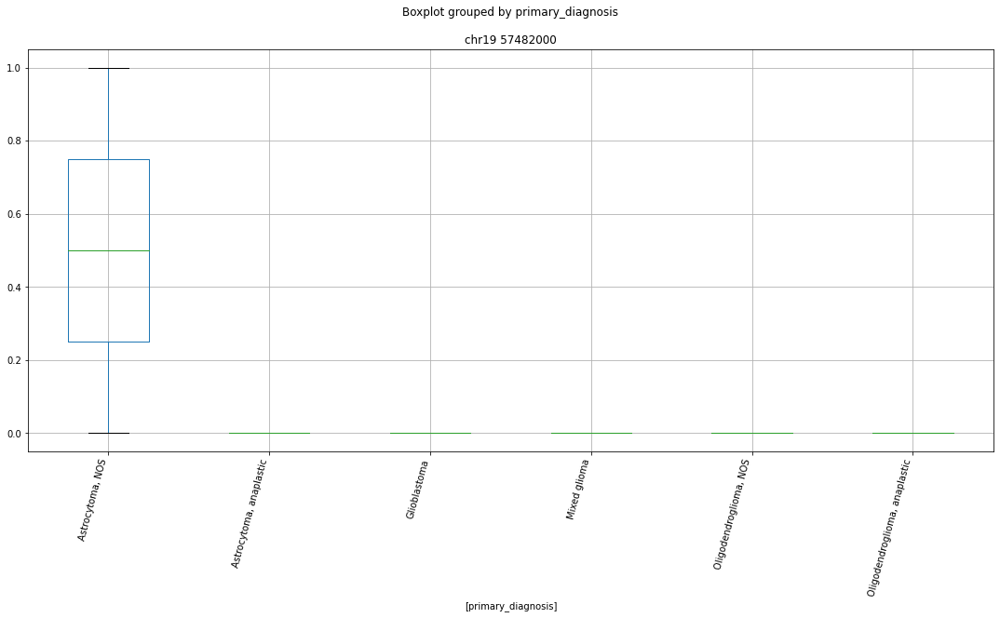

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr7 111609000


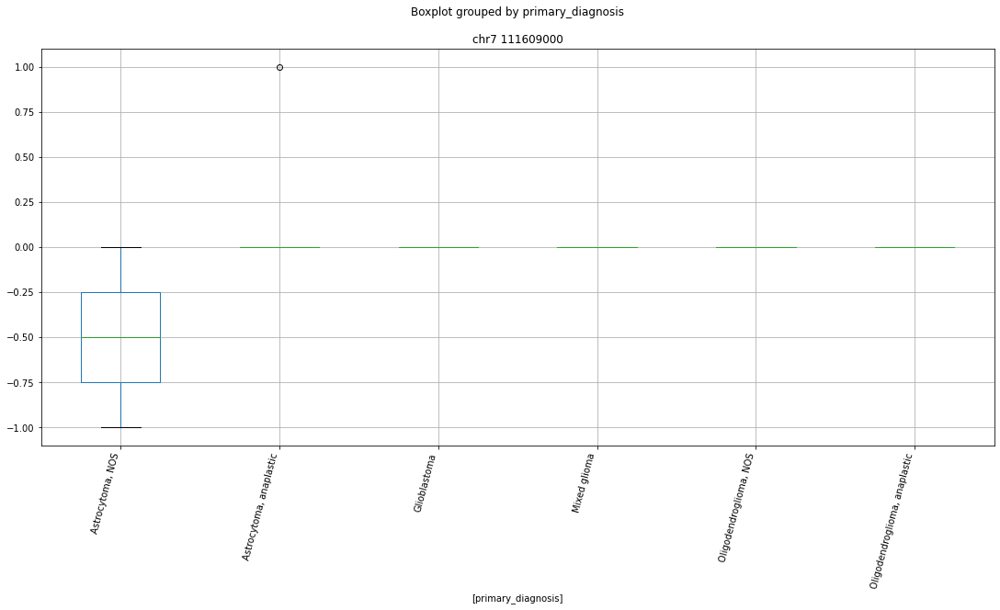

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 62946000


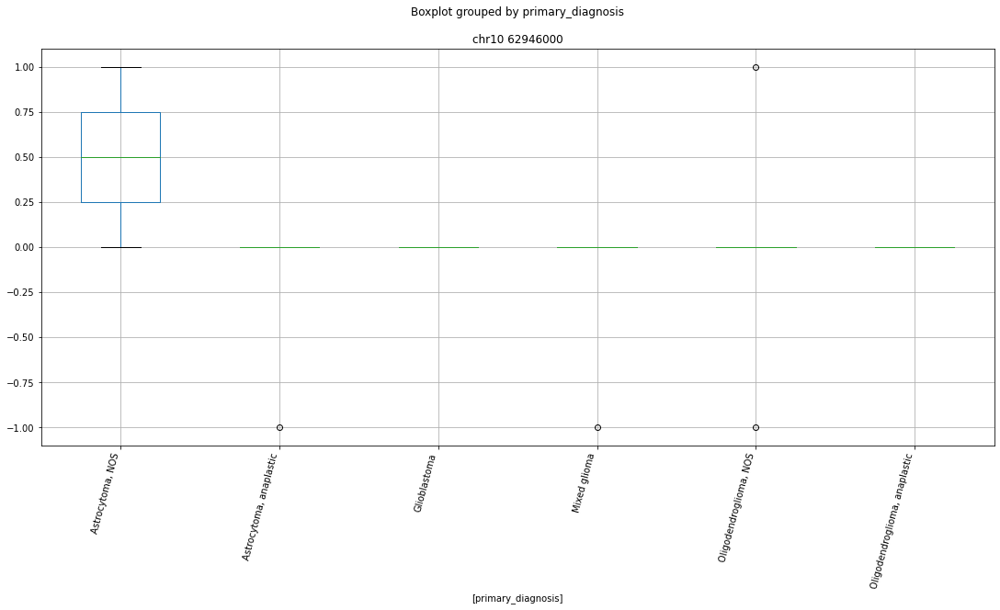

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr6 29932000


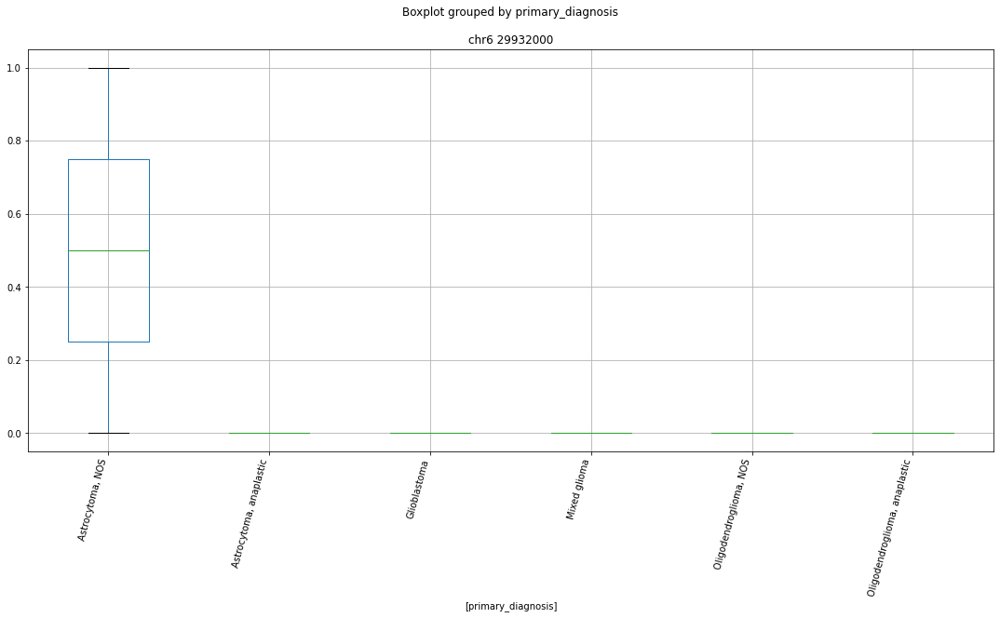

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr16 49211000


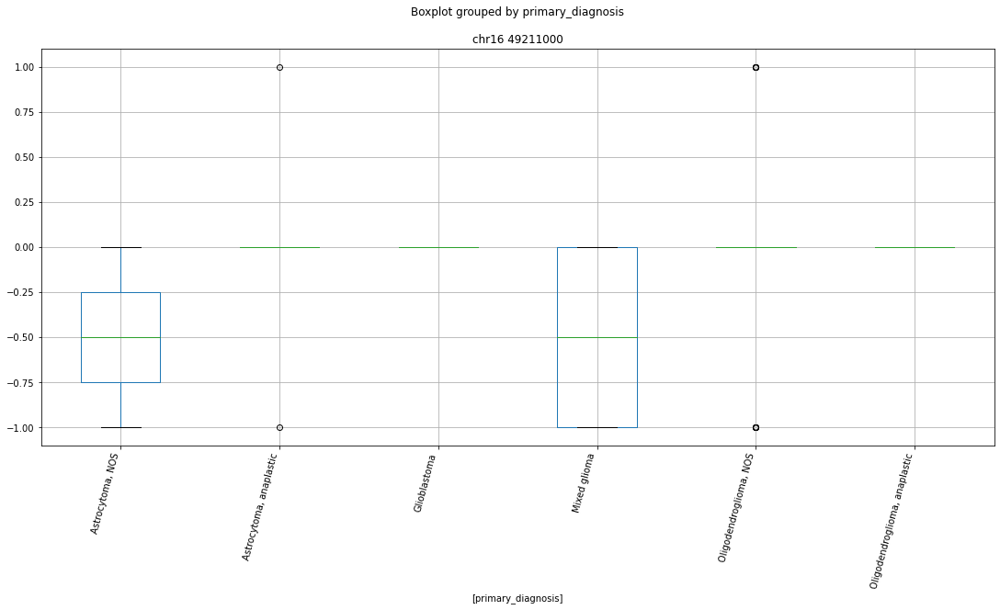

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr5 157013000


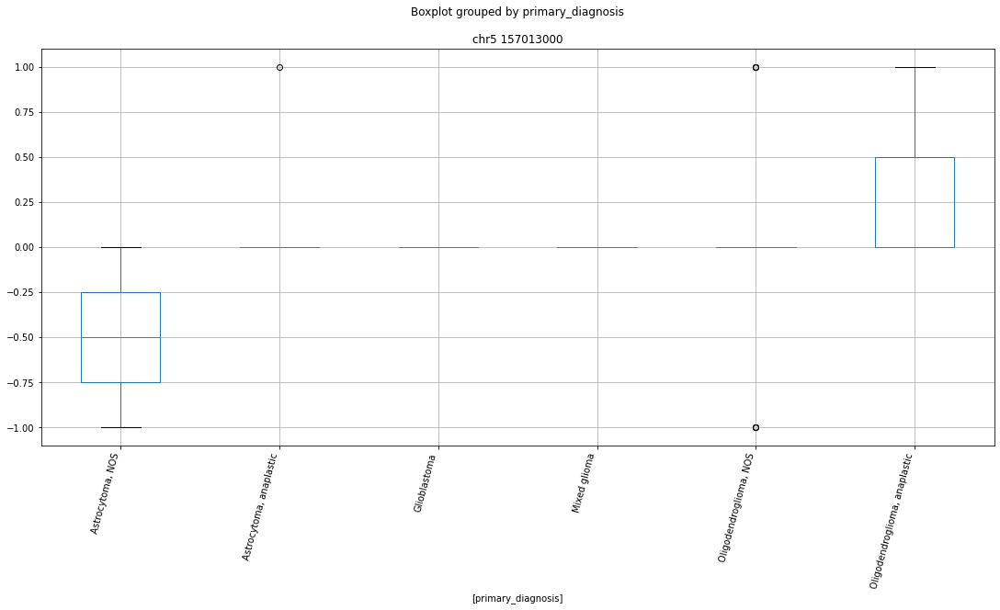

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr8 57021000


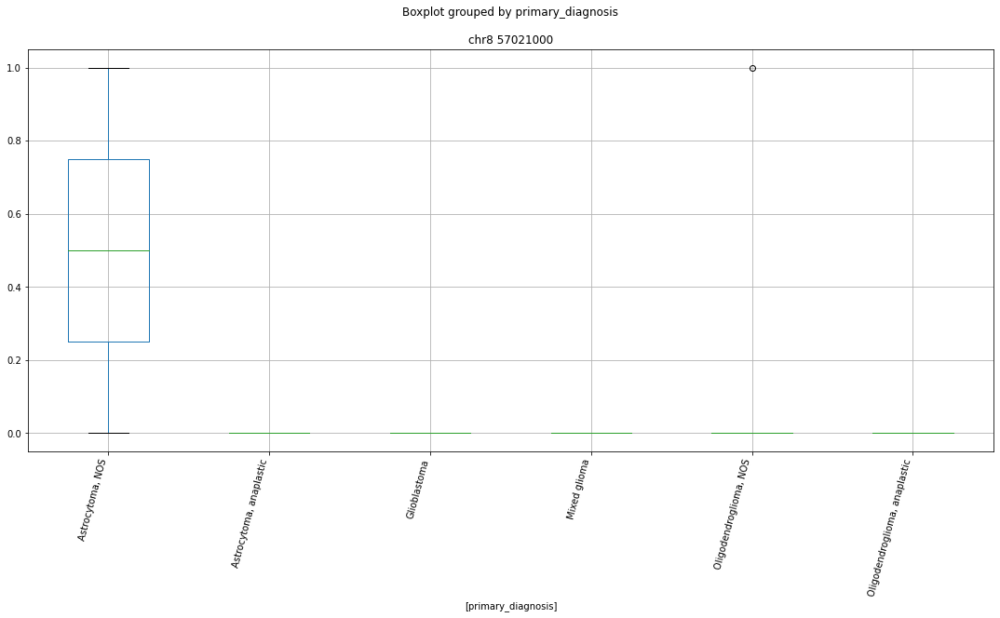

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 62947000


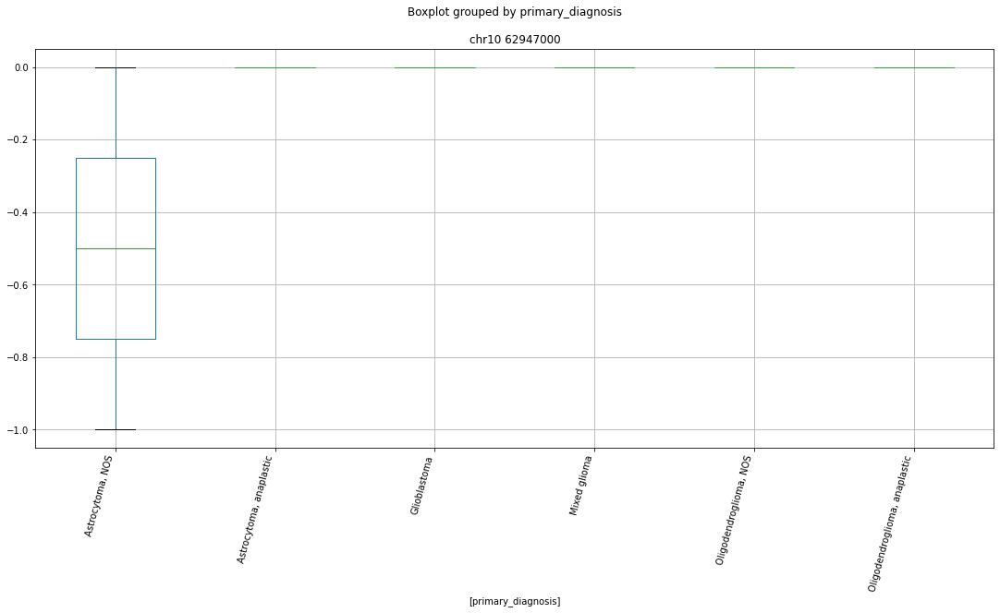

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr16 66630000


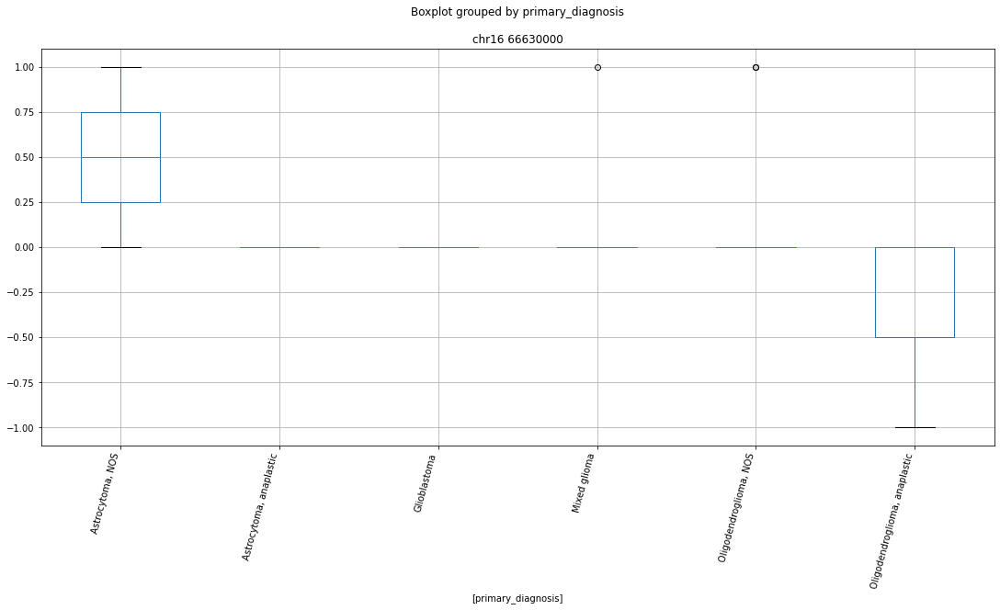

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr11 16906000


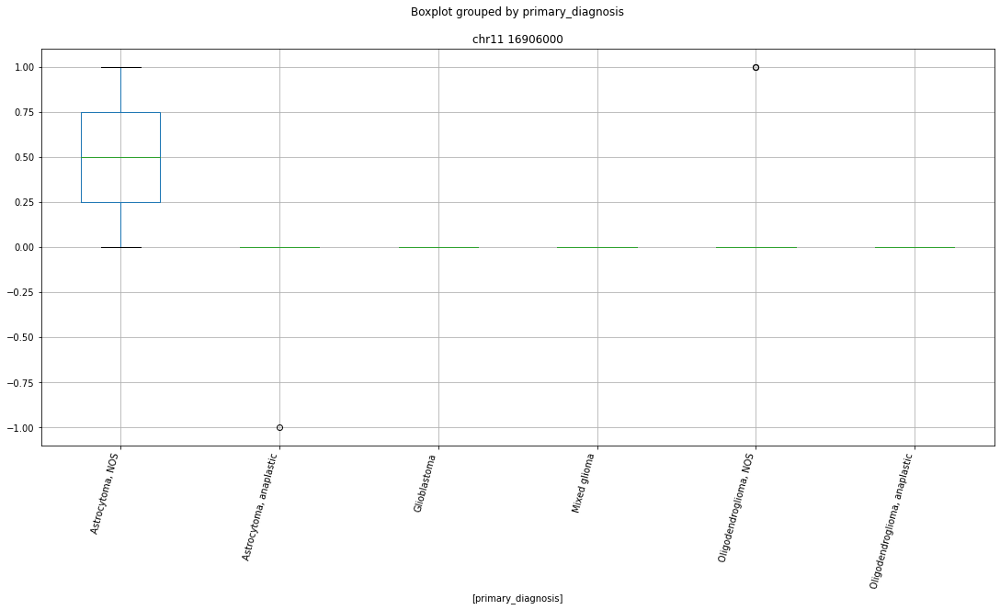

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr4 183819000


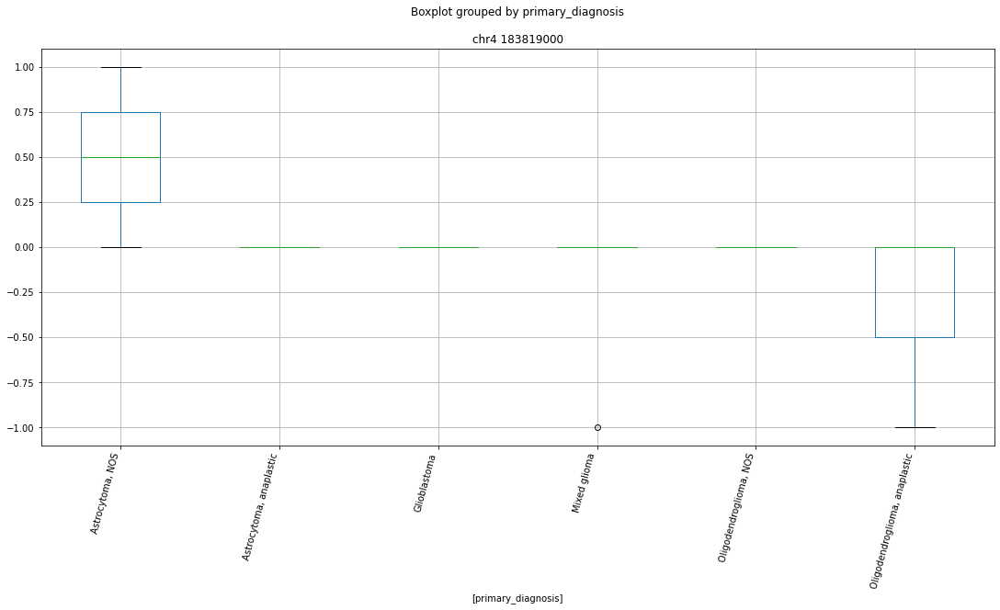

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr17 58454000


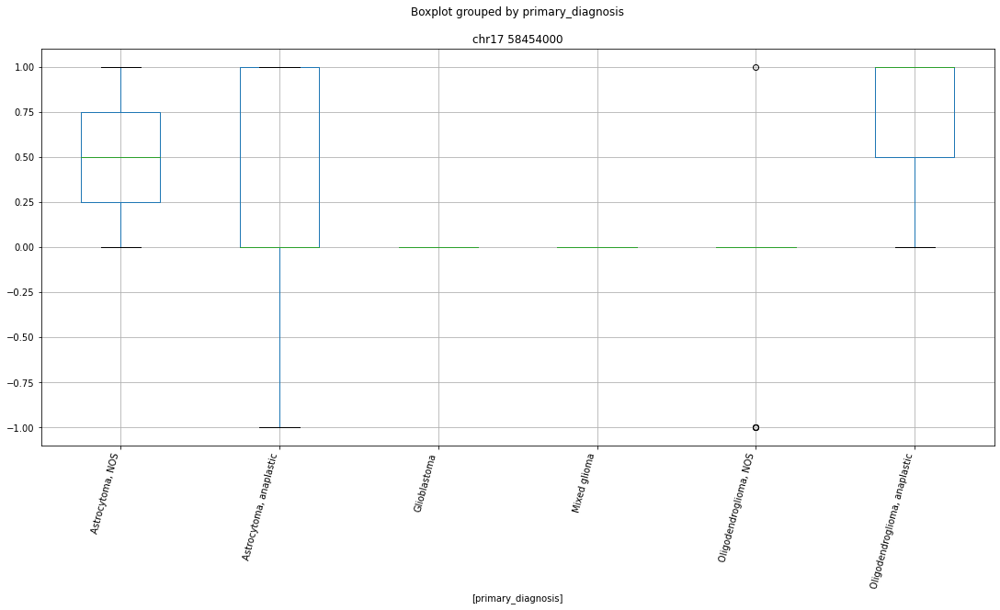

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr11 8977000


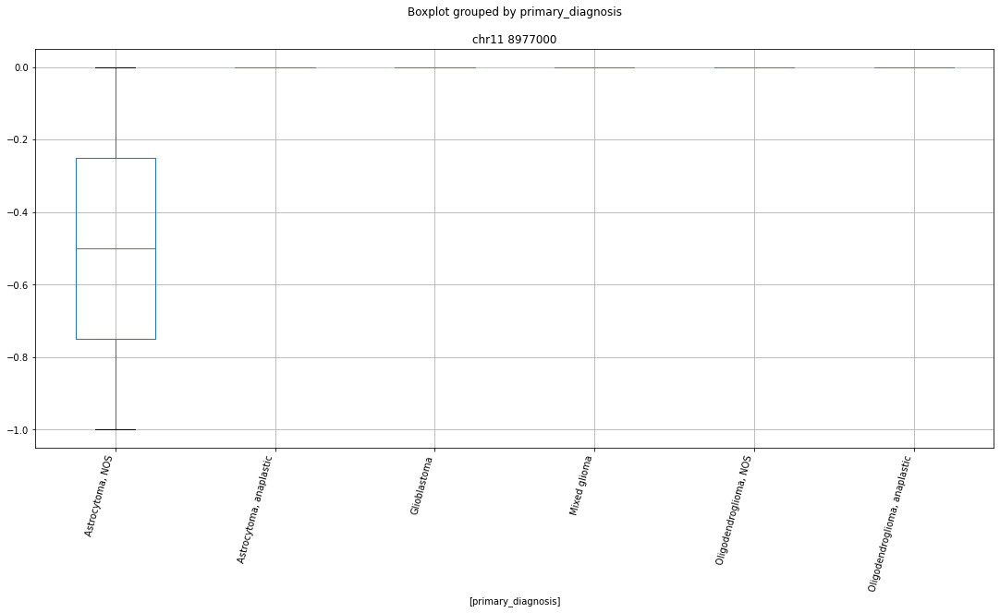

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chrX 85720000


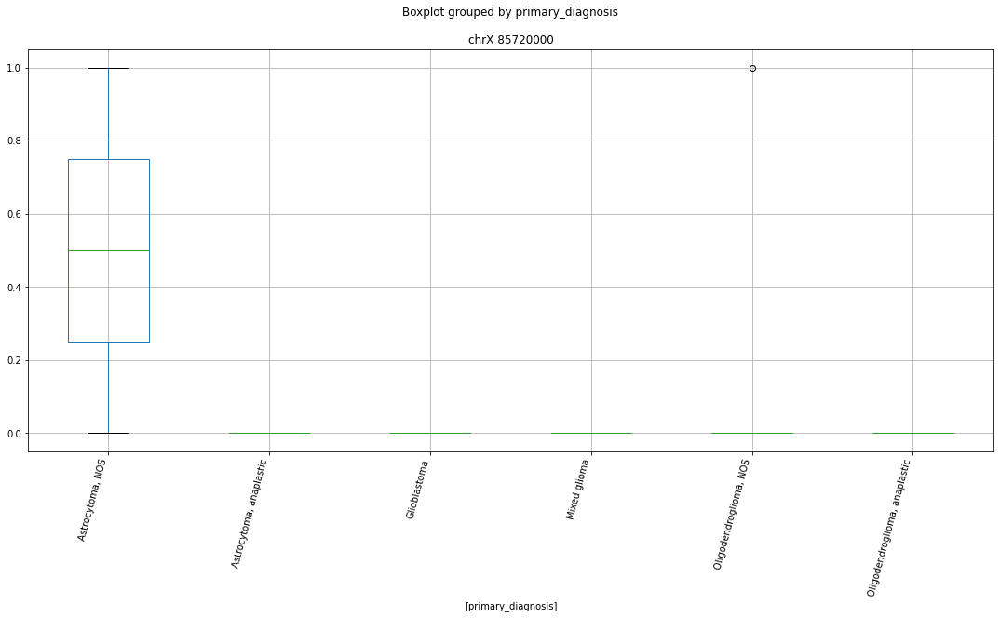

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chrX 74165000


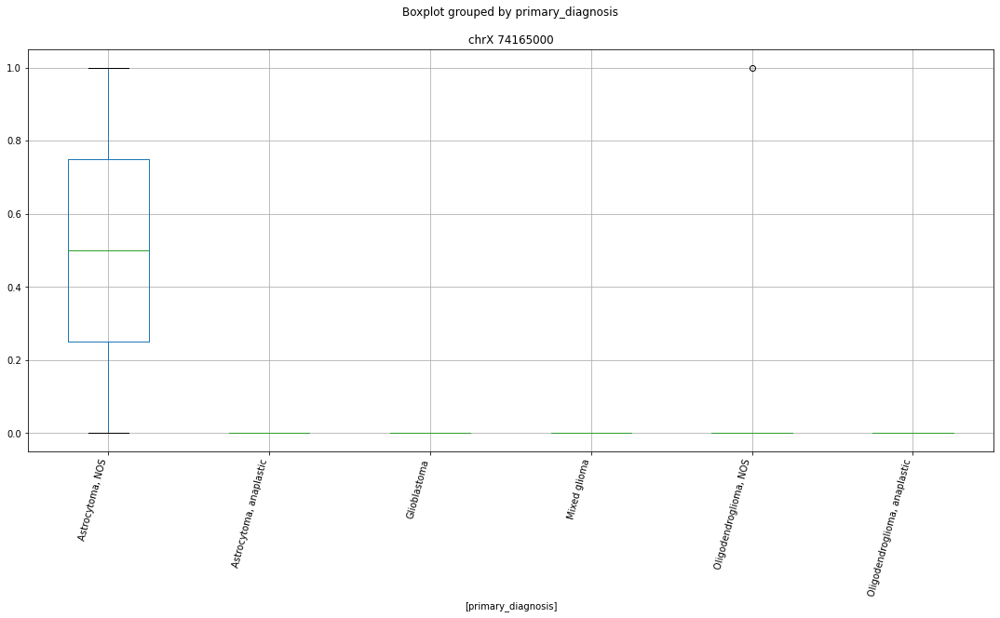

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr11 73937000


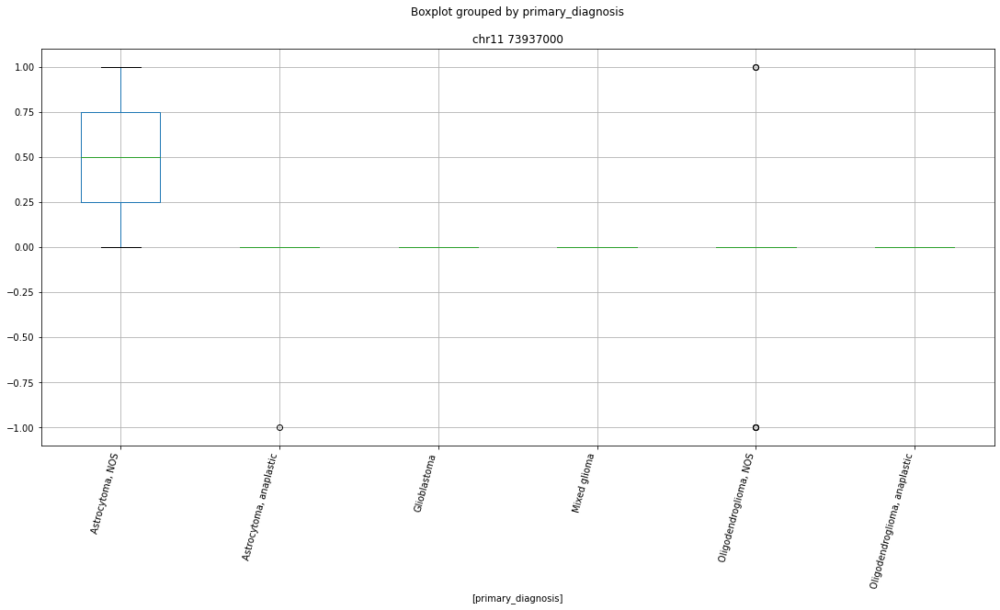

 p : 5.666698422800871e-06  ( t : 5.343591782201504 ) :  chr6 27774000


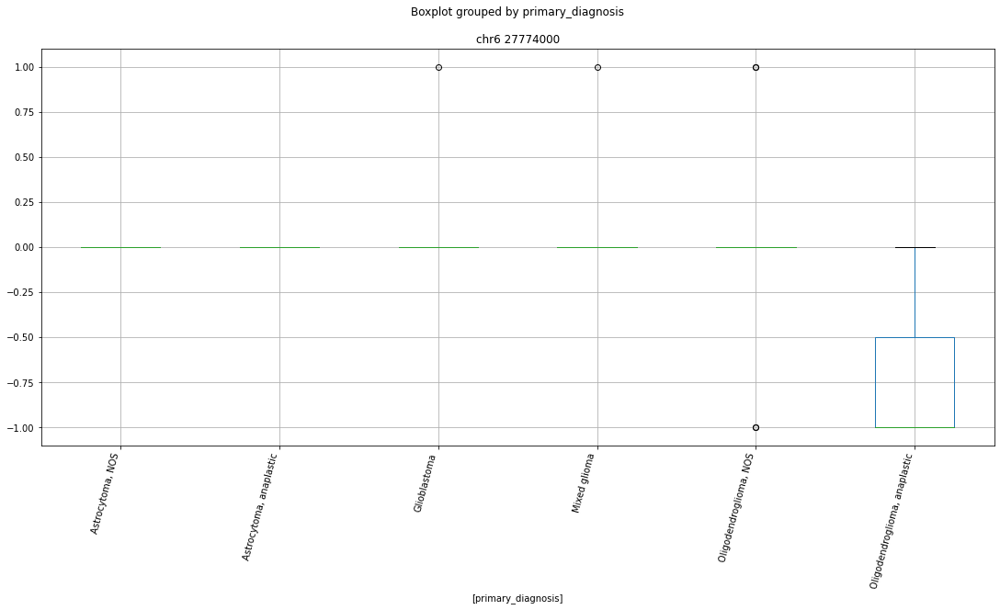

 p : 5.666698422800871e-06  ( t : 5.343591782201504 ) :  chr20 33114000


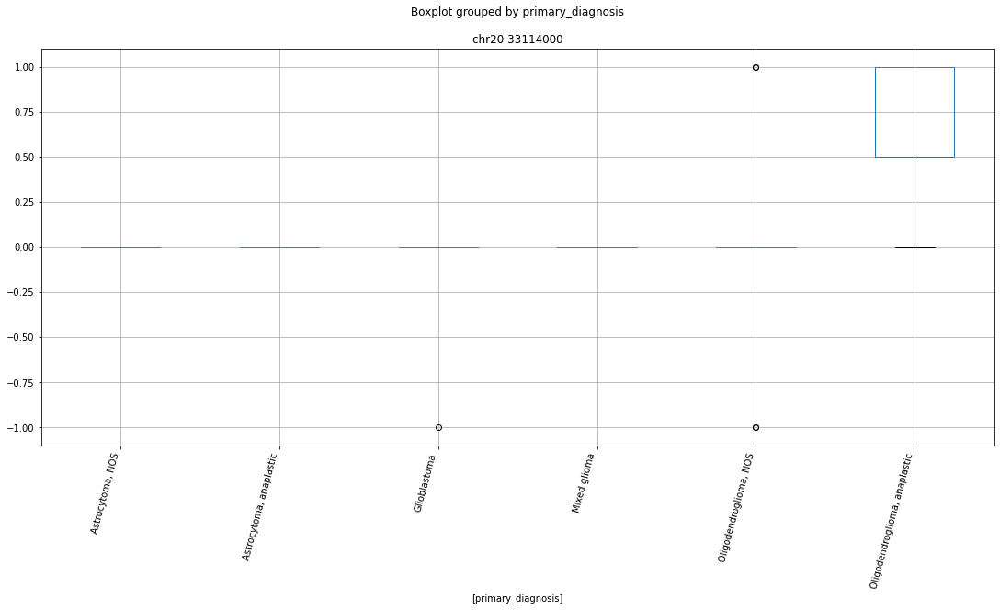

Clustermapping
['chr1 10029000' 'chr1 108490000' 'chr1 108676000' 'chr1 109054000'
 'chr1 112641000' 'chr1 11305000' 'chr1 114791000' 'chr1 114805000'
 'chr1 143704000' 'chr1 145765000' 'chr1 147062000' 'chr1 150782000'
 'chr1 150850000' 'chr1 152145000' 'chr1 152197000' 'chr1 152255000'
 'chr1 153575000' 'chr1 15379000' 'chr1 155835000' 'chr1 156328000'
 'chr1 159449000' 'chr1 160934000' 'chr1 161030000' 'chr1 161280000'
 'chr1 161315000' 'chr1 162457000' 'chr1 162465000' 'chr1 167030000'
 'chr1 168838000' 'chr1 171694000' 'chr1 176058000' 'chr1 179041000'
 'chr1 179419000' 'chr1 182440000' 'chr1 183427000' 'chr1 187617000'
 'chr1 189226000' 'chr1 202451000' 'chr1 202691000' 'chr1 202739000'
 'chr1 203266000' 'chr1 203841000' 'chr1 206065000' 'chr1 211198000'
 'chr1 213153000' 'chr1 217523000' 'chr1 219544000' 'chr1 220467000'
 'chr1 222486000' 'chr1 224350000' 'chr1 226114000' 'chr1 227710000'
 'chr1 231127000' 'chr1 231453000' 'chr1 234268000' 'chr1 235308000'
 'chr1 235310000' 'chr

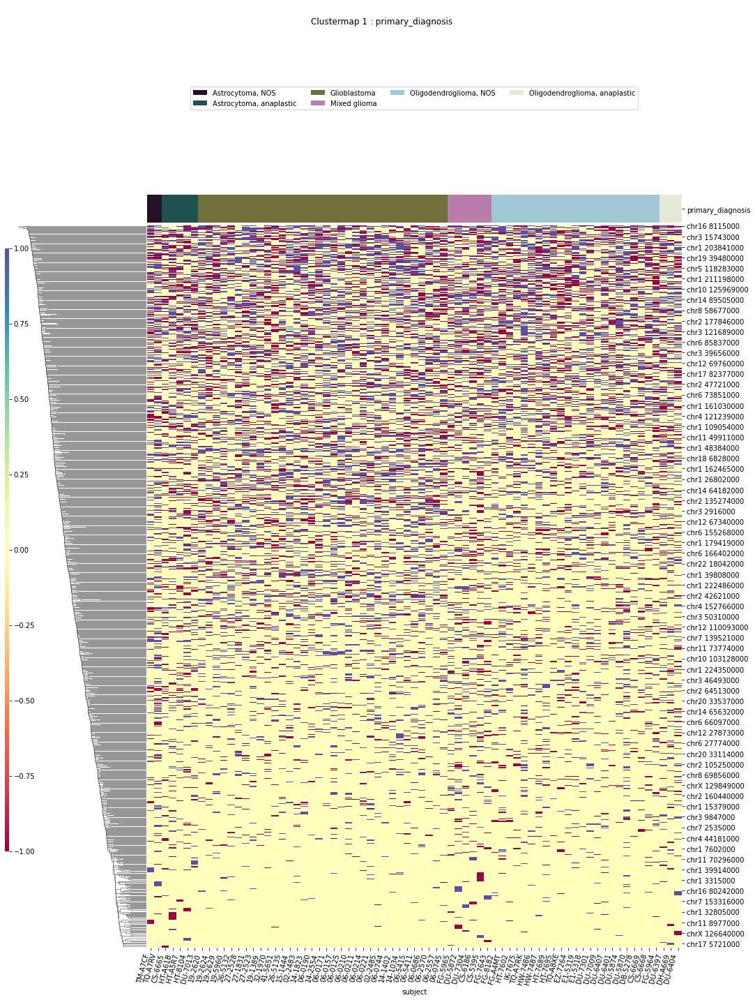

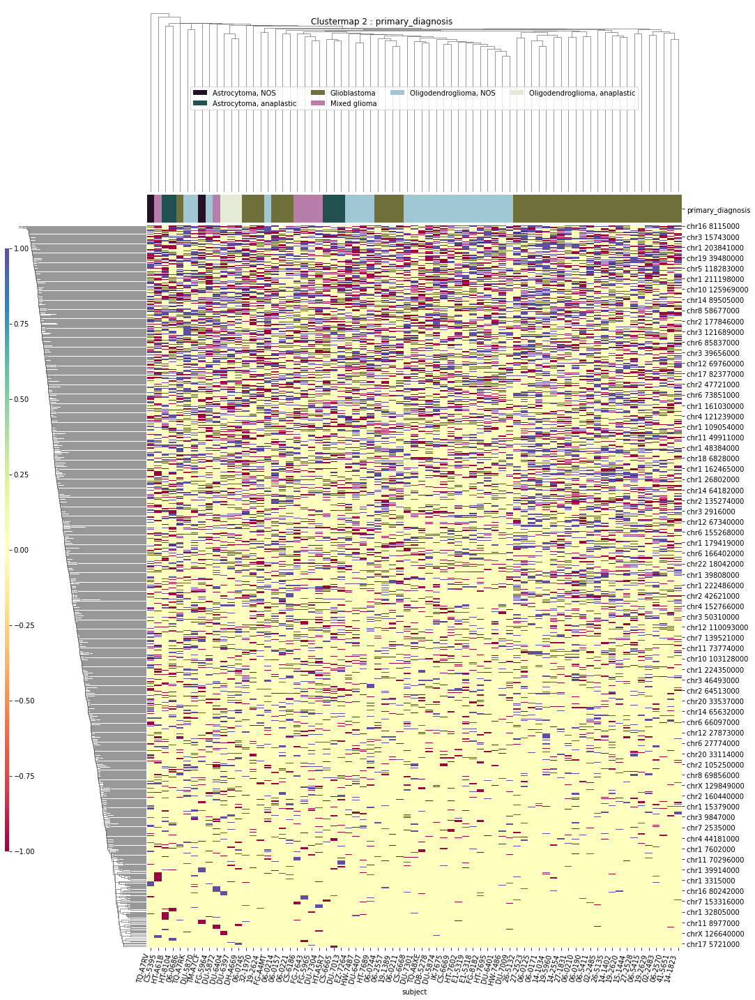

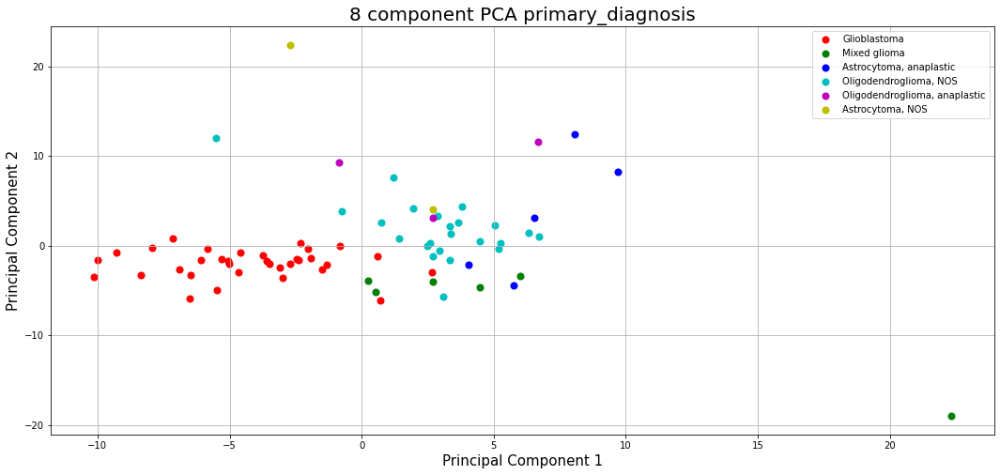

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 153575000' 'chr1 153583000' 'chr1 160913000' 'chr1 161315000'
 'chr1 162450000' 'chr1 167030000' 'chr1 202451000' 'chr1 245775000'
 'chr1 247521000' 'chr1 27829000' 'chr1 34948000' 'chr1 36243000'
 'chr1 43502000' 'chr1 86898000' 'chr1 86900000' 'chr1 86963000'
 'chr10 102036000' 'chr10 103130000' 'chr10 118264000' 'chr10 120399000'
 'chr10 21838000' 'chr10 28772000' 'chr10 28934000' 'chr10 34977000'
 'chr10 45513000' 'chr10 62928000' 'chr10 70407000' 'chr10 70632000'
 'chr10 75749000' 'chr10 79370000' 'chr10 80535000' 'chr10 84179000'
 'chr10 84346000' 'chr10 86455000' 'chr10 9272000' 'chr10 9274000'
 'chr10 92976000' 'chr11 112664000' 'chr11 116348000' 'chr11 59586000'
 'chr11 60452000' 'chr11 62355000' 'chr11 63528000' 'chr11 65762000'
 'chr11 72503000' 'chr11 75878000' 'chr11 95481000' 'chr12 111508000'
 'chr12 131925000' 'chr12 28200000' 'chr12 52410000' 'chr12 68484000'
 'chr12 69374000' 'chr12 8183000' 'chr12 85469000' 'chr13

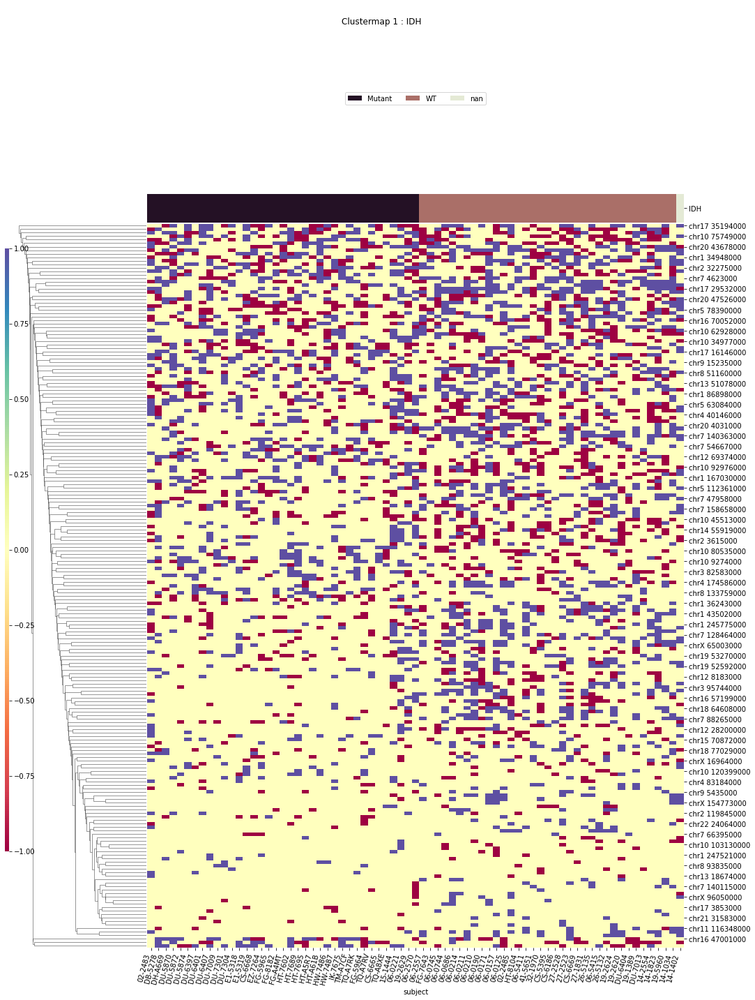

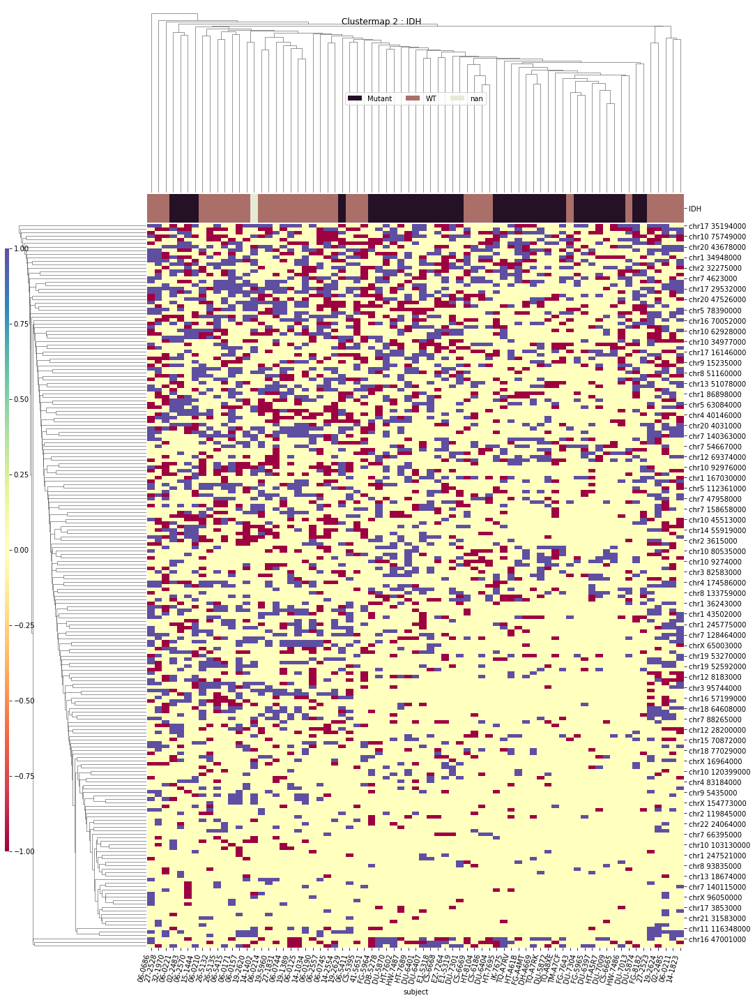

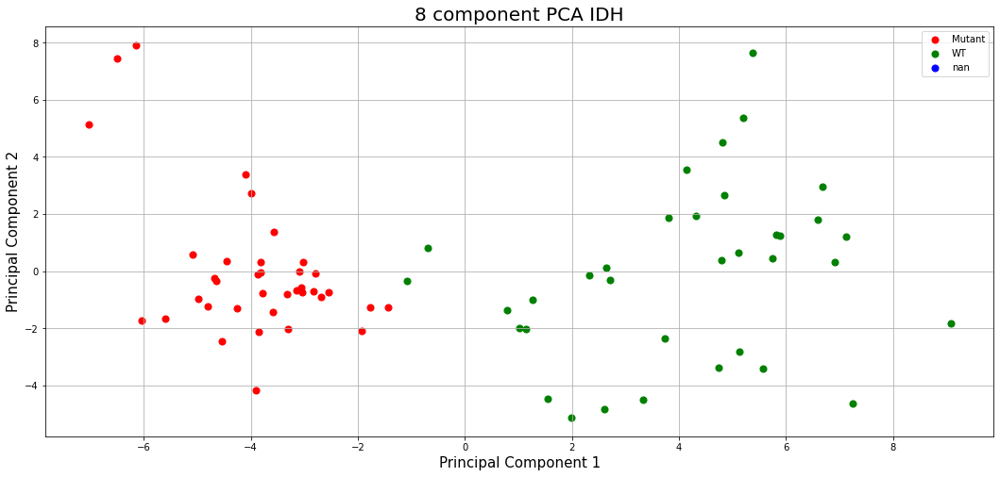

x1p19q
T-Testing
Boxplotting
 p : 4.547285146183342e-07  ( t : 5.5546599515019 ) :  chr14 31438000


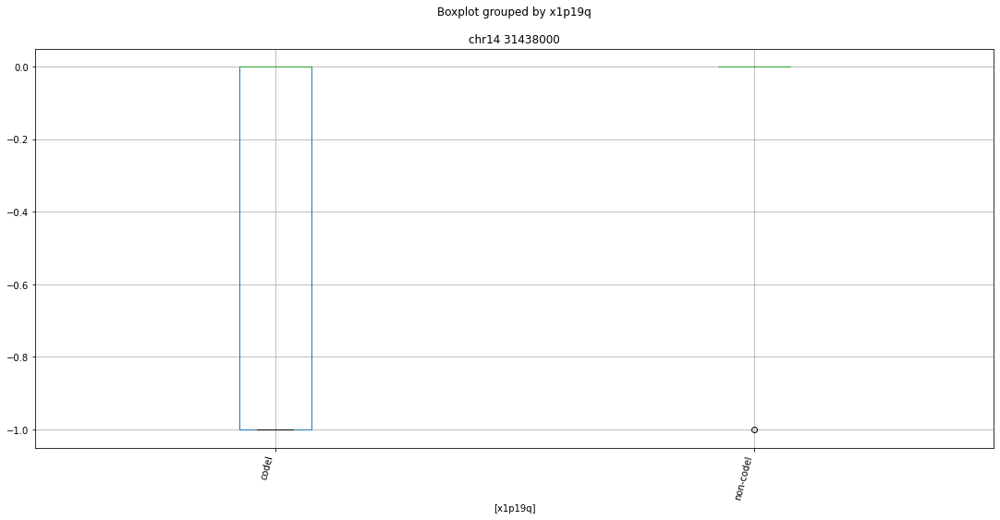

 p : 8.816137417298711e-06  ( t : 4.790973247424185 ) :  chr17 3853000


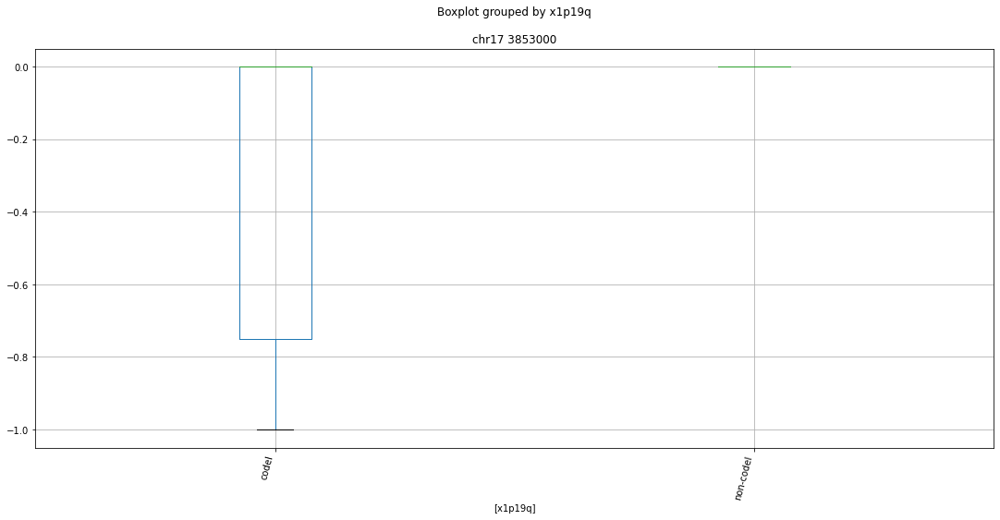

Clustermapping
['chr1 114791000' 'chr1 12042000' 'chr1 147232000' 'chr1 161315000'
 'chr1 170419000' 'chr1 227277000' 'chr1 235080000' 'chr1 26804000'
 'chr1 27829000' 'chr1 33510000' 'chr1 34967000' 'chr1 39999000'
 'chr1 43501000' 'chr1 45107000' 'chr1 45498000' 'chr1 46321000'
 'chr1 64202000' 'chr1 71379000' 'chr1 77871000' 'chr1 98511000'
 'chr1 98513000' 'chr1 99079000' 'chr10 100092000' 'chr10 120214000'
 'chr10 17886000' 'chr10 28934000' 'chr10 29928000' 'chr10 34975000'
 'chr10 43338000' 'chr10 49724000' 'chr10 84179000' 'chr10 86455000'
 'chr10 9272000' 'chr10_GL383546v1_alt 175000' 'chr11 116348000'
 'chr11 2331000' 'chr11 29724000' 'chr11 48708000' 'chr11 5105000'
 'chr11 57944000' 'chr11 65763000' 'chr11 71166000' 'chr11 71168000'
 'chr11 73571000' 'chr11 77099000' 'chr12 110951000' 'chr12 57508000'
 'chr12 74588000' 'chr12 85469000' 'chr12 95908000'
 'chr12_KZ559112v1_alt 110000' 'chr13 113867000' 'chr13 31999000'
 'chr13 37279000' 'chr13 52065000' 'chr13 65895000' 'chr13

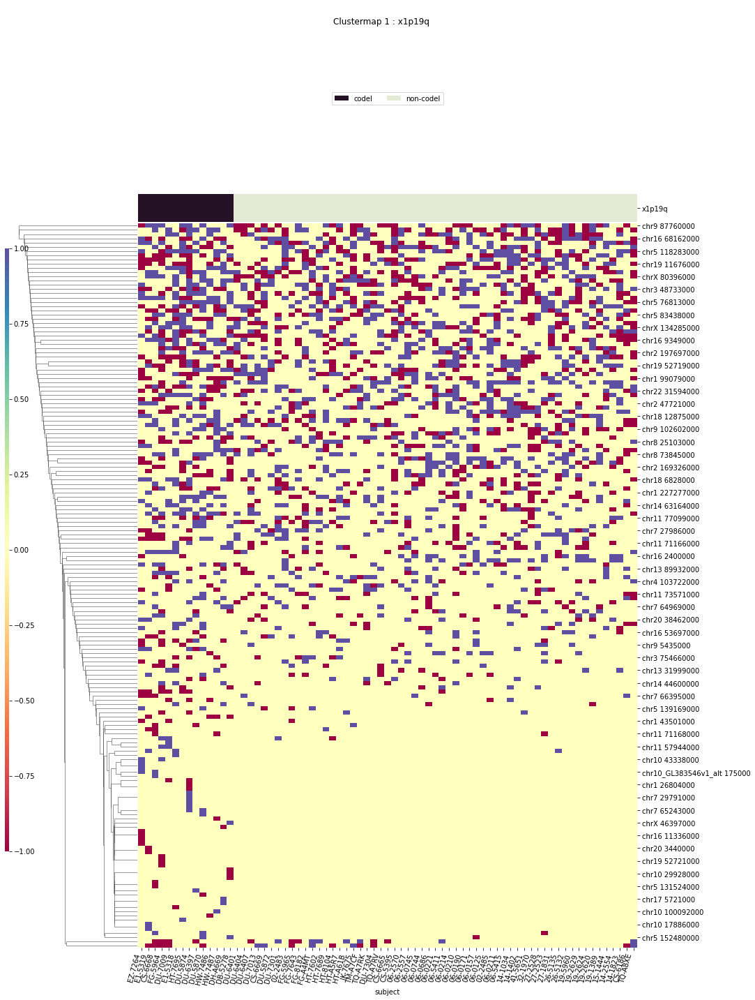

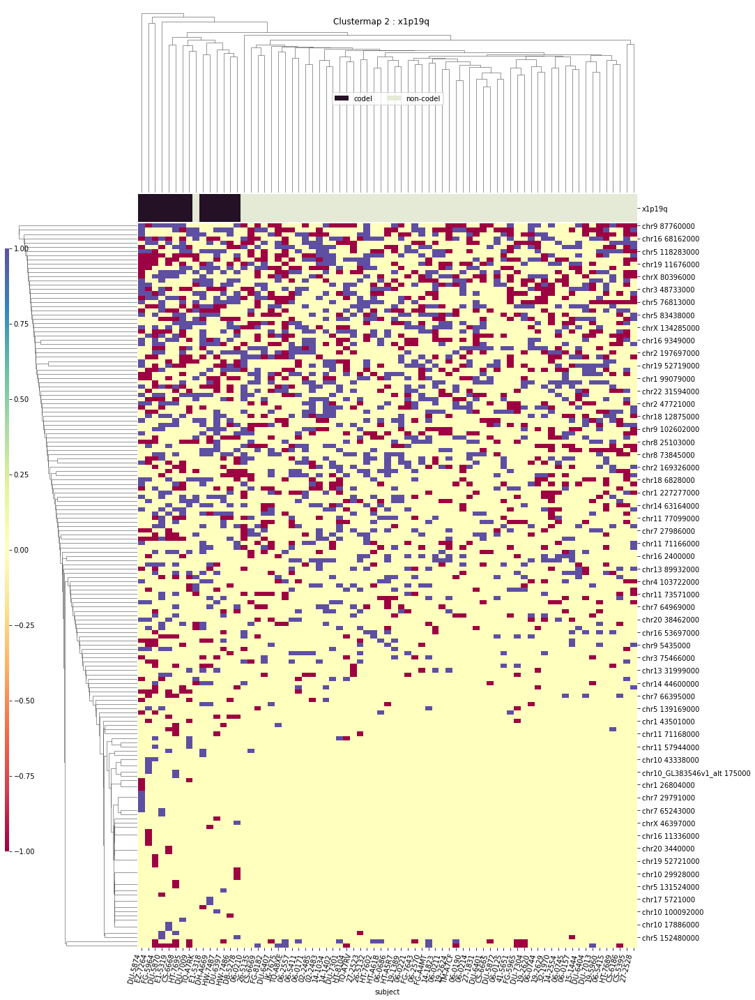

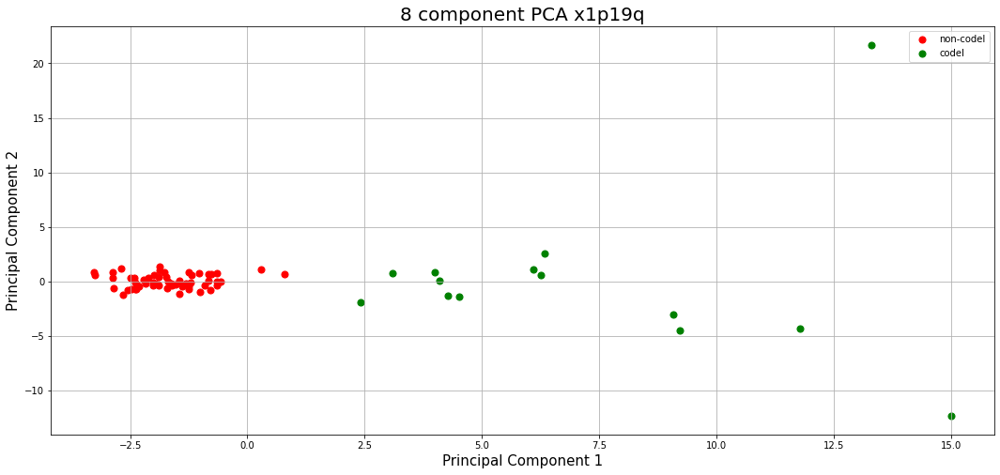

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 111529000' 'chr1 12042000' 'chr1 153583000' 'chr1 155835000'
 'chr1 183427000' 'chr1 202451000' 'chr1 24031000' 'chr1 245775000'
 'chr1 39914000' 'chr1 50380000' 'chr1 71379000' 'chr1 99077000'
 'chr10 126995000' 'chr10 130628000' 'chr10 21836000' 'chr10 21838000'
 'chr10 28772000' 'chr10 34977000' 'chr10 70632000' 'chr10 71870000'
 'chr10 75749000' 'chr10 84346000' 'chr10 9274000' 'chr10 92976000'
 'chr11 33987000' 'chr11 63528000' 'chr11 65762000' 'chr11 67597000'
 'chr11 70294000' 'chr11 71832000' 'chr12 111508000' 'chr12 124101000'
 'chr12 131925000' 'chr12 24673000' 'chr12 28200000' 'chr12 48519000'
 'chr12 53122000' 'chr13 31999000' 'chr13 42965000' 'chr14 31438000'
 'chr14 32127000' 'chr14 33983000' 'chr14 34475000' 'chr14 35978000'
 'chr14 45636000' 'chr14 51468000' 'chr14 73183000' 'chr14 77794000'
 'chr14 89505000' 'chr15 41321000' 'chr15 45292000' 'chr15 65734000'
 'chr15 74729000' 'chr16 5203000' 'chr16 58397000' 'chr1

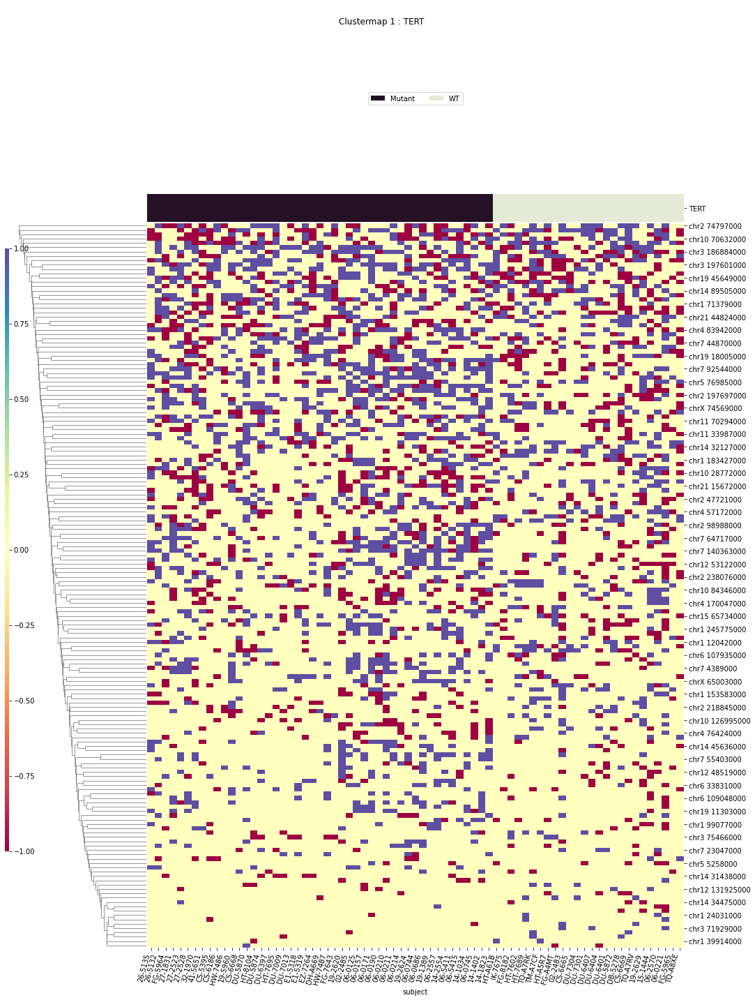

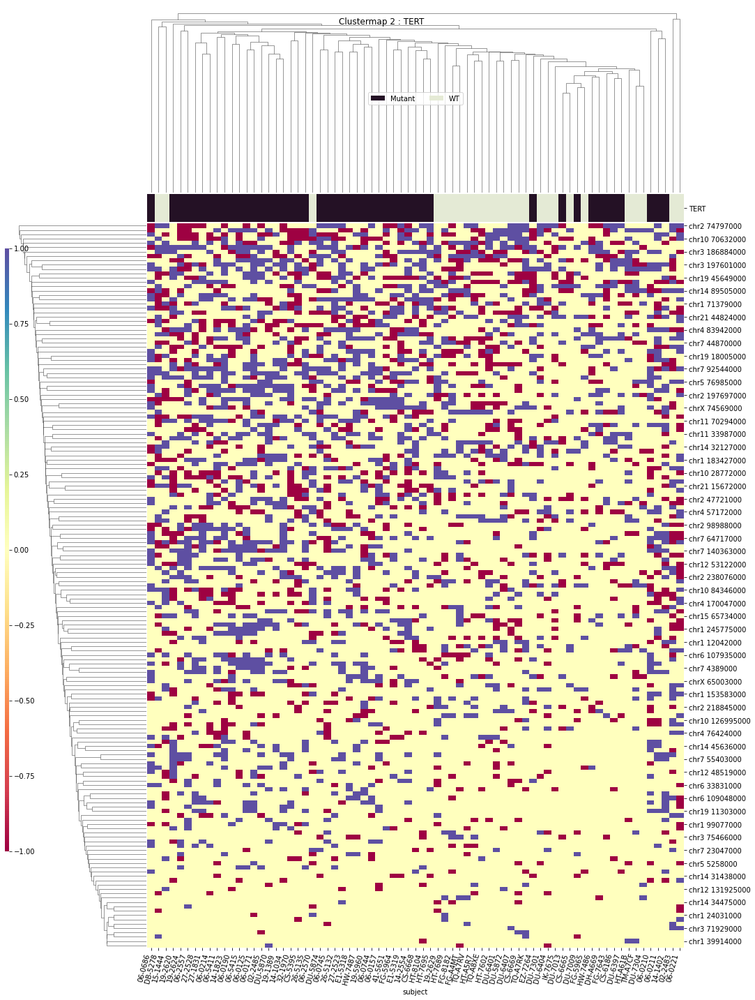

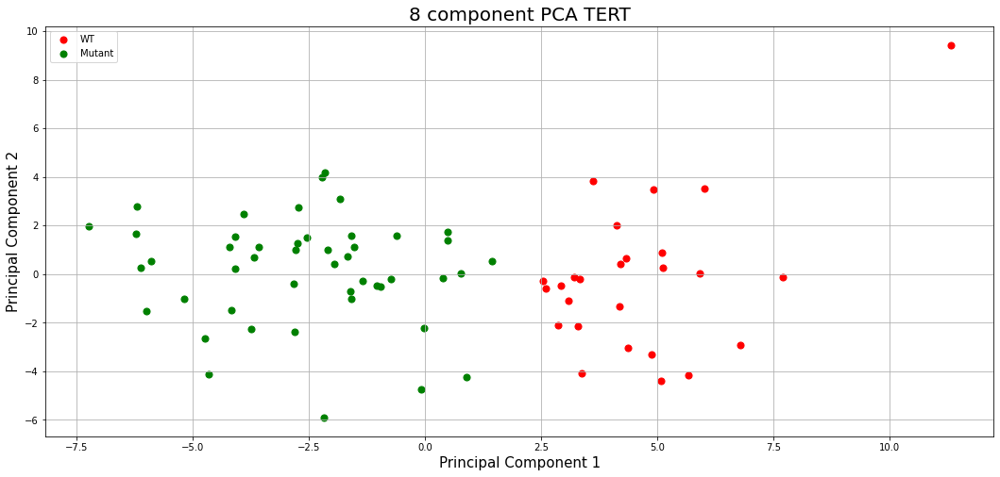

disease_type
T-Testing
Boxplotting
 p : 1.652686328606881e-07  ( t : 5.8066250935607115 ) :  chr7 55401000


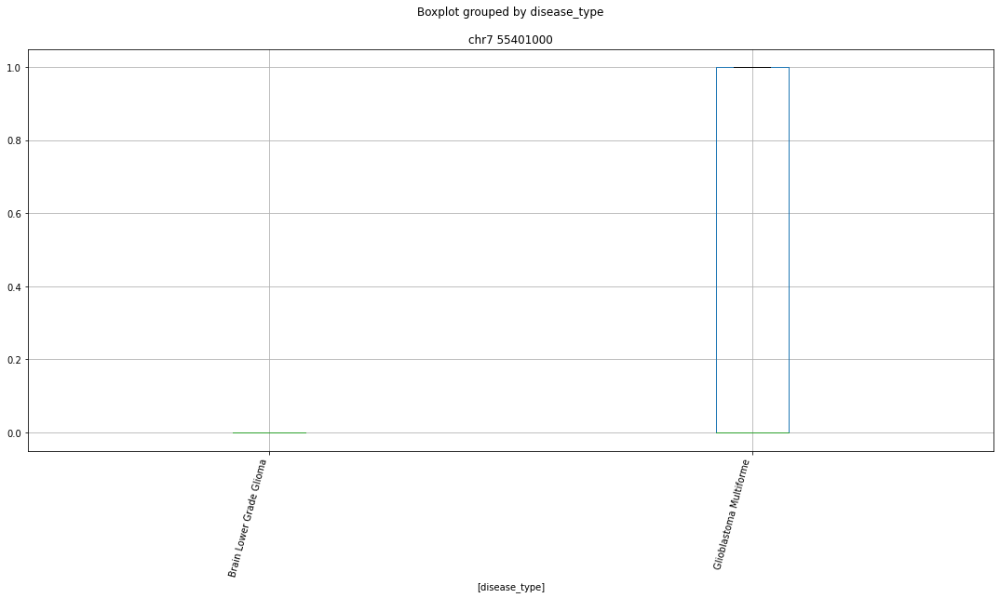

Clustermapping
['chr1 112641000' 'chr1 114789000' 'chr1 12136000' 'chr1 143704000'
 'chr1 150782000' 'chr1 152145000' 'chr1 155835000' 'chr1 161315000'
 'chr1 189226000' 'chr1 202451000' 'chr1 227277000' 'chr1 237126000'
 'chr1 23854000' 'chr1 23936000' 'chr1 247521000' 'chr1 27288000'
 'chr1 31177000' 'chr1 36760000' 'chr1 43502000' 'chr1 45498000'
 'chr1 45765000' 'chr1 50953000' 'chr1 6714000' 'chr1 77983000'
 'chr1 86898000' 'chr1 96470000' 'chr1 99824000' 'chr10 107801000'
 'chr10 118264000' 'chr10 118896000' 'chr10 120399000' 'chr10 130628000'
 'chr10 133415000' 'chr10 28934000' 'chr10 32505000' 'chr10 45513000'
 'chr10 6992000' 'chr10 70632000' 'chr10 75751000' 'chr10 86455000'
 'chr10 90301000' 'chr10 92976000' 'chr11 112664000' 'chr11 48954000'
 'chr11 60816000' 'chr11 61165000' 'chr11 62277000' 'chr11 65762000'
 'chr11 72503000' 'chr11 73935000' 'chr11 98769000' 'chr12 100293000'
 'chr12 105478000' 'chr12 124101000' 'chr12 23925000' 'chr12 27873000'
 'chr12 54487000' 'chr12 6

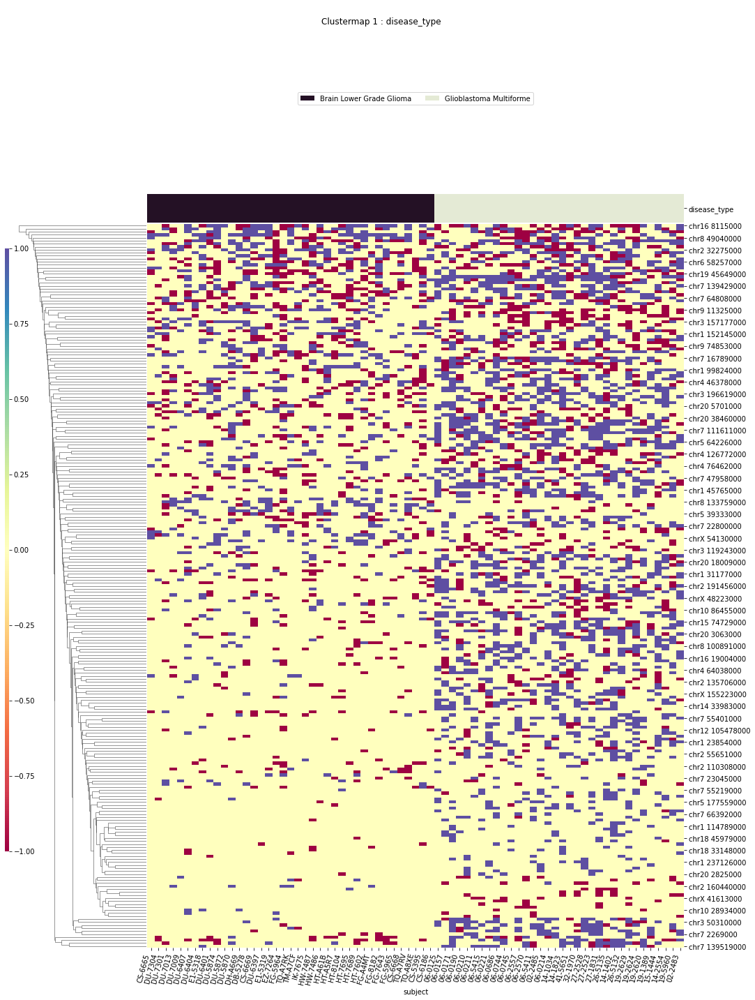

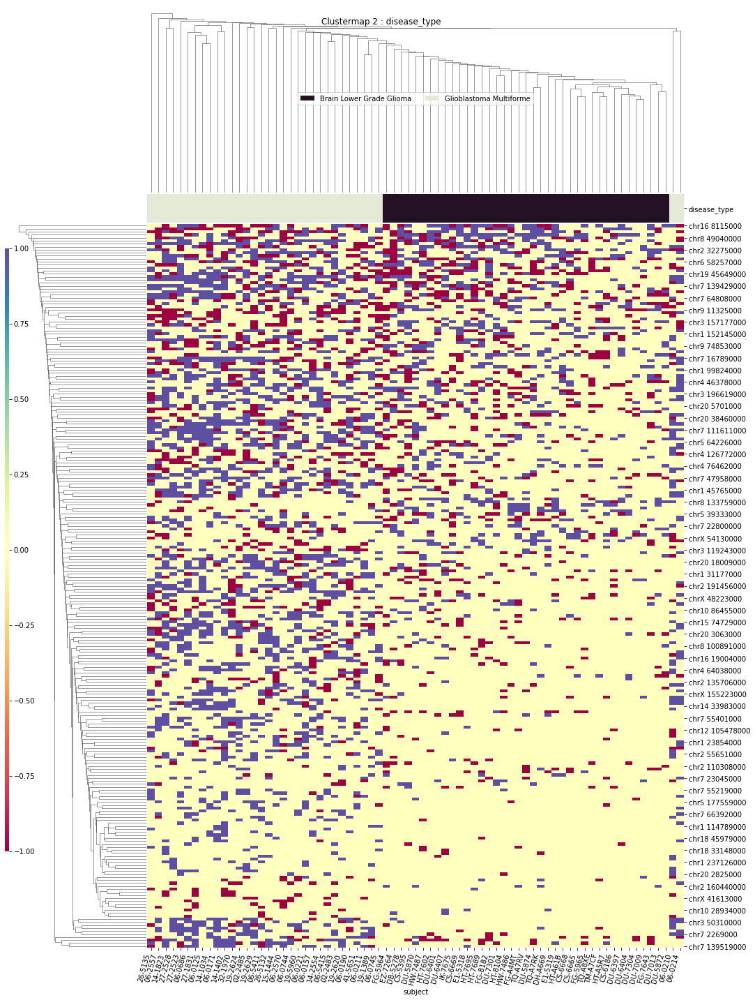

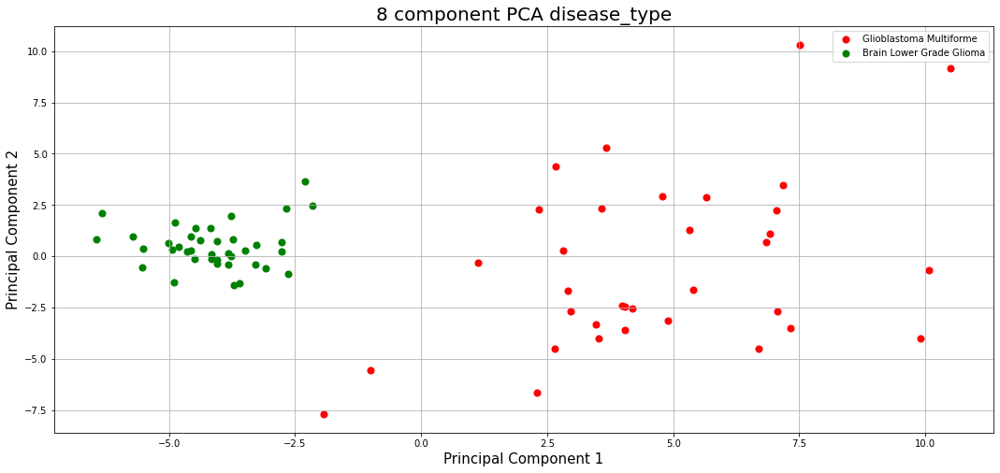

IDH_1p19q_status
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 114791000' 'chr1 12042000' 'chr1 151770000'
 'chr1 153583000' 'chr1 155835000' 'chr1 161315000' 'chr1 161424000'
 'chr1 167030000' 'chr1 168208000' 'chr1 170419000' 'chr1 176058000'
 'chr1 182742000' 'chr1 189139000' 'chr1 202451000' 'chr1 203841000'
 'chr1 217524000' 'chr1 227277000' 'chr1 235080000' 'chr1 245775000'
 'chr1 27829000' 'chr1 31177000' 'chr1 33510000' 'chr1 34948000'
 'chr1 34967000' 'chr1 39999000' 'chr1 43501000' 'chr1 45498000'
 'chr1 45739000' 'chr1 46321000' 'chr1 50380000' 'chr1 64202000'
 'chr1 71379000' 'chr1 77871000' 'chr1 86898000' 'chr1 86900000'
 'chr1 86963000' 'chr1 98511000' 'chr1 99079000' 'chr10 102036000'
 'chr10 118264000' 'chr10 120214000' 'chr10 126995000' 'chr10 21836000'
 'chr10 21838000' 'chr10 28772000' 'chr10 28934000' 'chr10 32505000'
 'chr10 34975000' 'chr10 34977000' 'chr10 43244000' 'chr10 43338000'
 'chr10 62928000' 'chr10 75749000' 'chr10 79370000' 'chr10 80535000'
 'chr10 84179000' 'ch

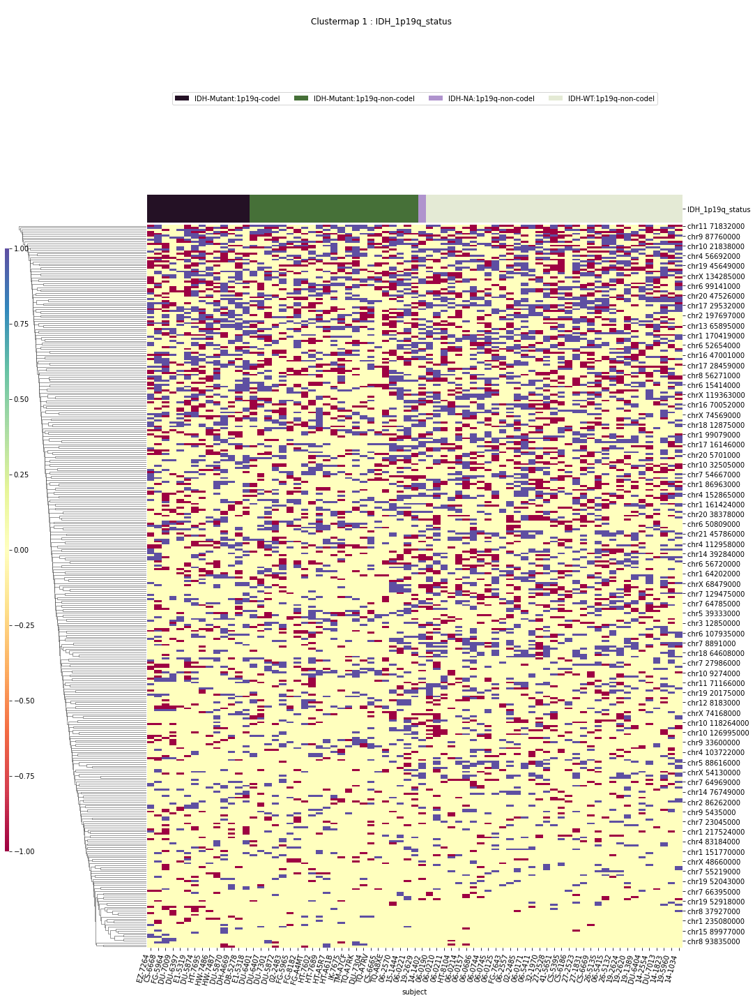

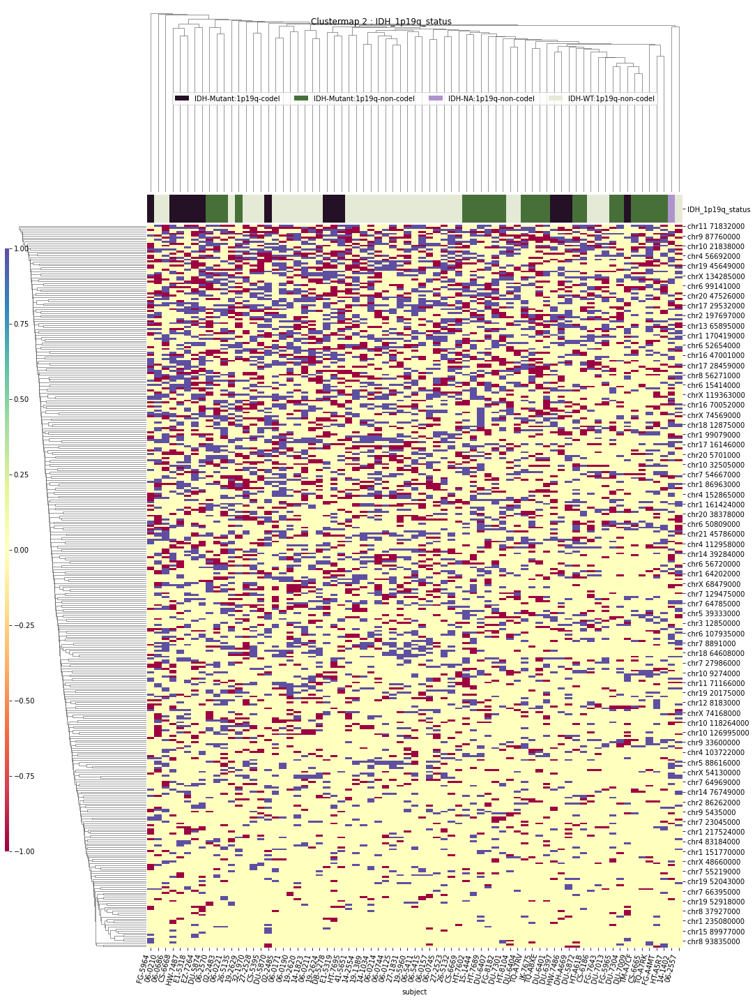

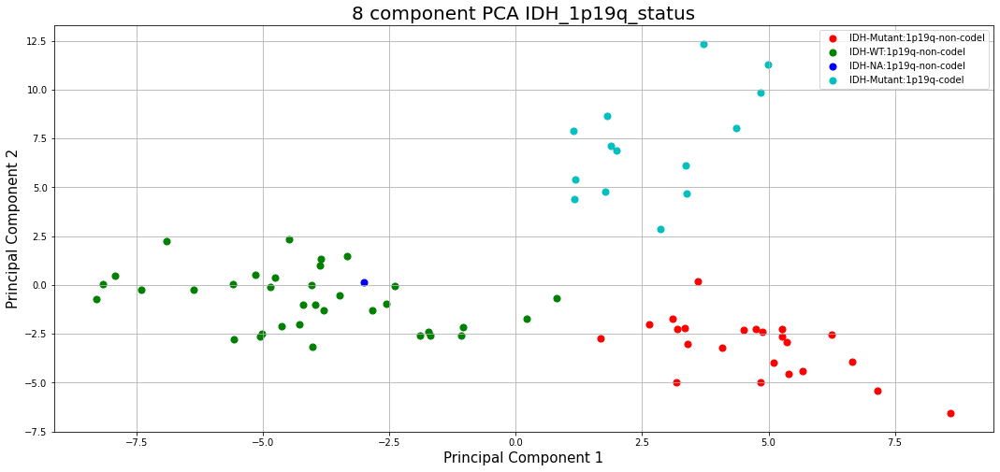

WHO_groups
T-Testing
Boxplotting
 p : 2.6316857449143274e-08  ( t : 7.625169498217283 ) :  chr17 27033000


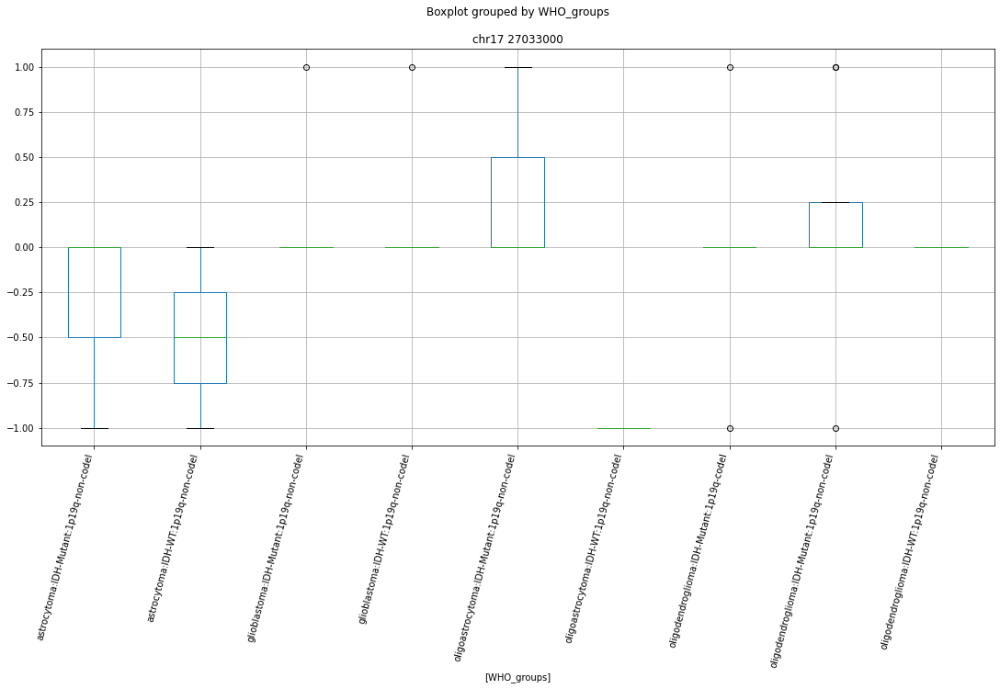

 p : 2.6316857449143274e-08  ( t : 7.625169498217283 ) :  chr2 85094000


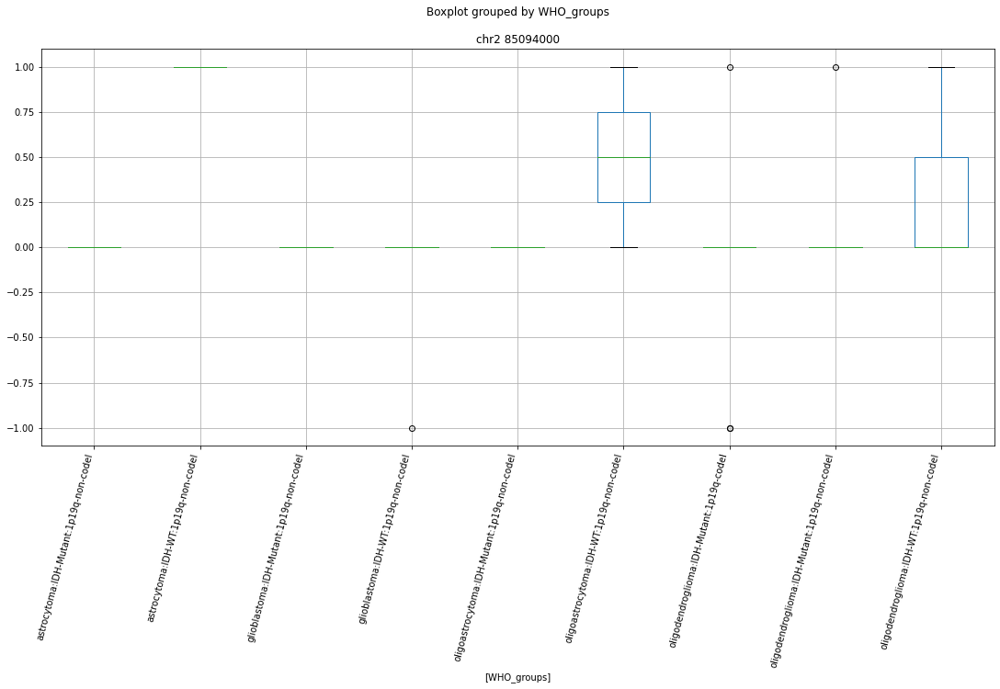

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr16 49211000


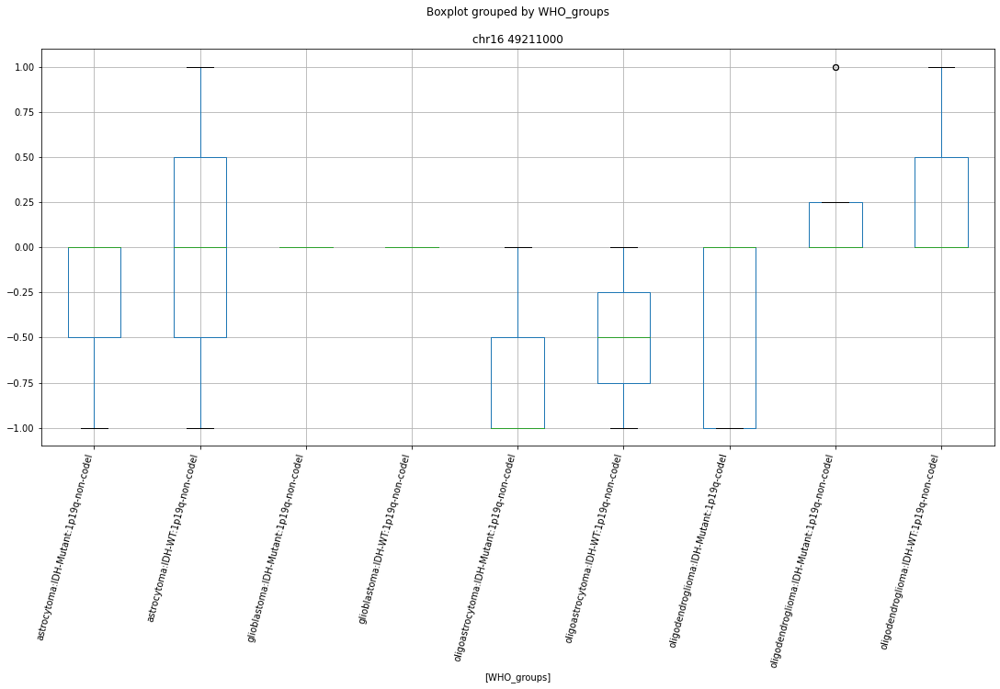

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr11 131085000


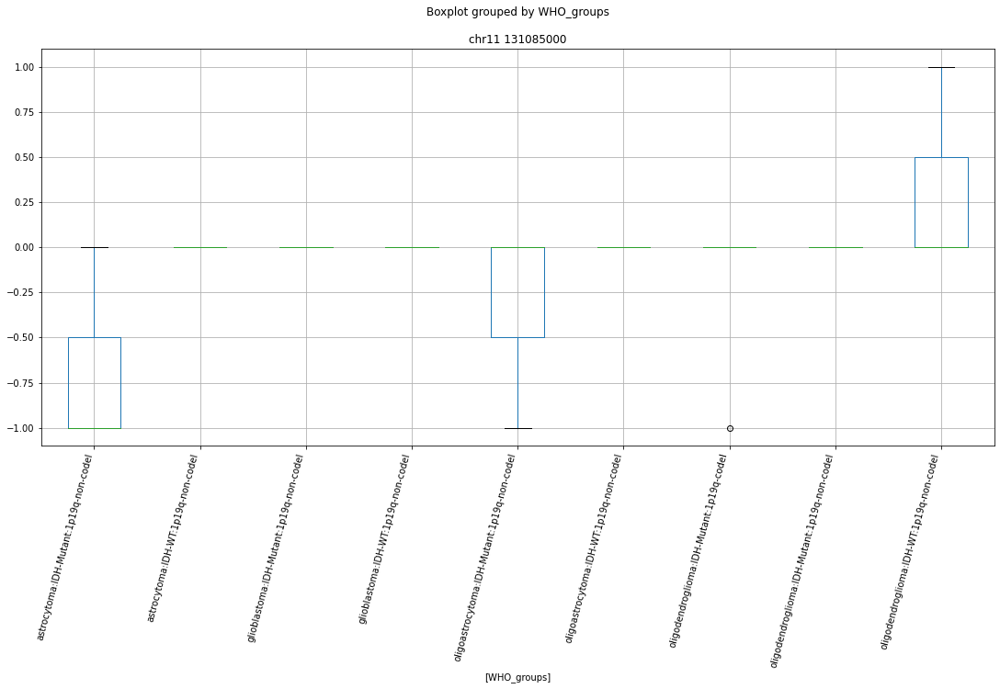

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr7 99426000


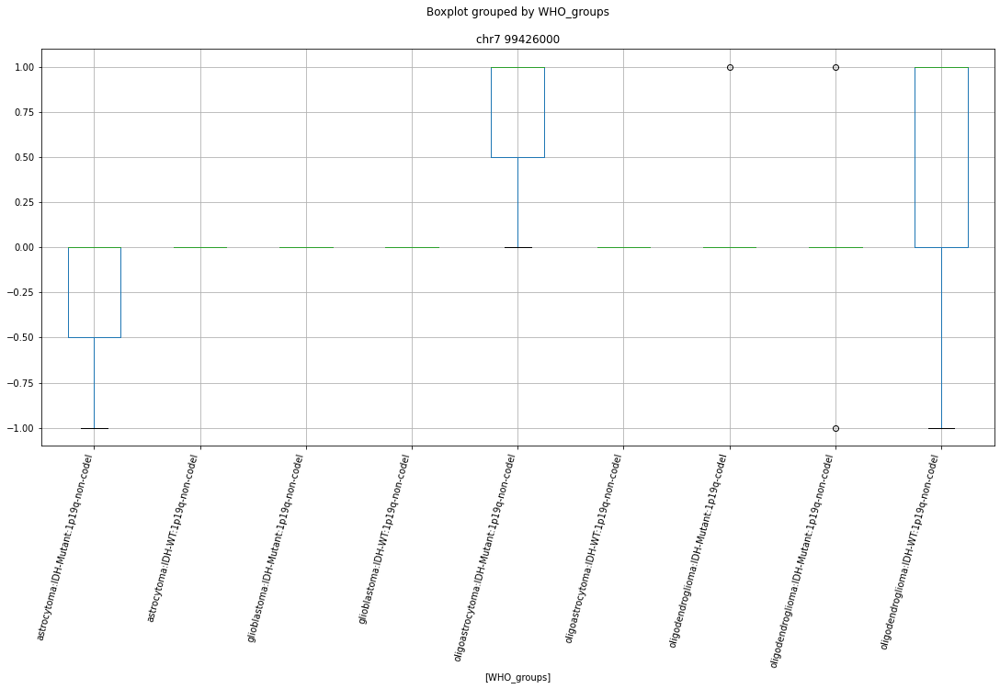

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr16 67712000


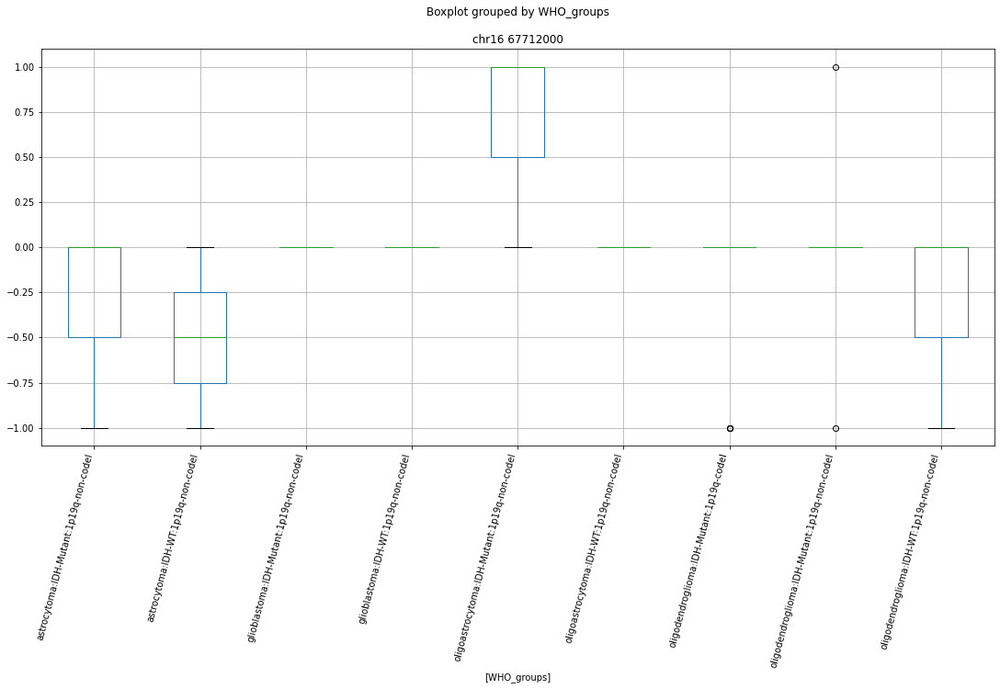

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chrX 71645000


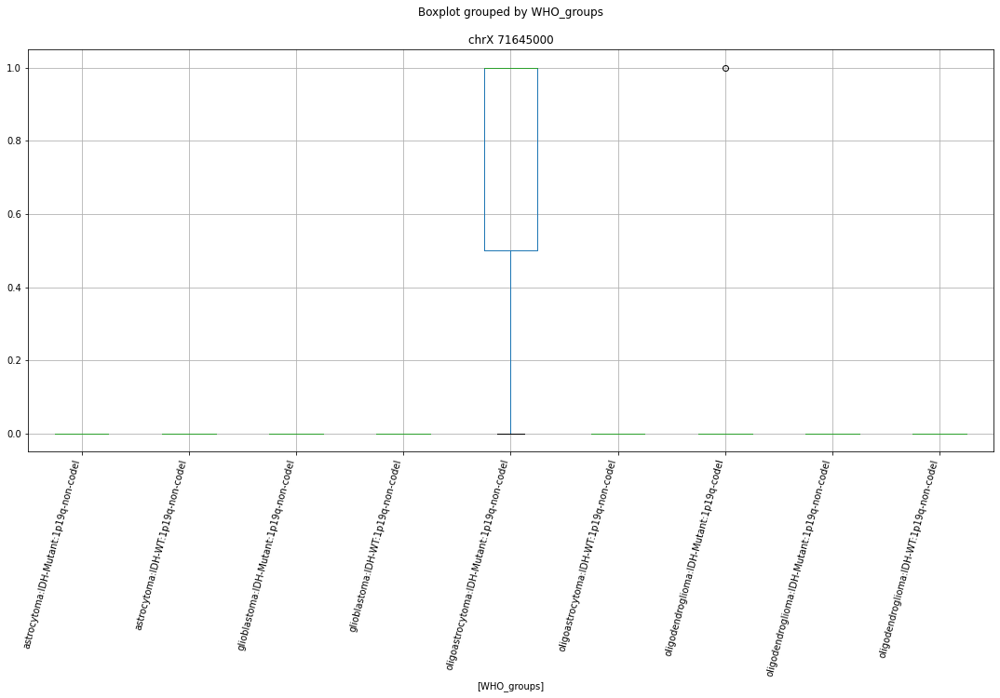

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr11 82181000


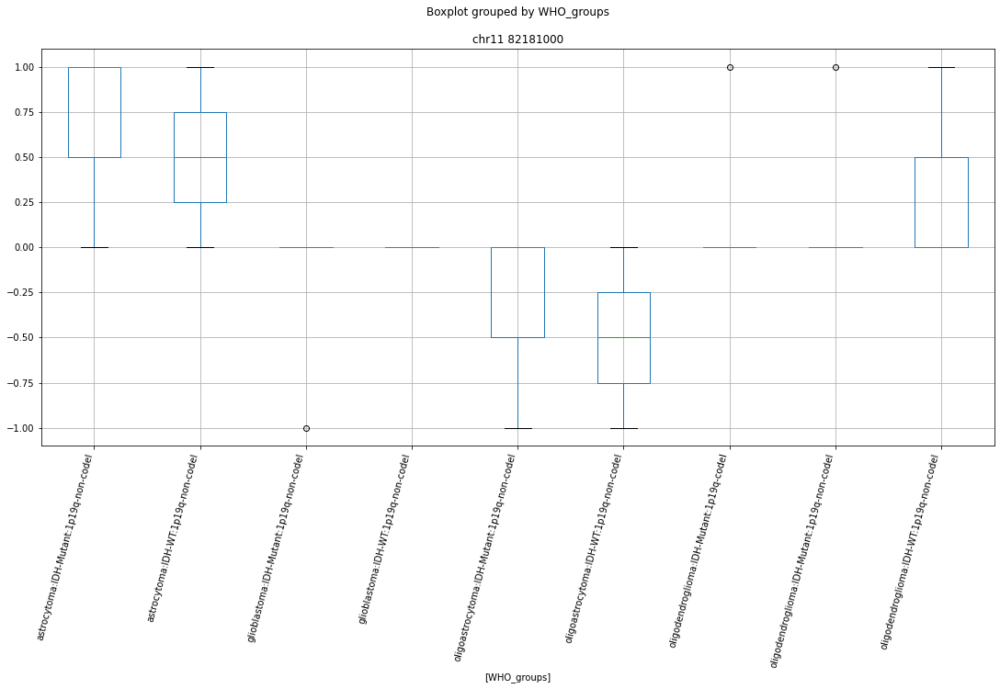

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr1 6306000


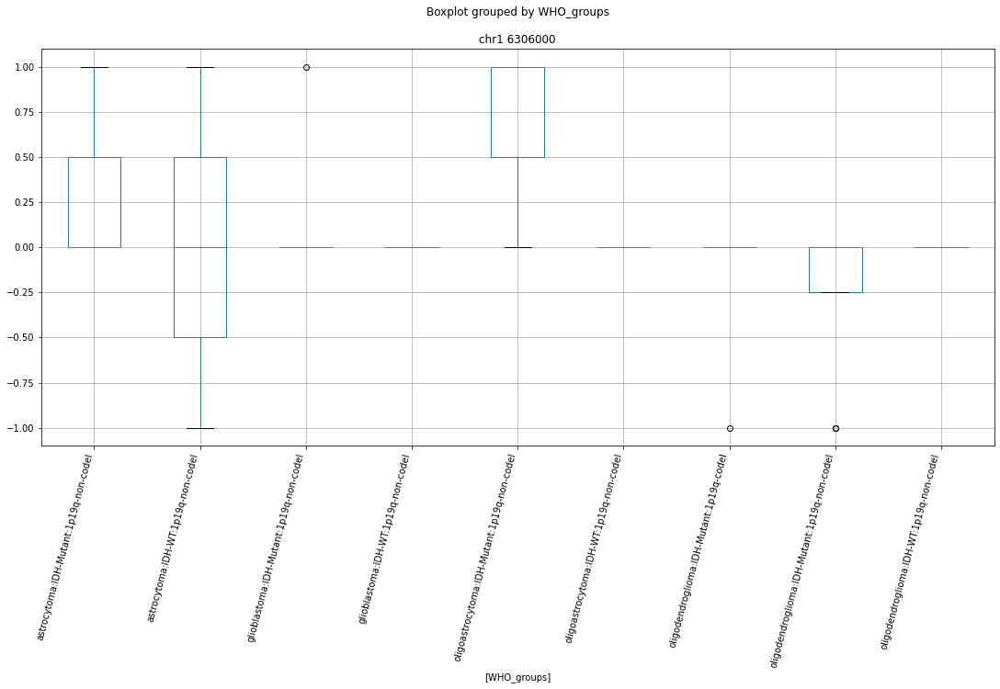

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr14 73185000


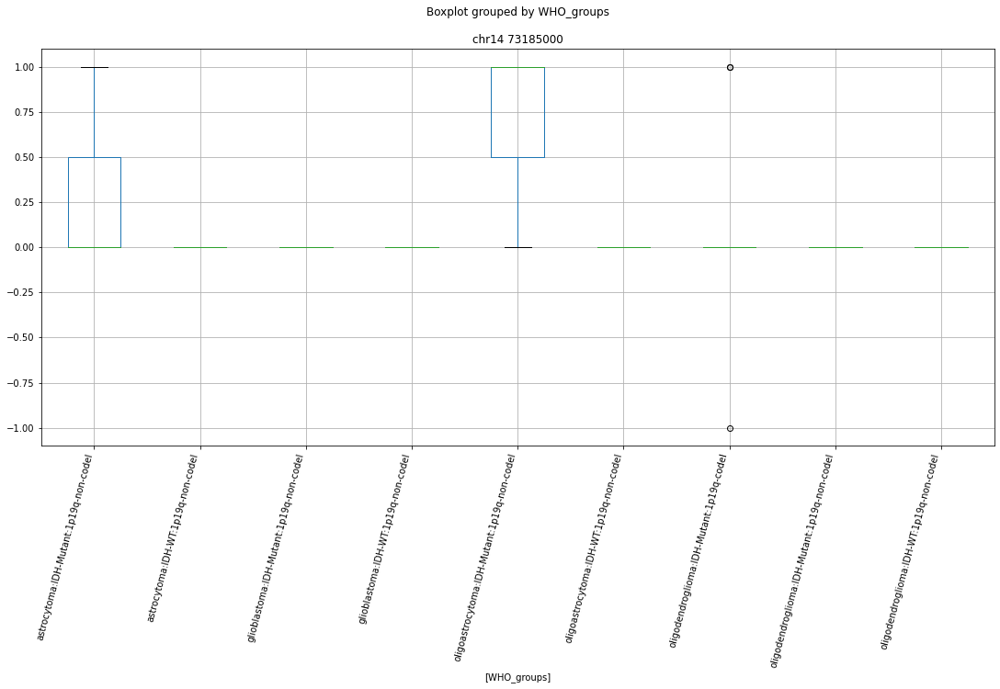

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr19 12361000


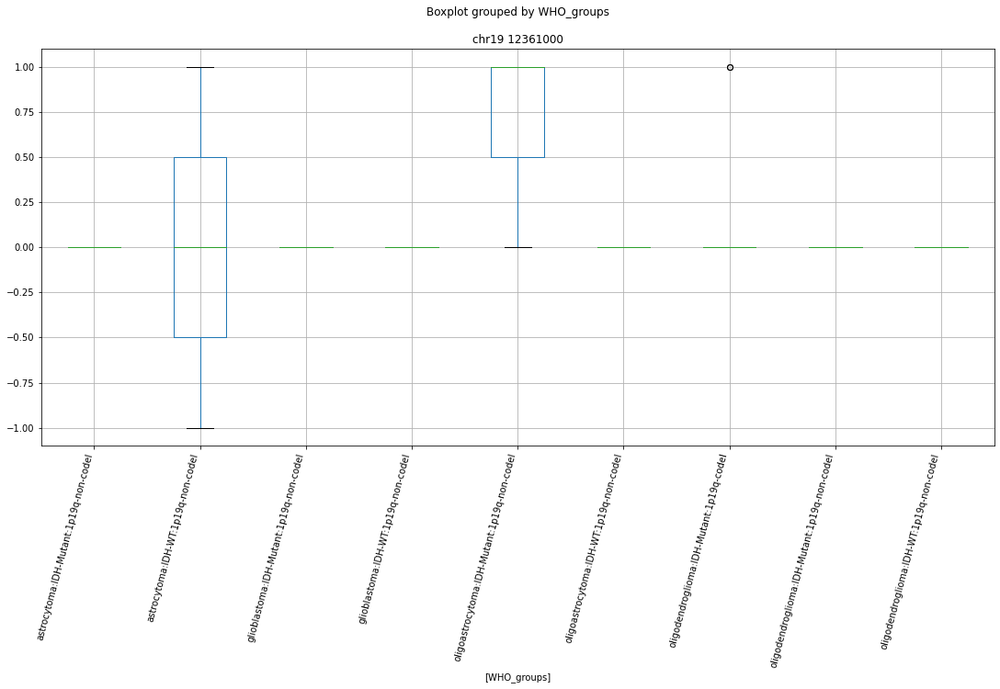

 p : 1.0057539453153324e-07  ( t : 7.099295739719539 ) :  chr1 77871000


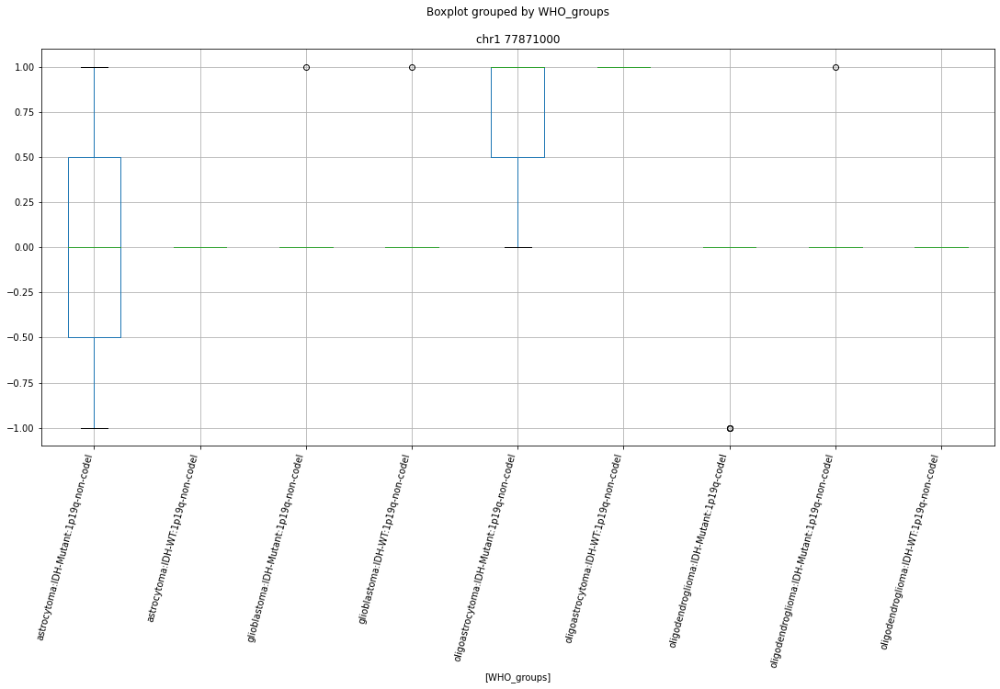

 p : 7.652029423525033e-07  ( t : 6.268199309263001 ) :  chr22 18042000


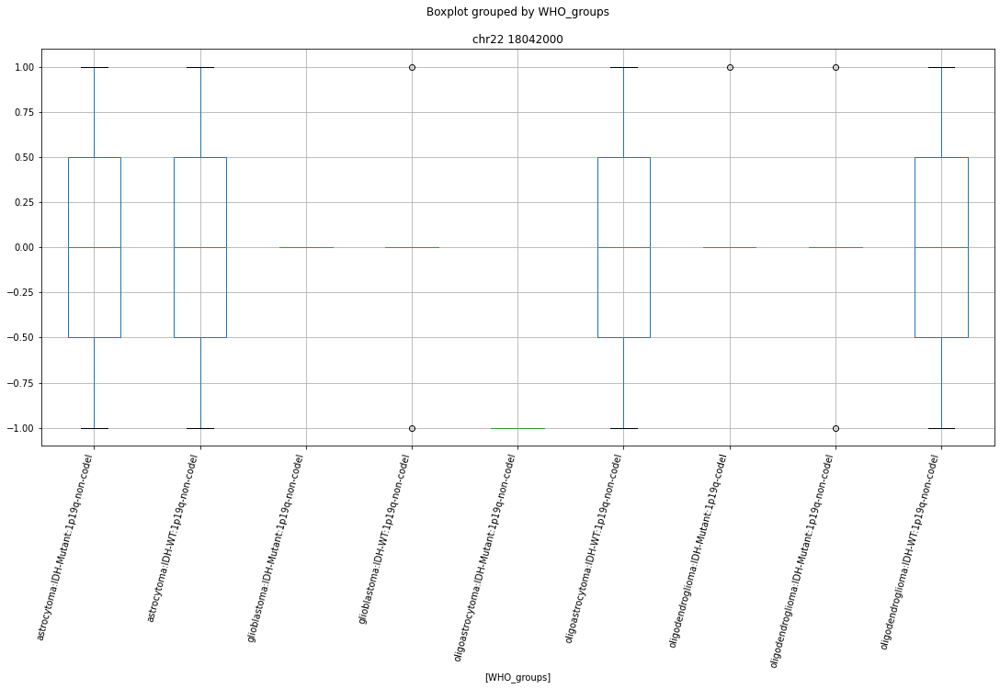

 p : 7.652029423525033e-07  ( t : 6.268199309263001 ) :  chr20 25561000


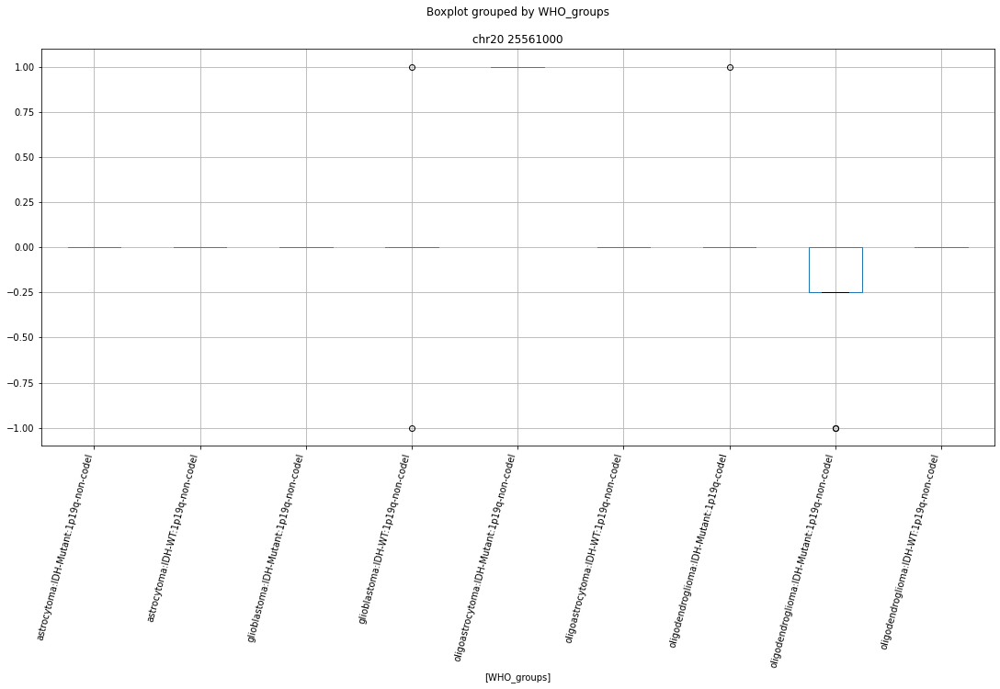

 p : 1.852189847381658e-06  ( t : 7.078507127770286 ) :  chr2 191456000


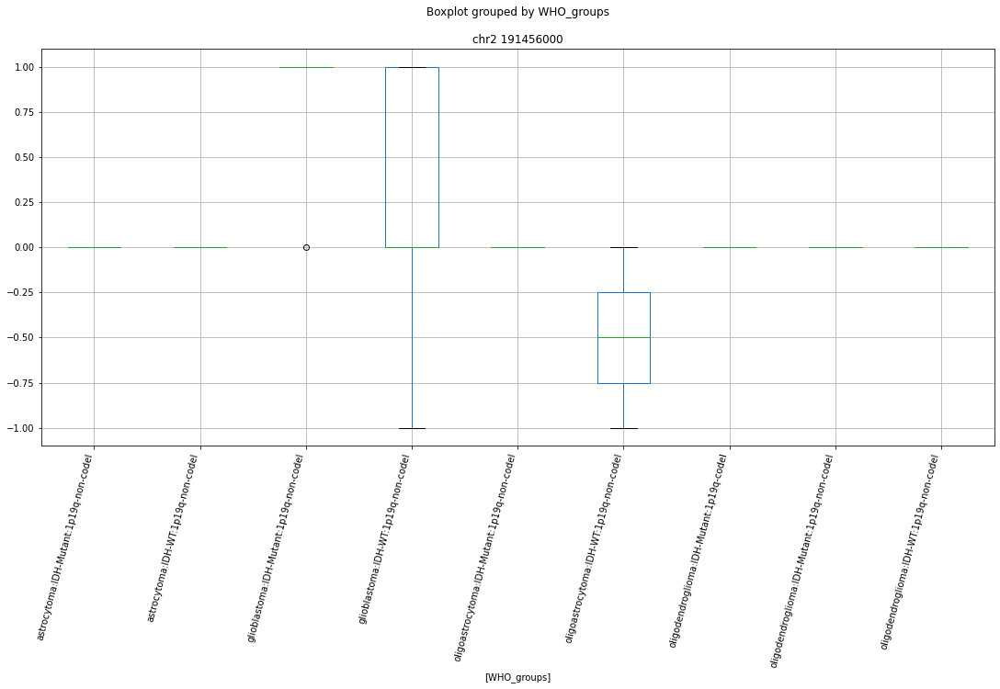

 p : 1.852189847381658e-06  ( t : 7.078507127770286 ) :  chr1 23854000


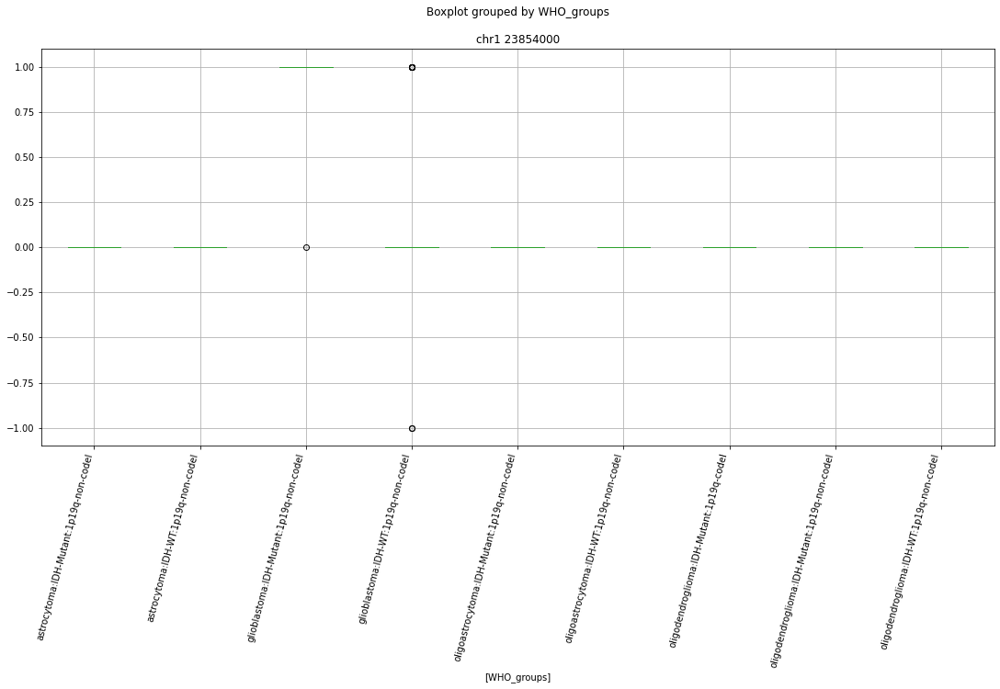

 p : 6.320613449404128e-06  ( t : 6.7686394229571025 ) :  chr22 18042000


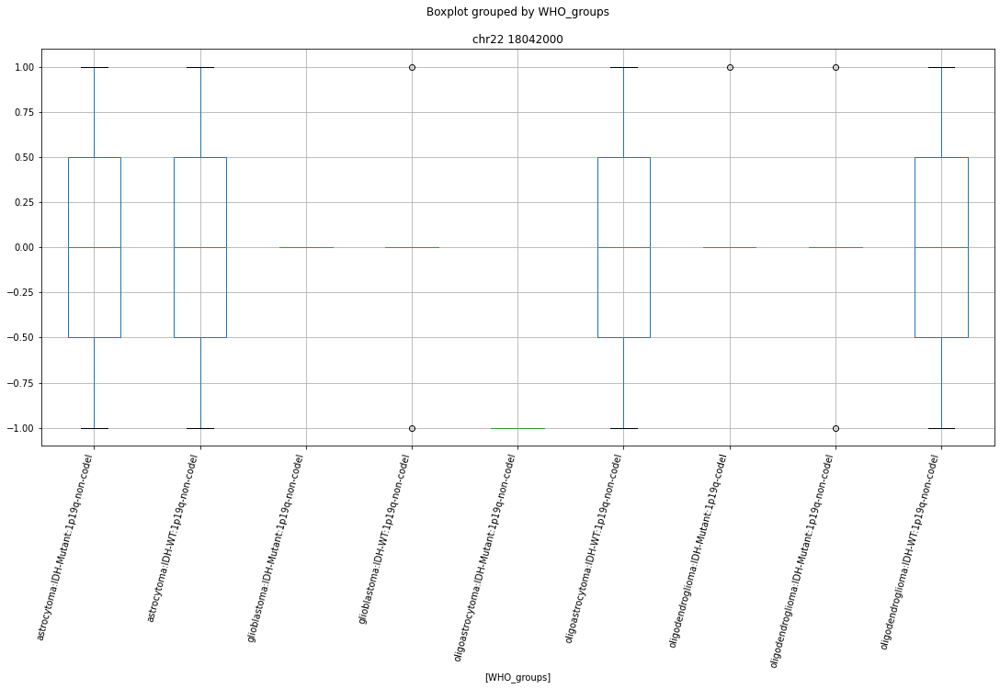

Clustermapping
['WHO_groups' 'chr1 10029000' 'chr1 106413000' ... 'chrY 12452000'
 'chrY 4294000' 'subject']


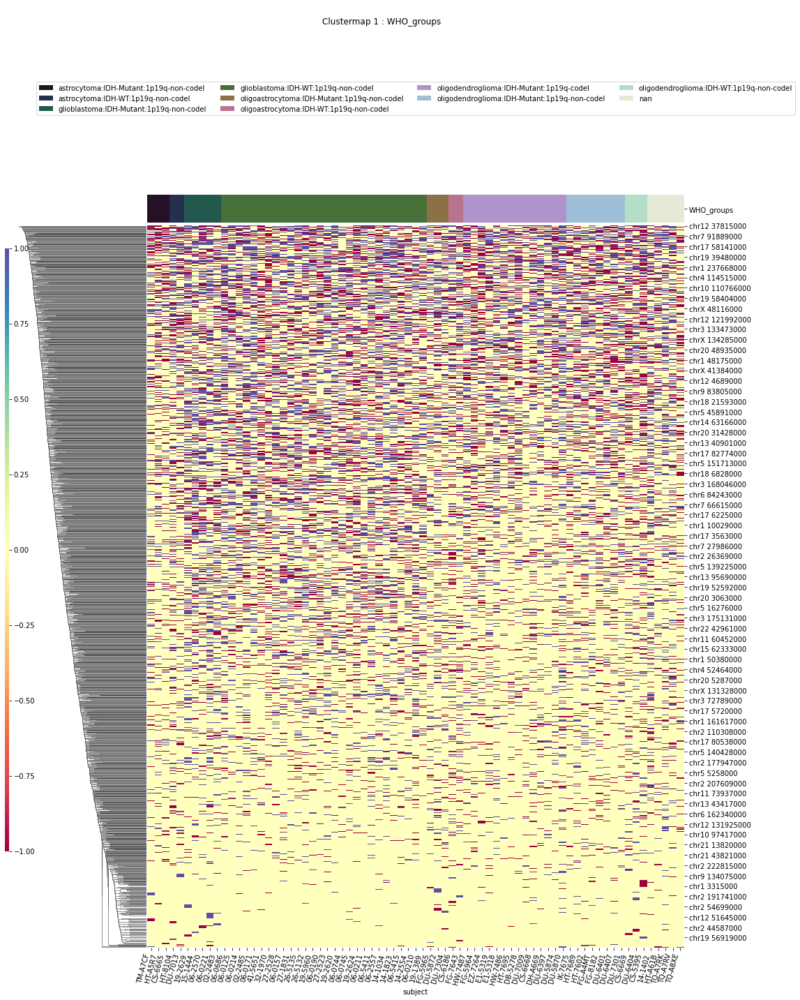

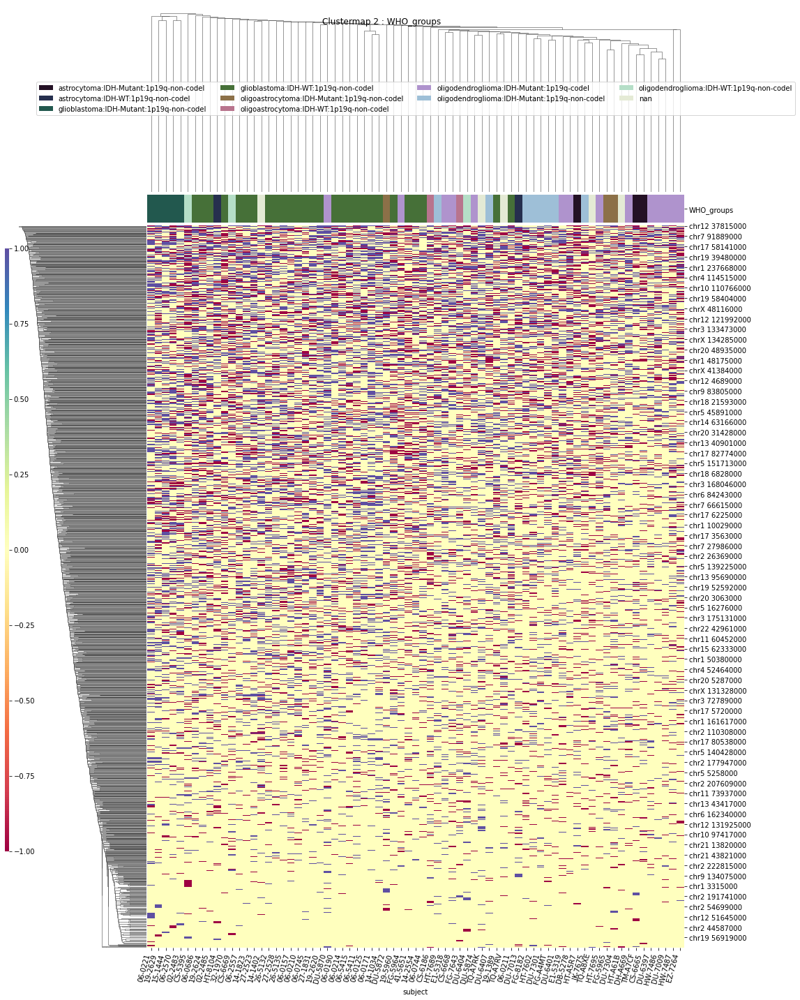

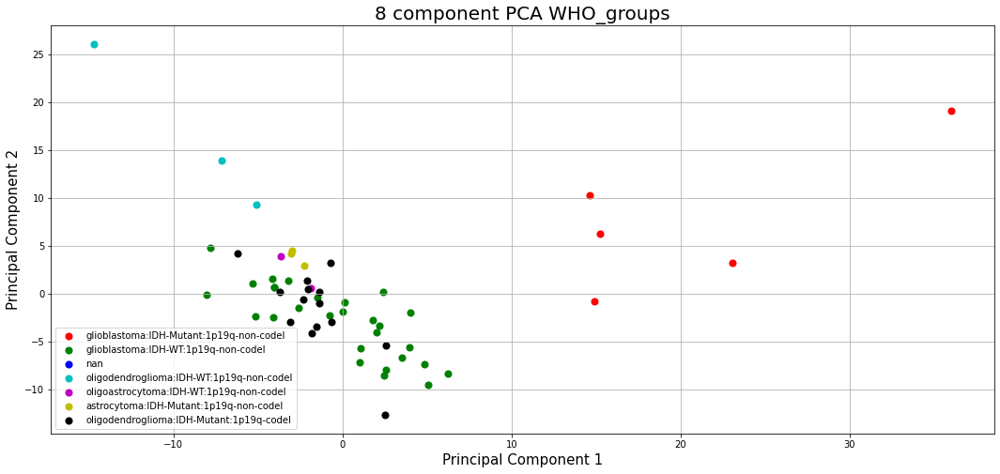

Triple_group
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
 p : 5.980116350794693e-09  ( t : 7.768066499641796 ) :  chr21 45267000


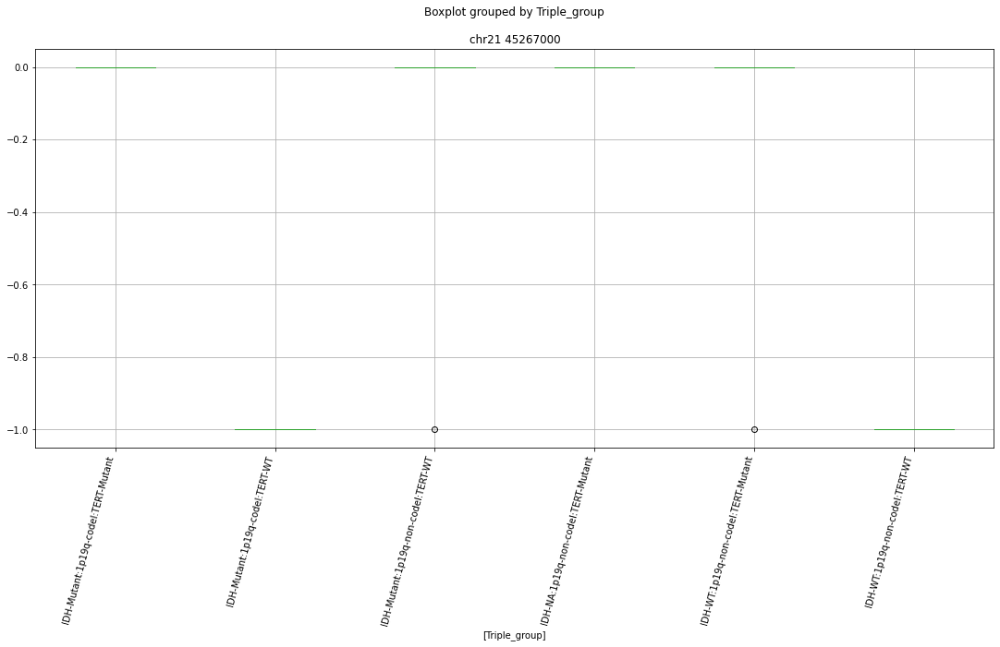

 p : 1.714740087022125e-06  ( t : 6.362389488234746 ) :  chr21 45267000


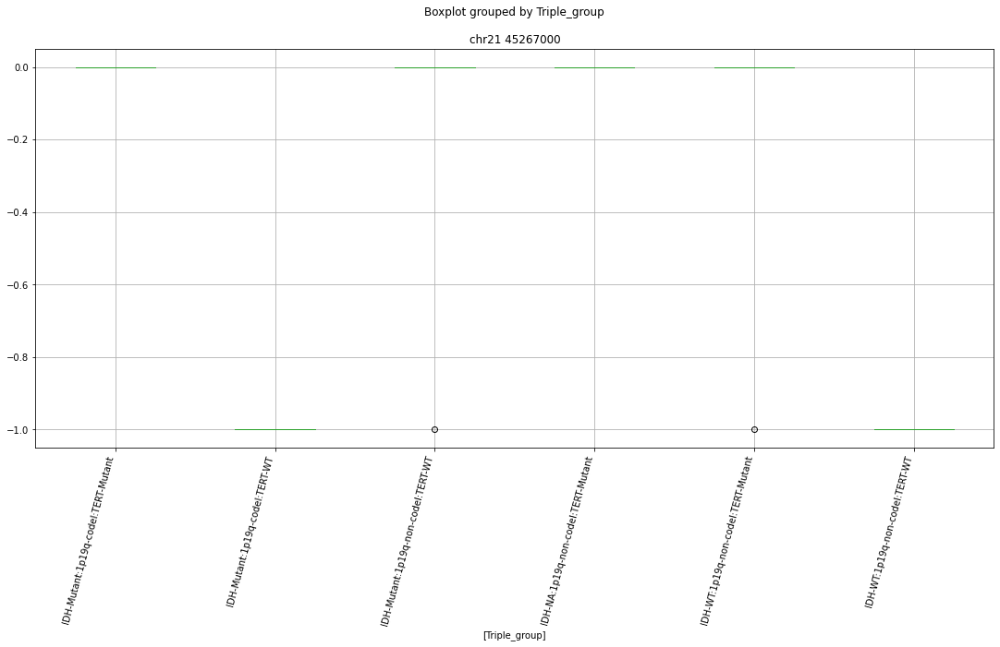

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 149420000


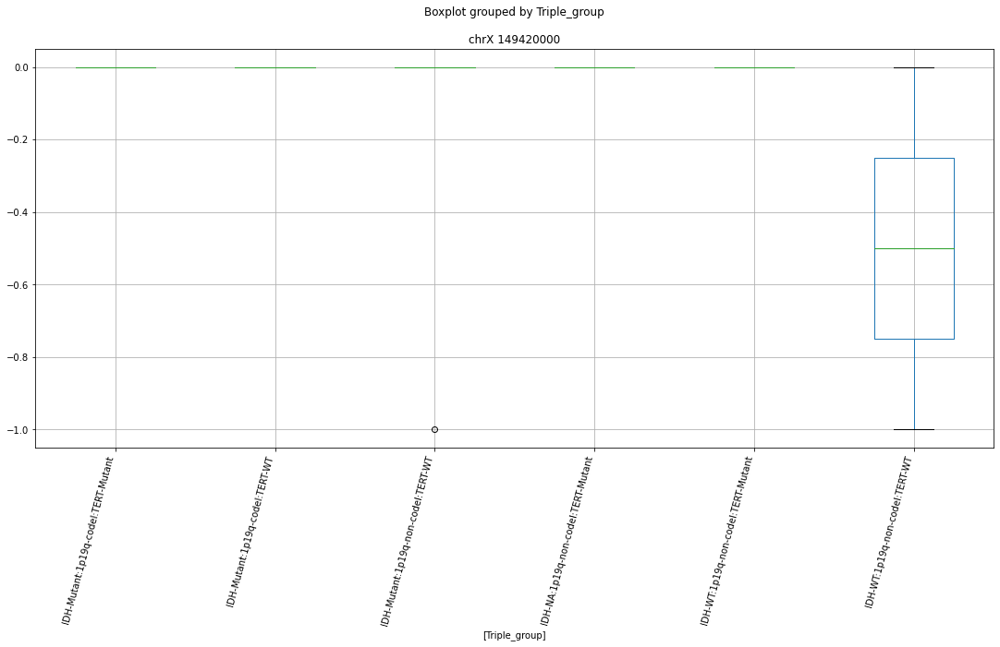

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr12 119919000


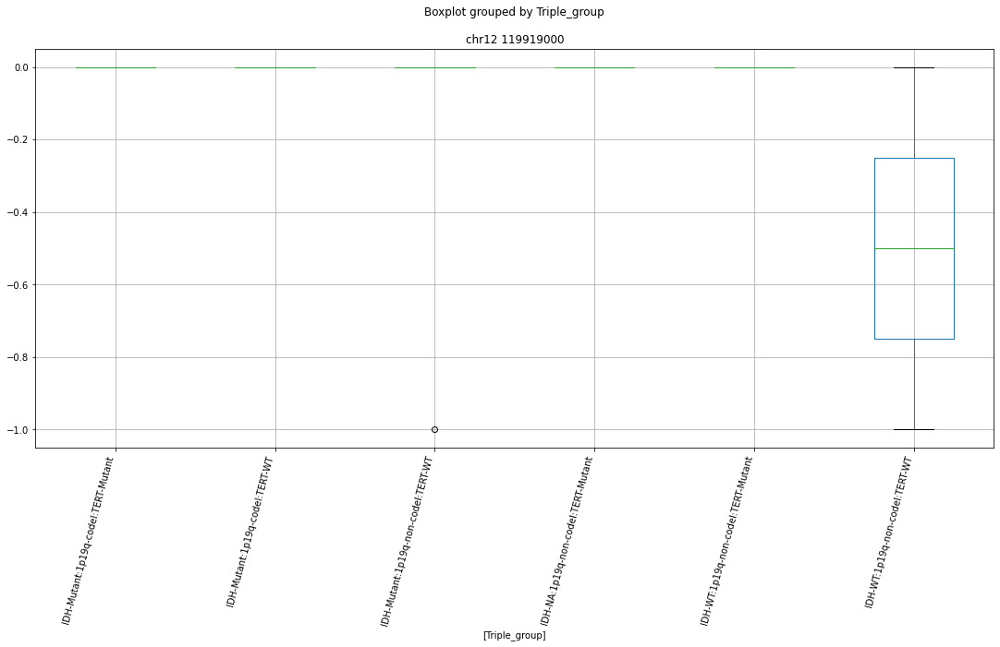

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 220467000


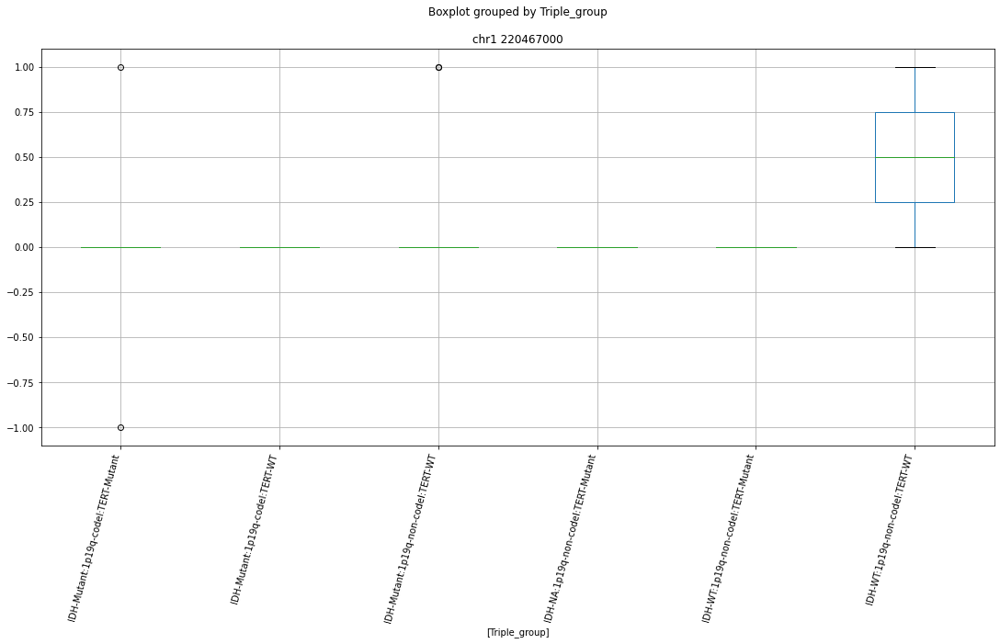

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr2 63808000


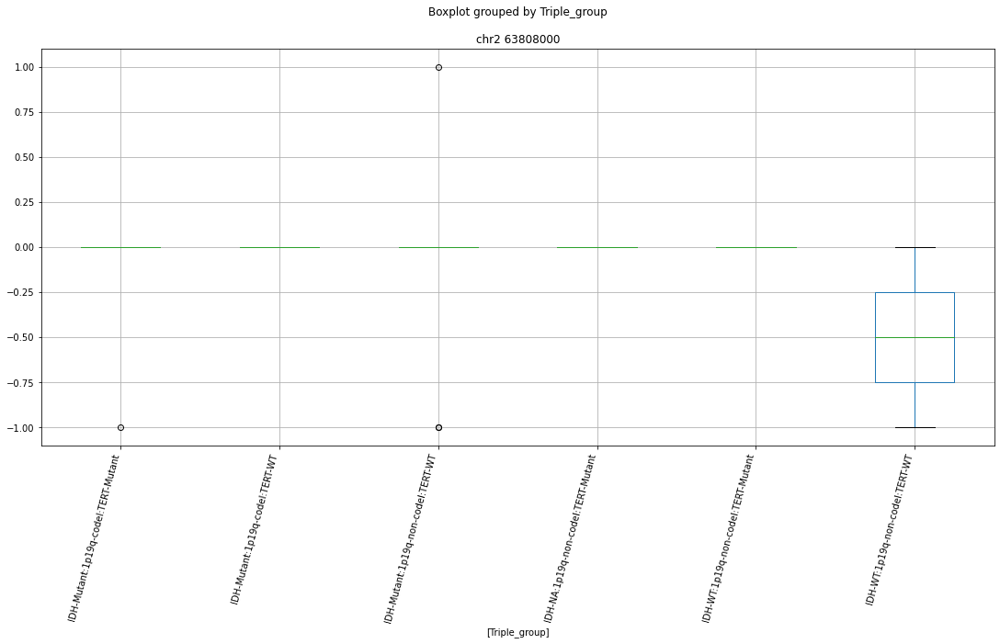

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr11 76583000


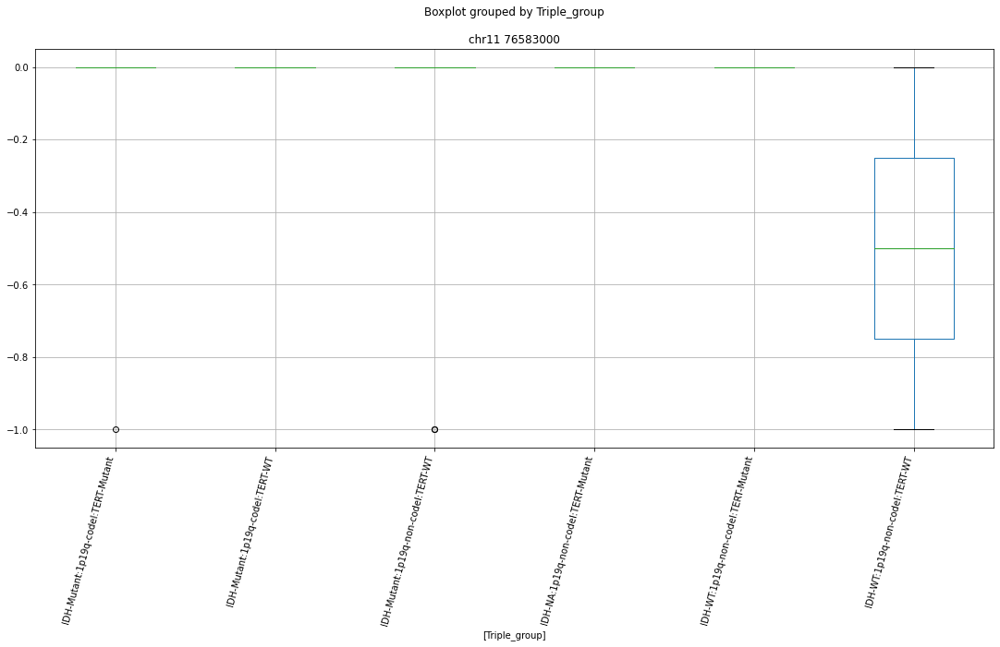

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 45042000


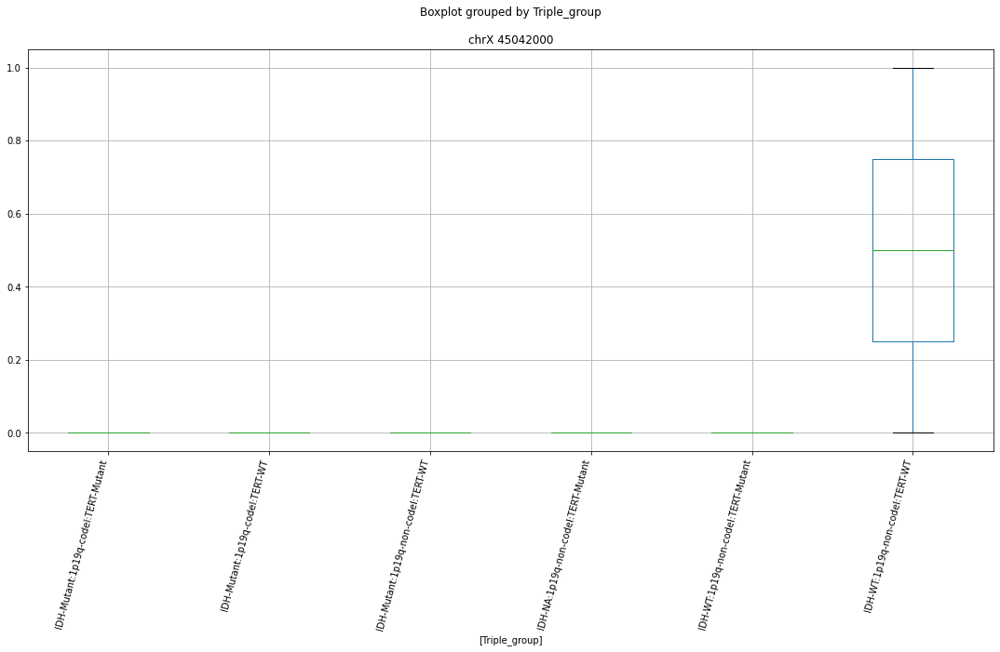

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr14 35978000


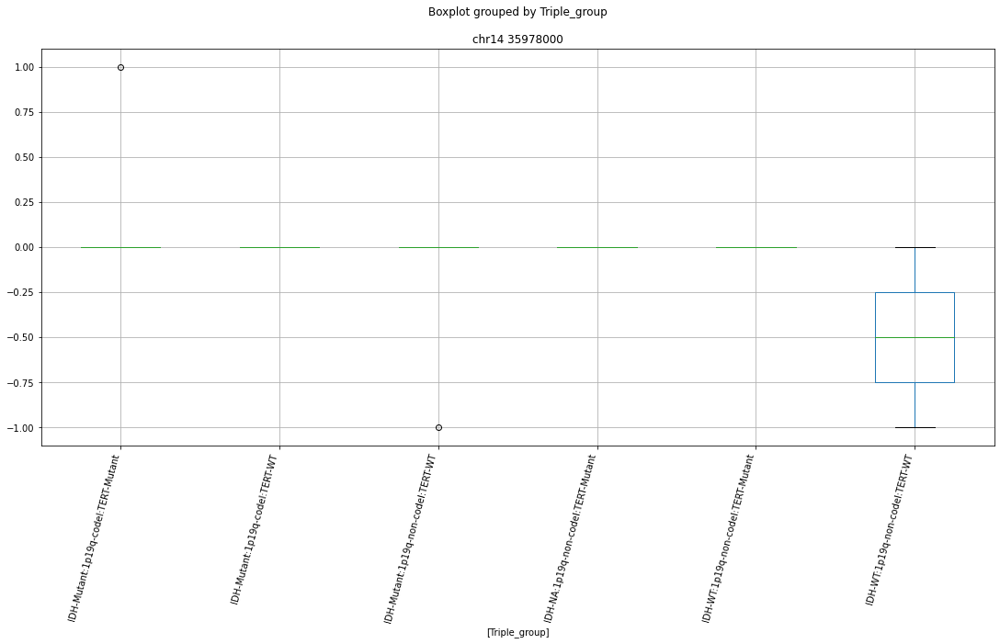

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr11 73937000


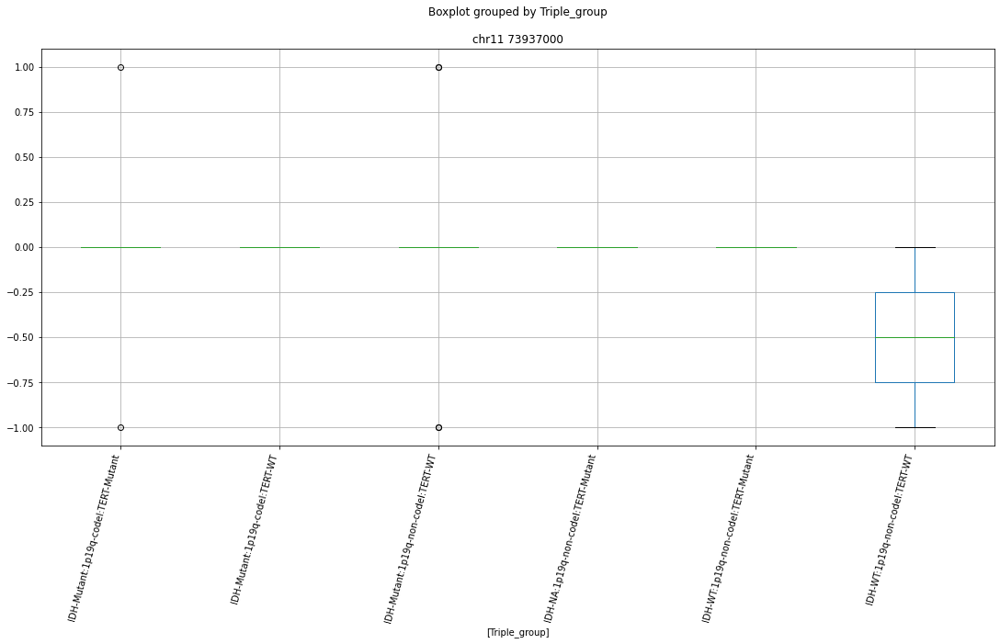

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr14 85830000


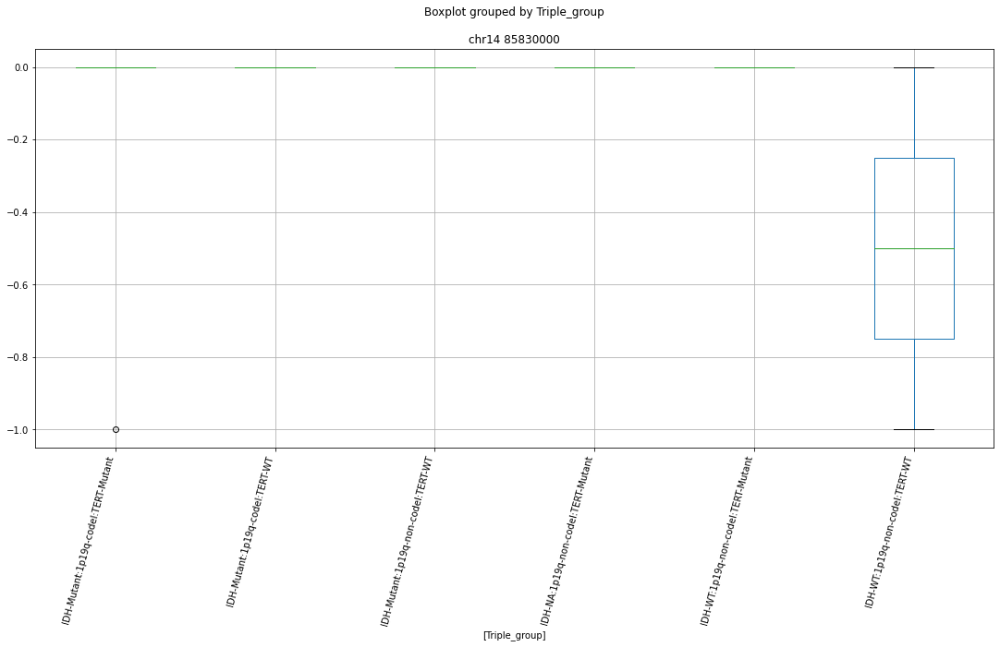

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 108490000


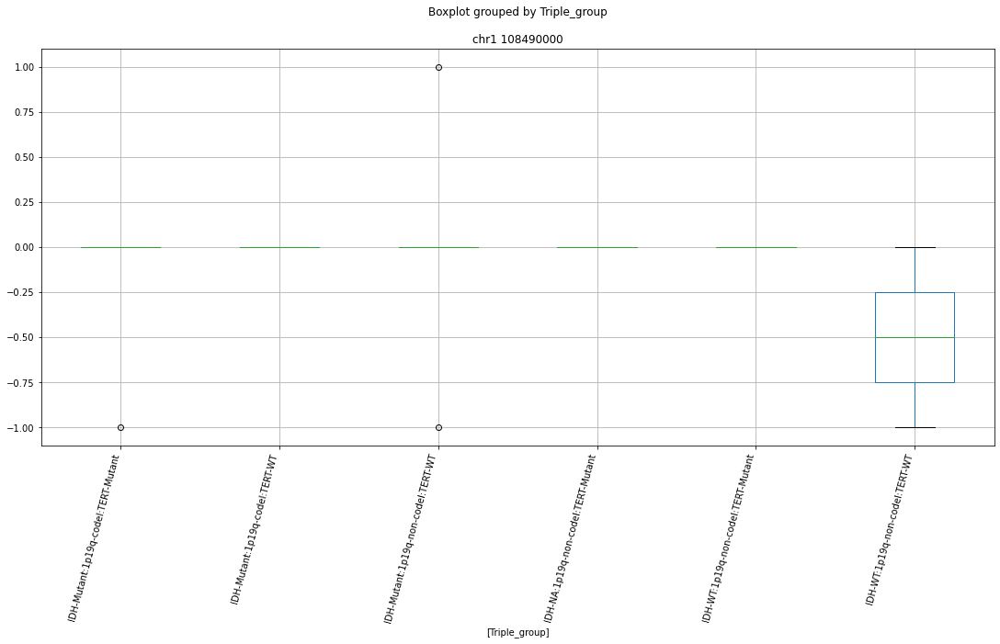

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 241416000


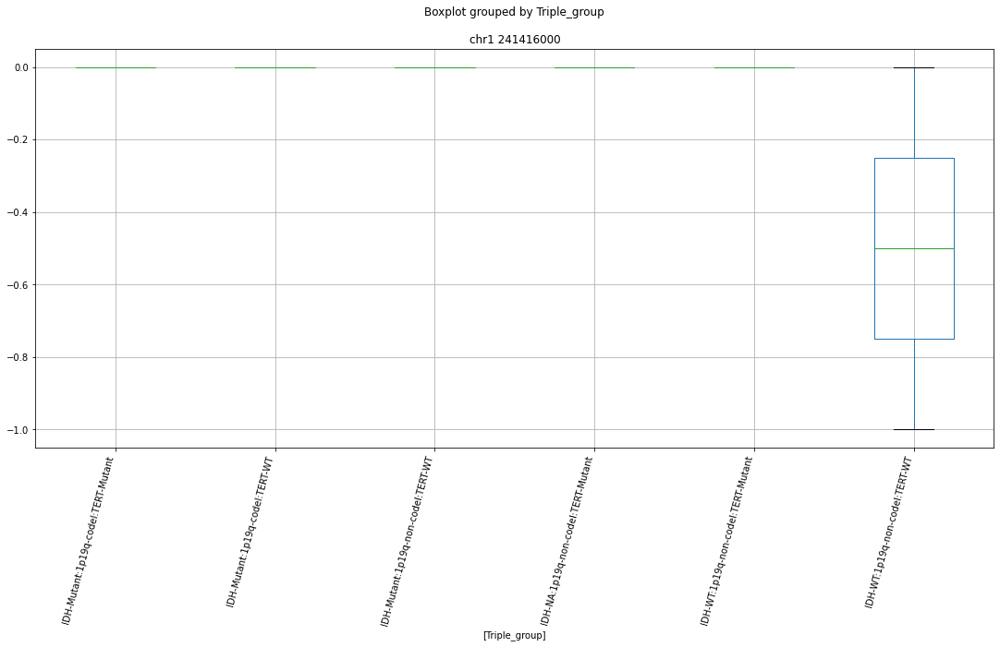

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr17 32923000


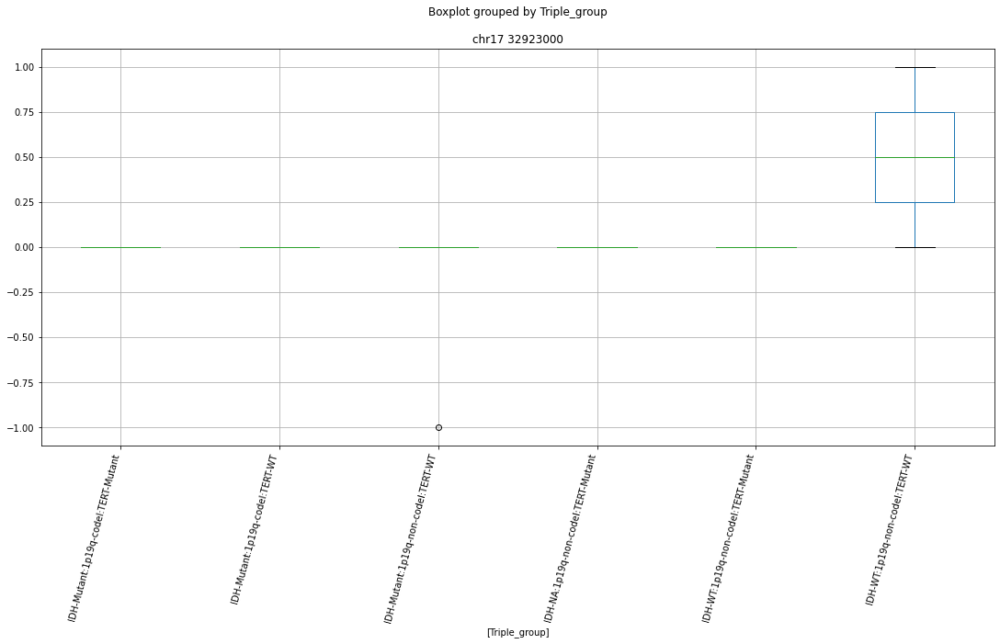

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr5 139169000


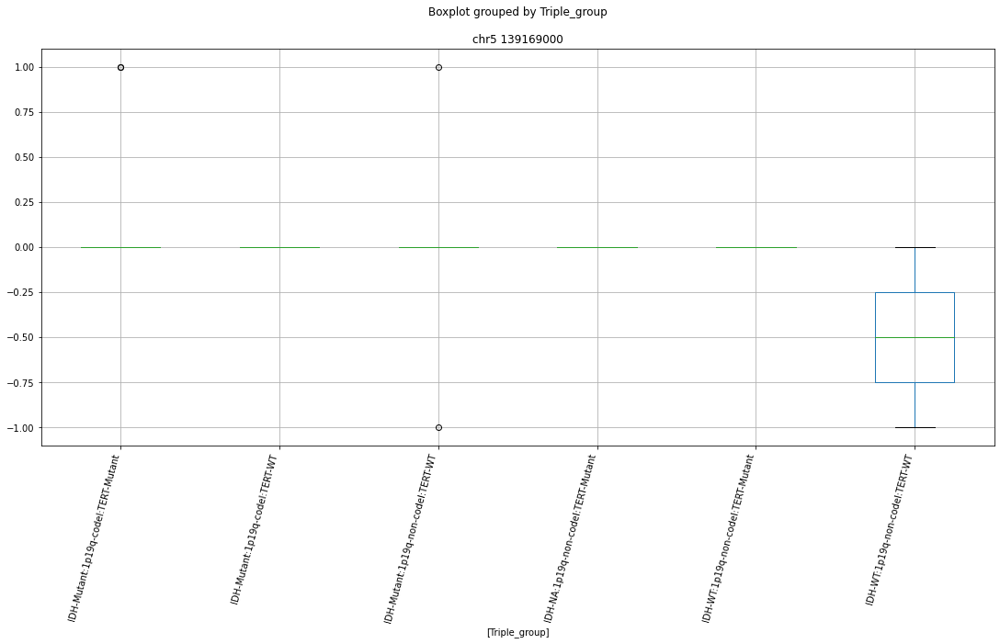

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 90892000


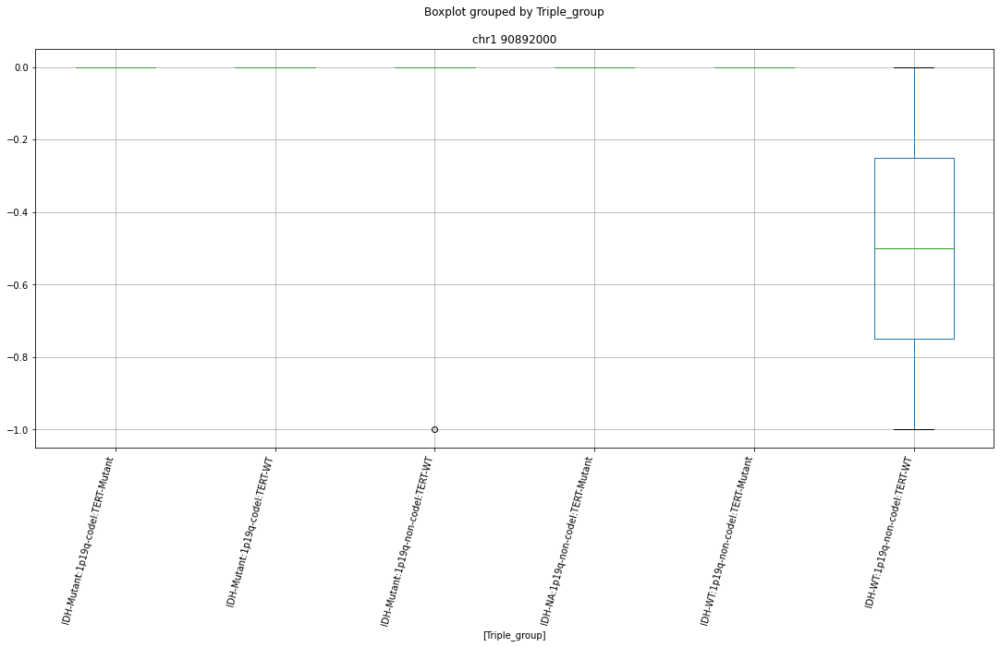

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr6 87752000


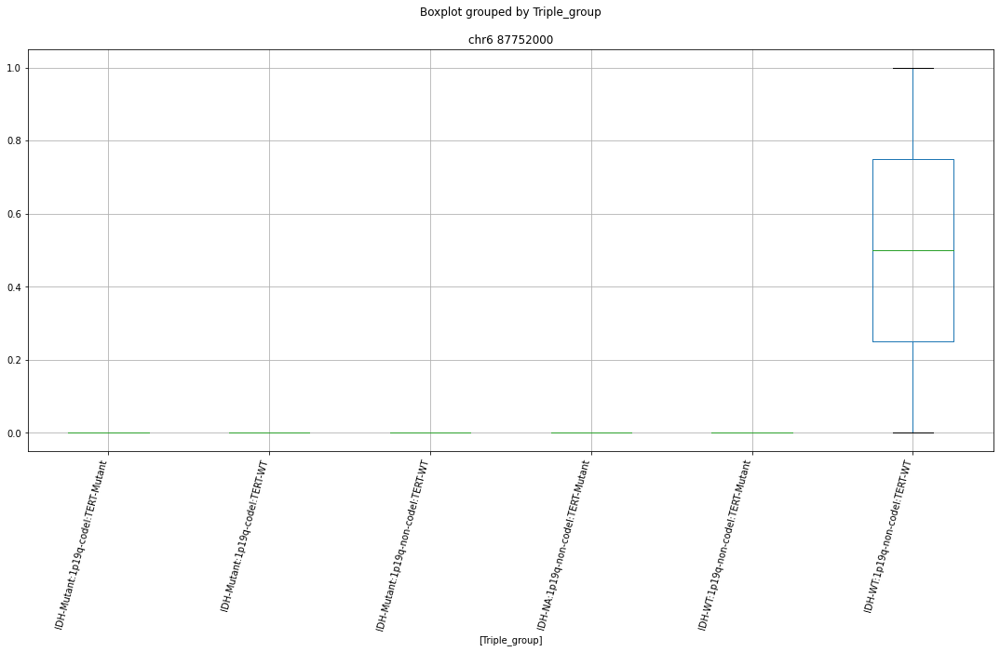

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr5 98814000


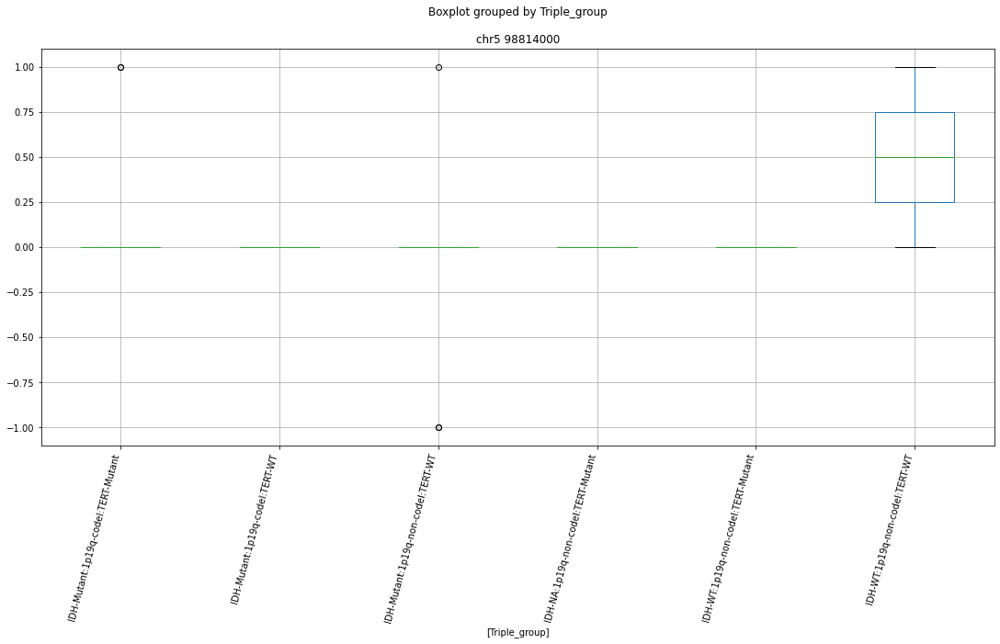

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr7 119611000


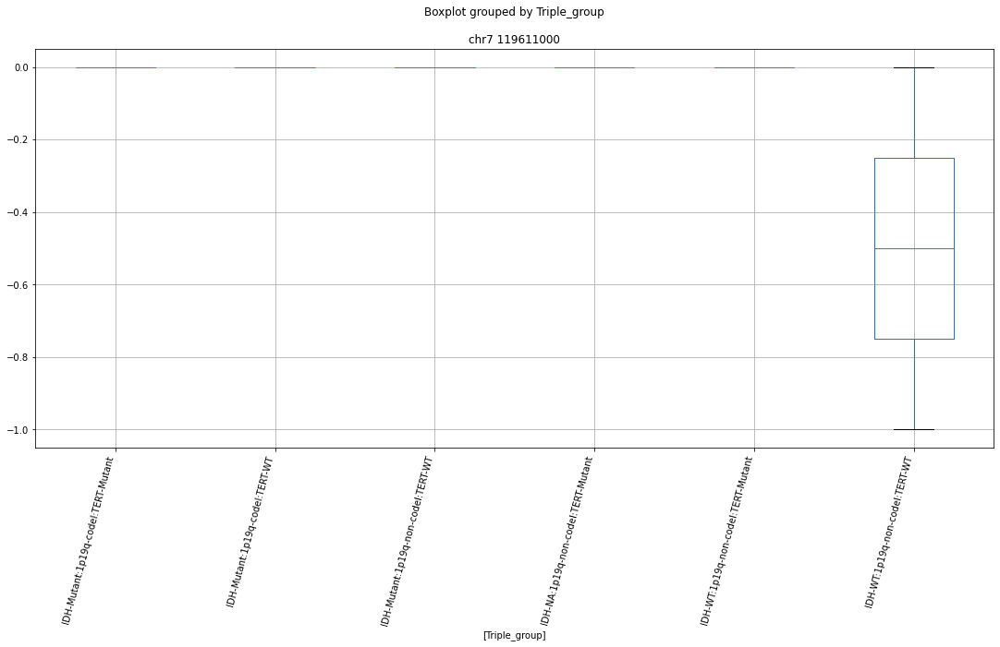

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr17 20556000


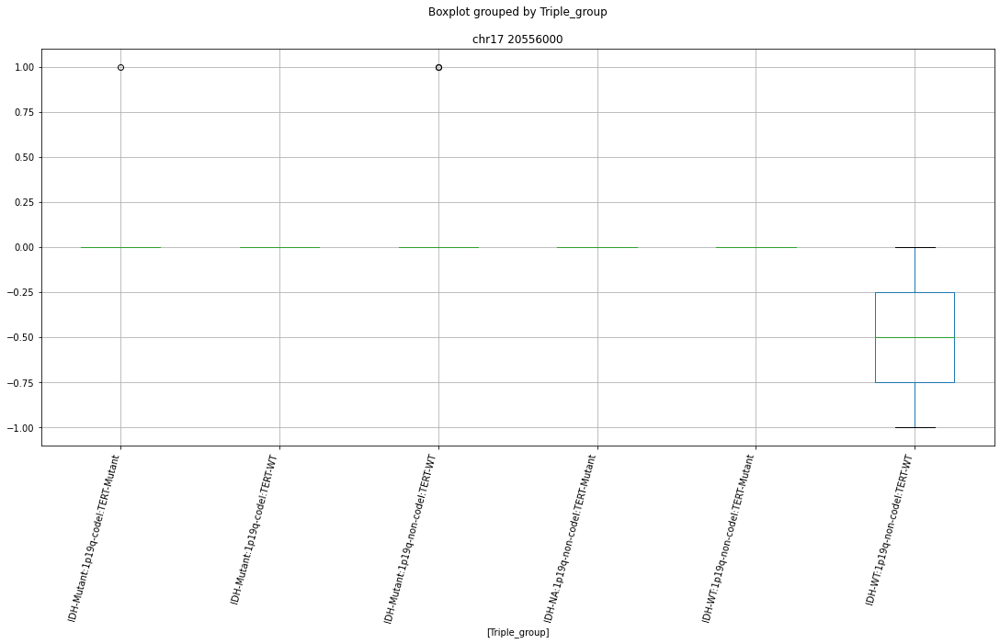

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr20 53862000


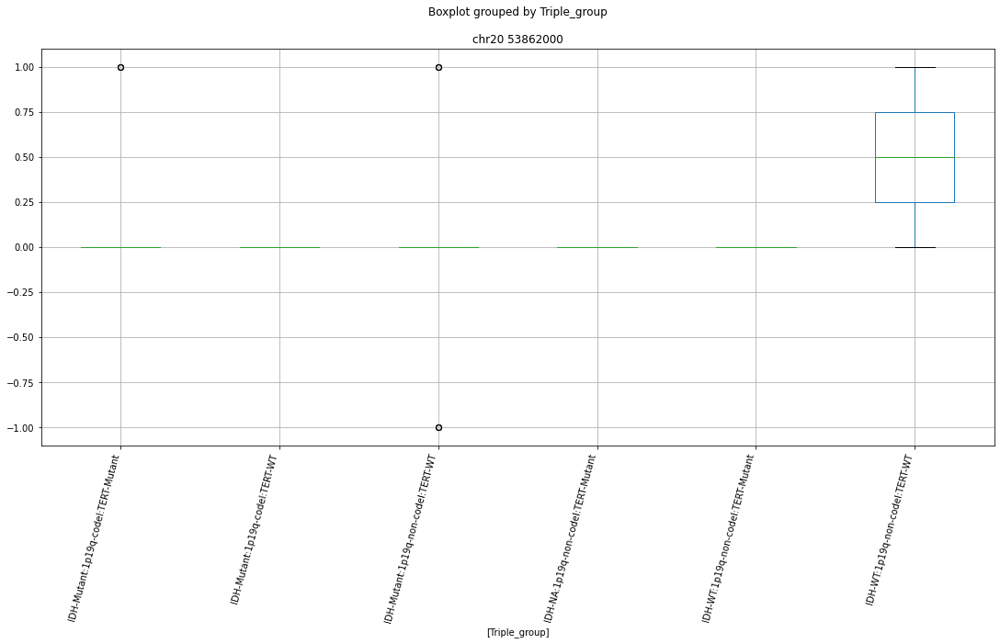

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 133484000


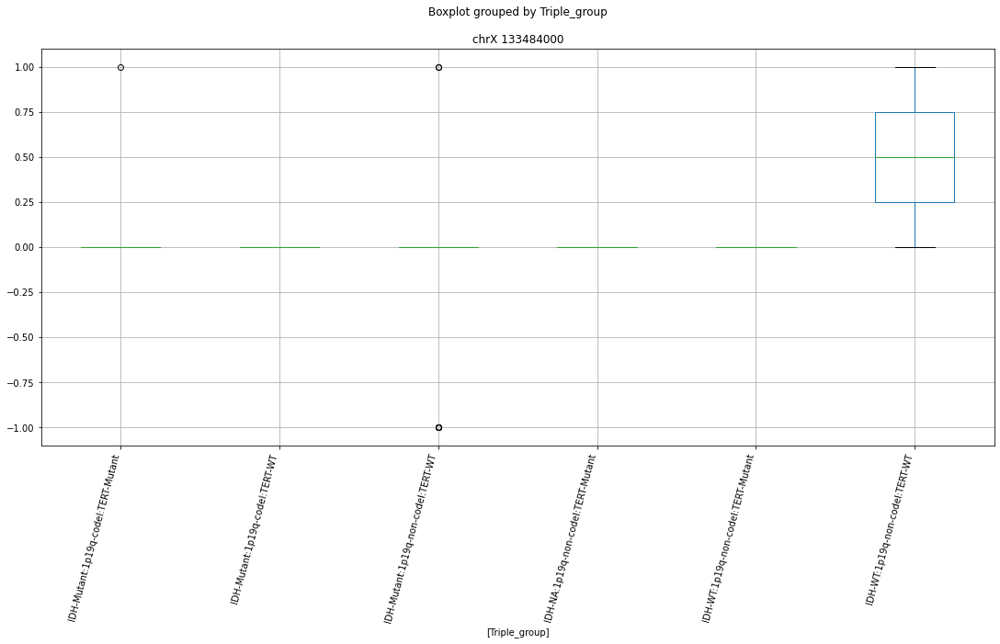

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr16 70050000


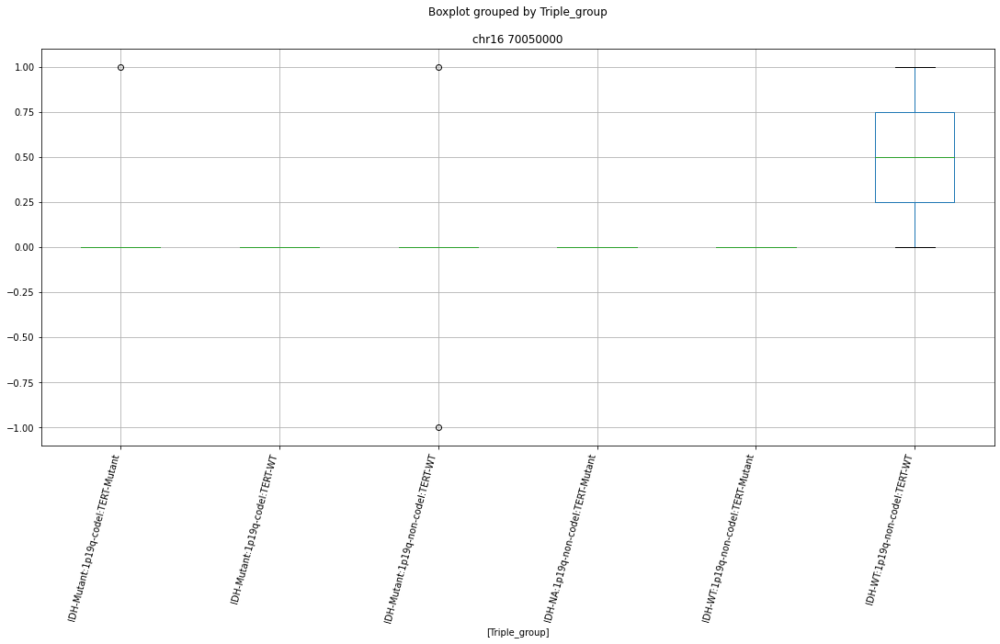

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 126640000


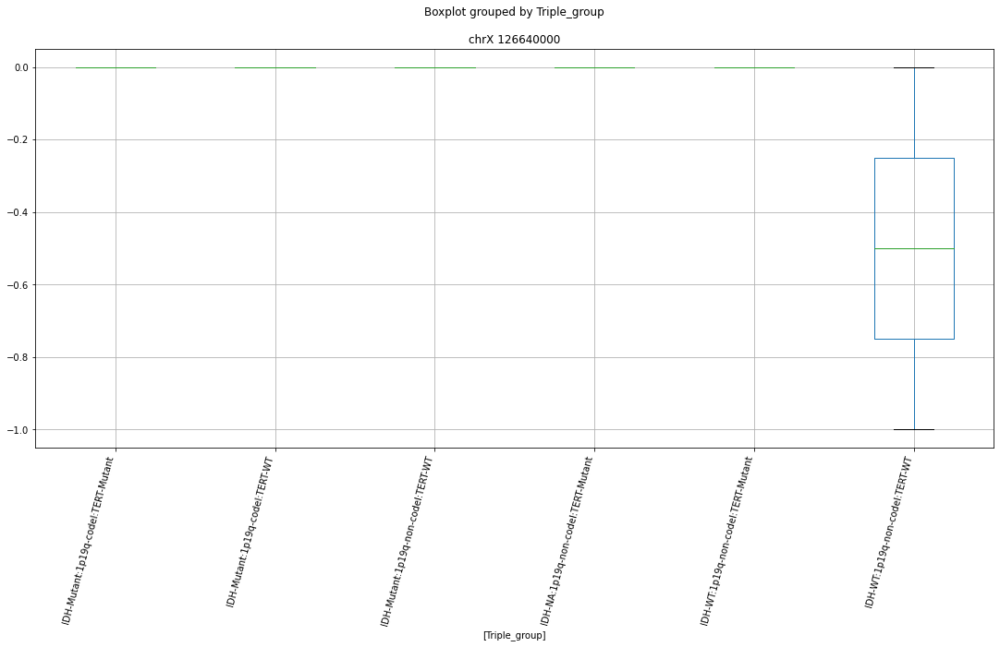

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr11 4237000


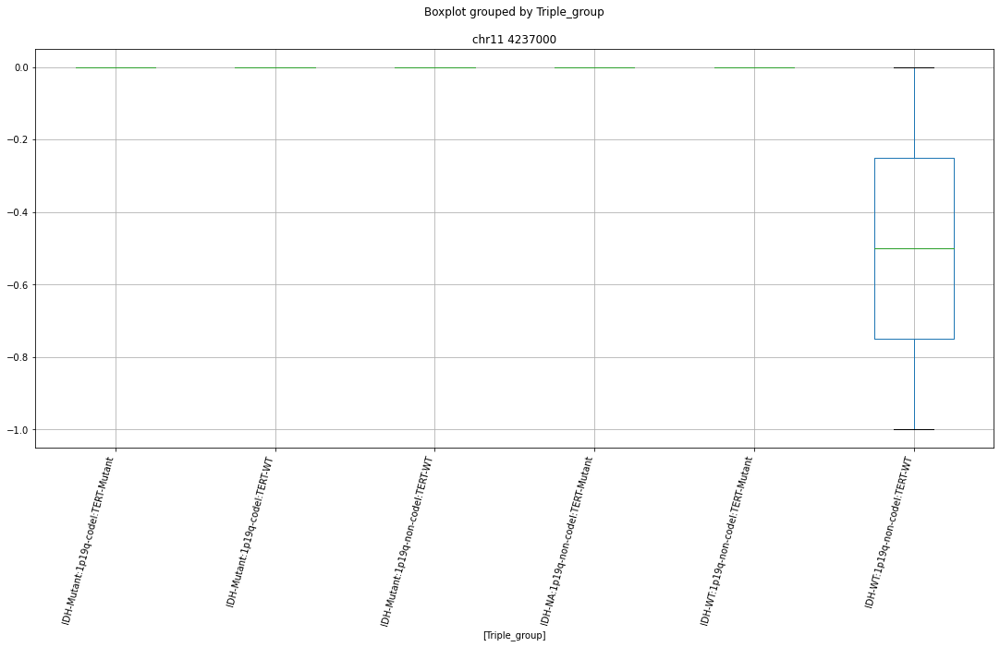

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr3 146095000


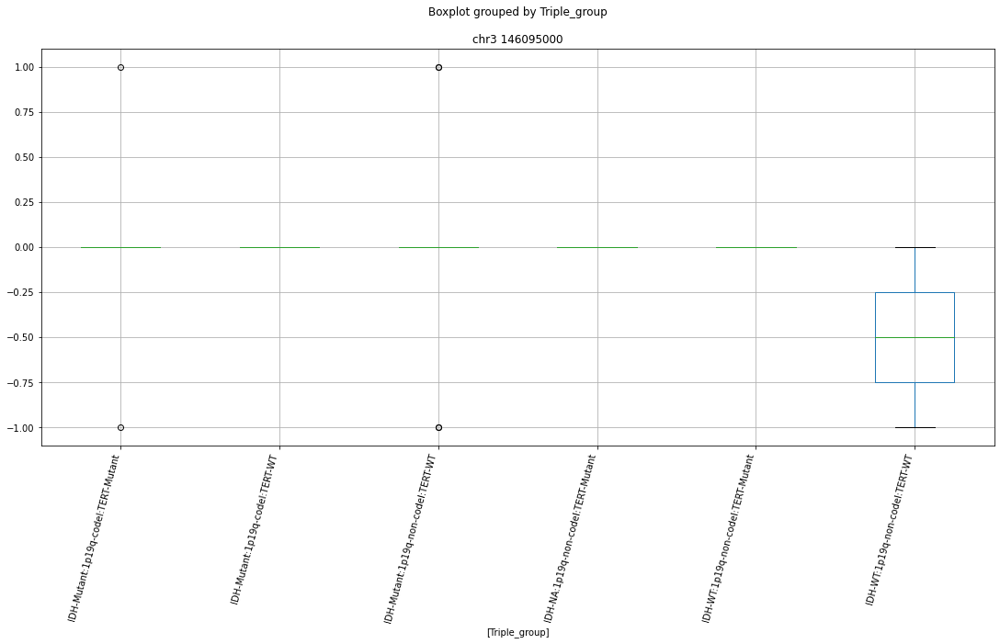

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr13 30840000


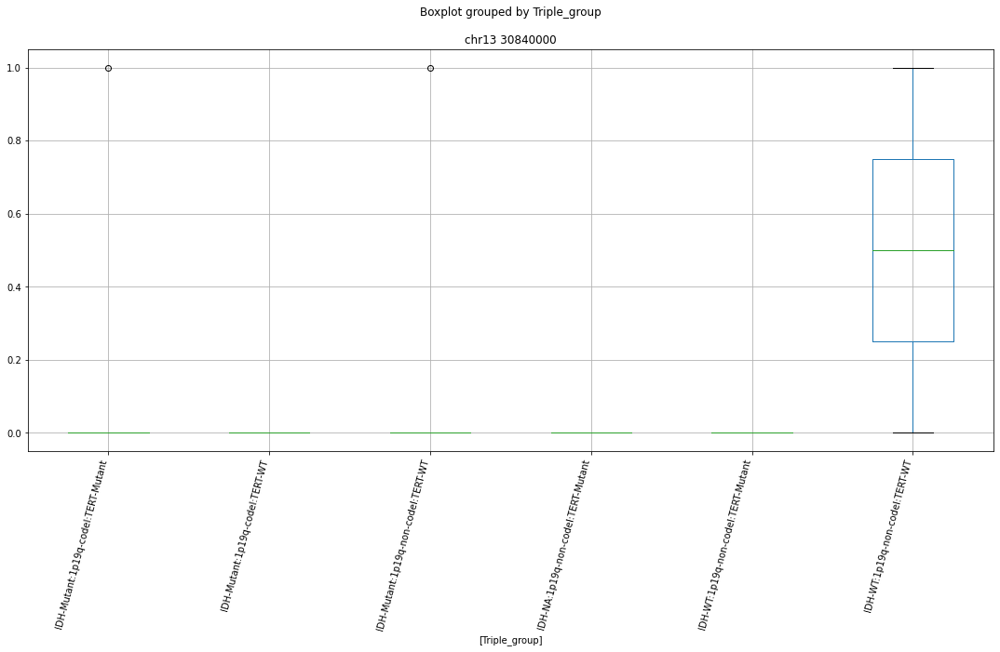

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr22 31184000


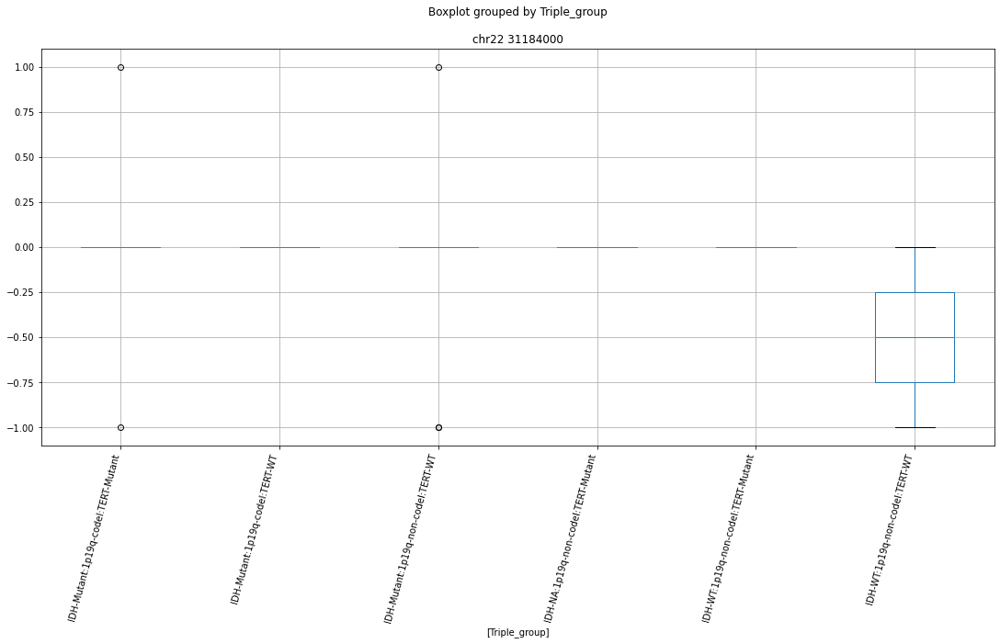

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr14 76898000


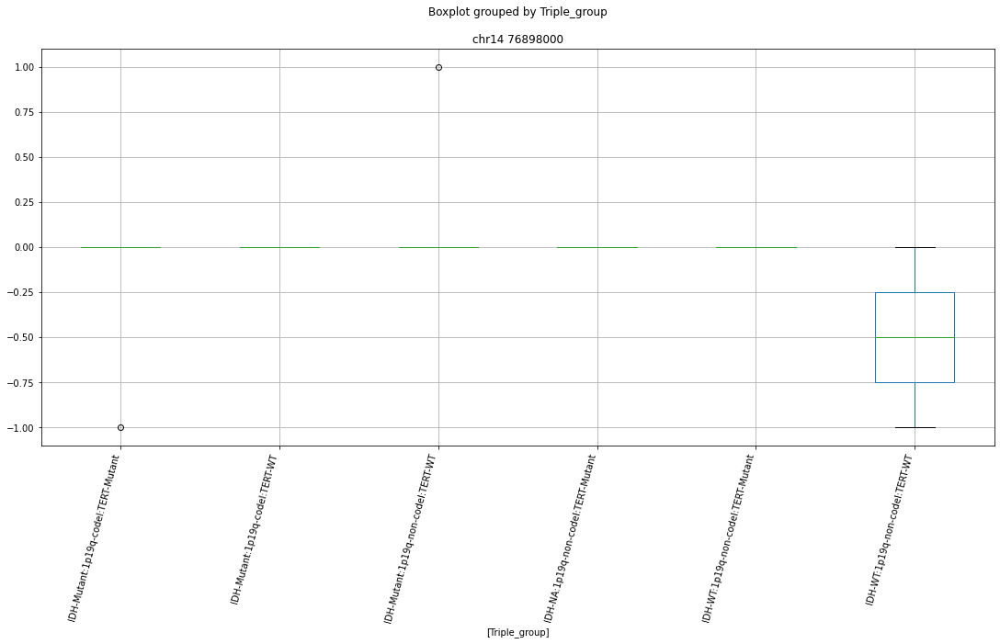

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr10 70688000


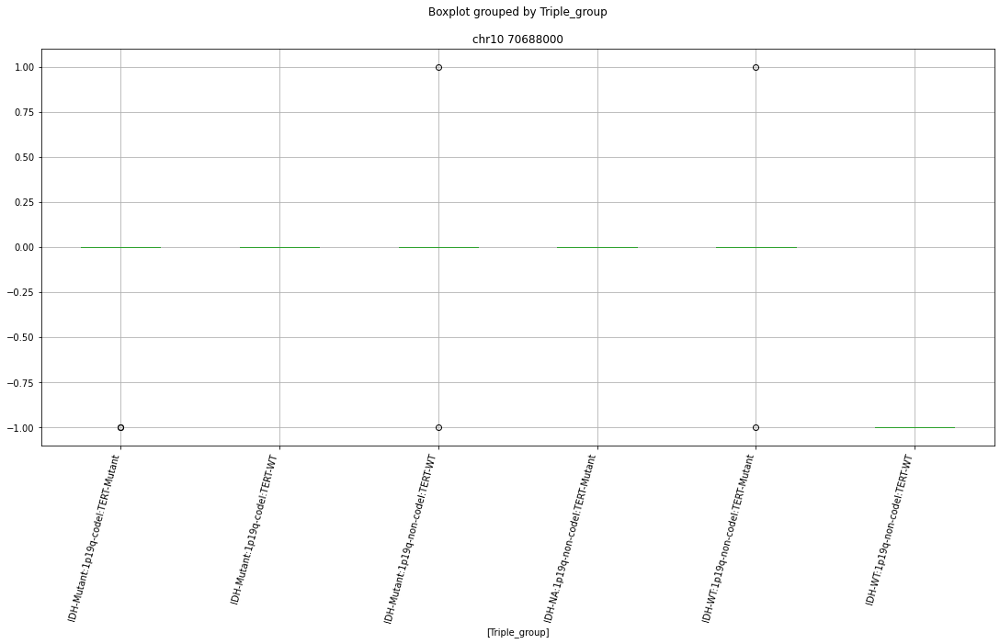

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr11 65450000


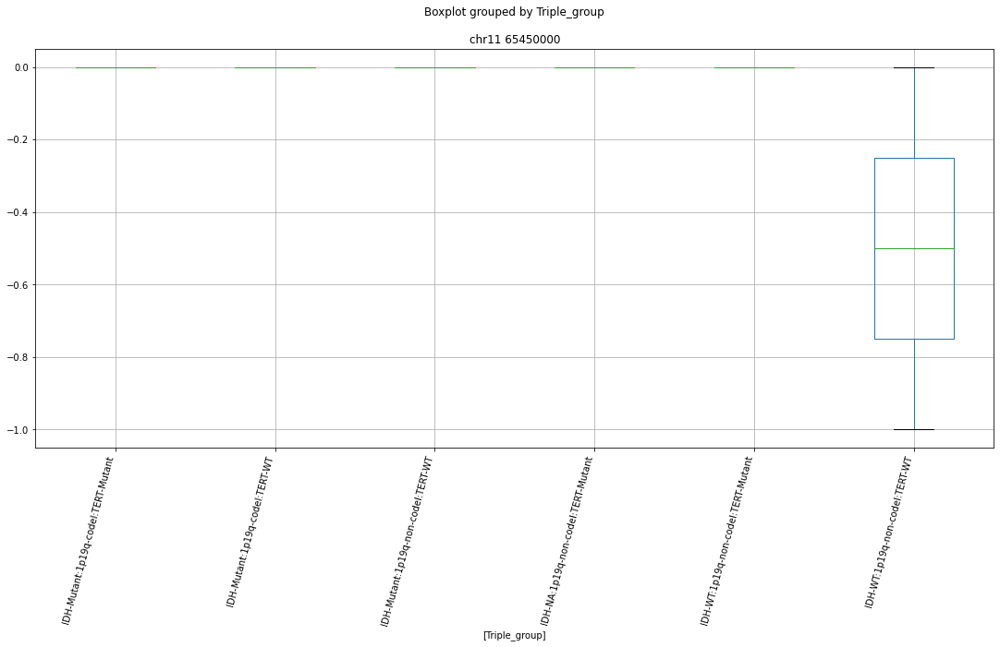

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 109670000


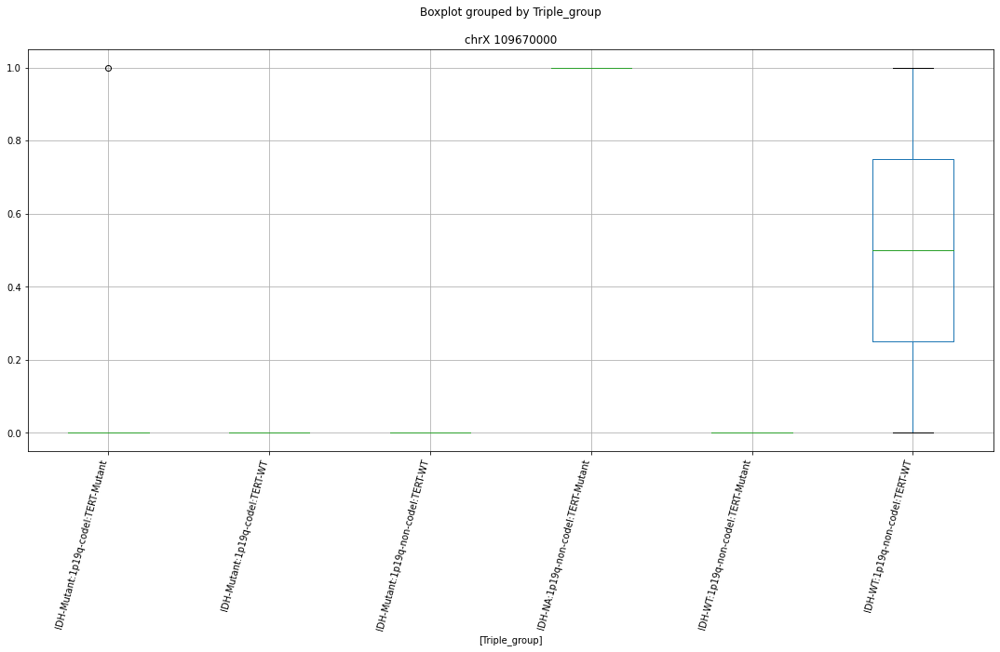

 p : 5.559732455007055e-06  ( t : 5.406345478099919 ) :  chr5 39333000


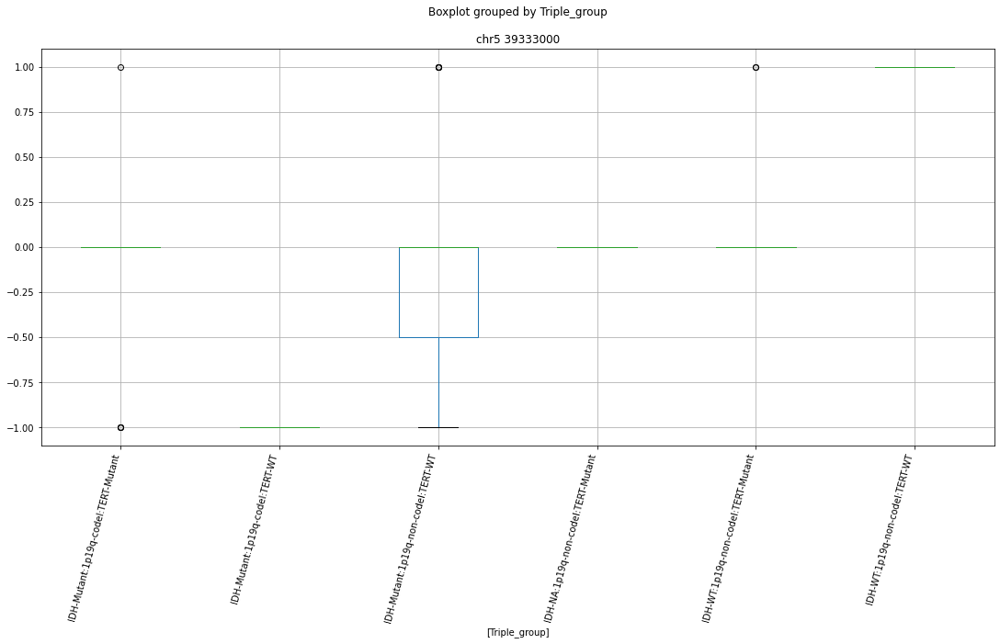

Clustermapping
['Triple_group' 'chr1 108490000' 'chr1 112729000' 'chr1 114058000'
 'chr1 114791000' 'chr1 117300000' 'chr1 12042000' 'chr1 145763000'
 'chr1 151770000' 'chr1 153583000' 'chr1 155835000' 'chr1 160699000'
 'chr1 161017000' 'chr1 161315000' 'chr1 161617000' 'chr1 162450000'
 'chr1 167030000' 'chr1 168208000' 'chr1 170419000' 'chr1 176058000'
 'chr1 183427000' 'chr1 189139000' 'chr1 202451000' 'chr1 203841000'
 'chr1 206065000' 'chr1 211198000' 'chr1 21386000' 'chr1 217523000'
 'chr1 217524000' 'chr1 220467000' 'chr1 222486000' 'chr1 227277000'
 'chr1 231127000' 'chr1 231453000' 'chr1 235080000' 'chr1 241416000'
 'chr1 245775000' 'chr1 246363000' 'chr1 248676000' 'chr1 248677000'
 'chr1 27829000' 'chr1 31177000' 'chr1 33510000' 'chr1 34948000'
 'chr1 34967000' 'chr1 36760000' 'chr1 39999000' 'chr1 43501000'
 'chr1 44877000' 'chr1 45082000' 'chr1 45498000' 'chr1 45739000'
 'chr1 46321000' 'chr1 50380000' 'chr1 64202000' 'chr1 64414000'
 'chr1 71379000' 'chr1 77871000' 'chr1 

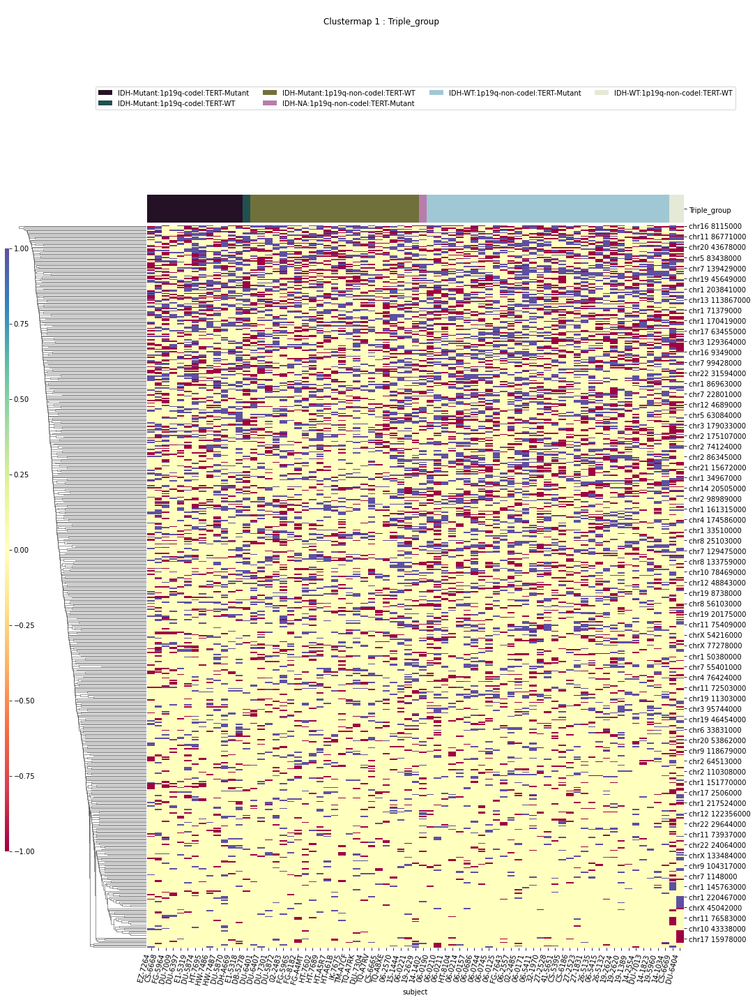

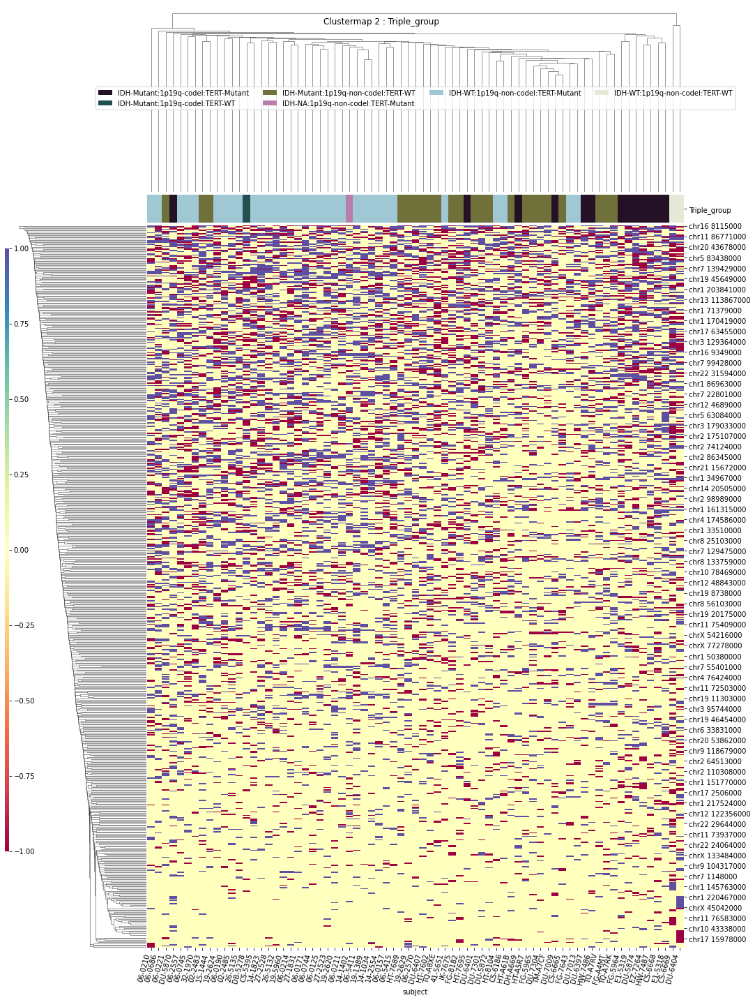

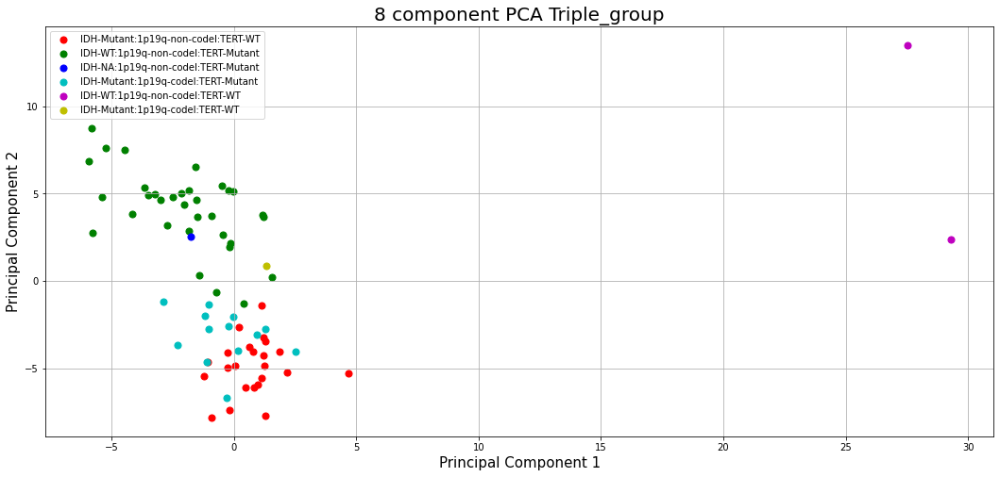

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 111234000' 'chr1 112729000' 'chr1 114058000'
 'chr1 159449000' 'chr1 161315000' 'chr1 179039000' 'chr1 193436000'
 'chr1 199903000' 'chr1 212015000' 'chr1 219546000' 'chr1 224350000'
 'chr1 227277000' 'chr1 23689000' 'chr1 247522000' 'chr1 27288000'
 'chr1 34948000' 'chr1 54561000' 'chr10 104785000' 'chr10 119794000'
 'chr10 120799000' 'chr10 12518000' 'chr10 126994000' 'chr10 21838000'
 'chr10 28772000' 'chr10 62928000' 'chr10 67692000' 'chr10 80535000'
 'chr10 84179000' 'chr10 84346000' 'chr10 92673000' 'chr10 9274000'
 'chr10 92976000' 'chr11 104195000' 'chr11 112664000' 'chr11 131083000'
 'chr11 17051000' 'chr11 33244000' 'chr11 60511000' 'chr11 60623000'
 'chr11 62355000' 'chr11 63528000' 'chr11 72910000' 'chr11 79500000'
 'chr11 86733000' 'chr11 95481000' 'chr12 105478000' 'chr12 122358000'
 'chr12 46001000' 'chr12 56788000' 'chr12 74587000' 'chr13 107782000'
 'chr13 109312000' 'chr13 18673000' 'chr13 25511000' 'chr13 461630

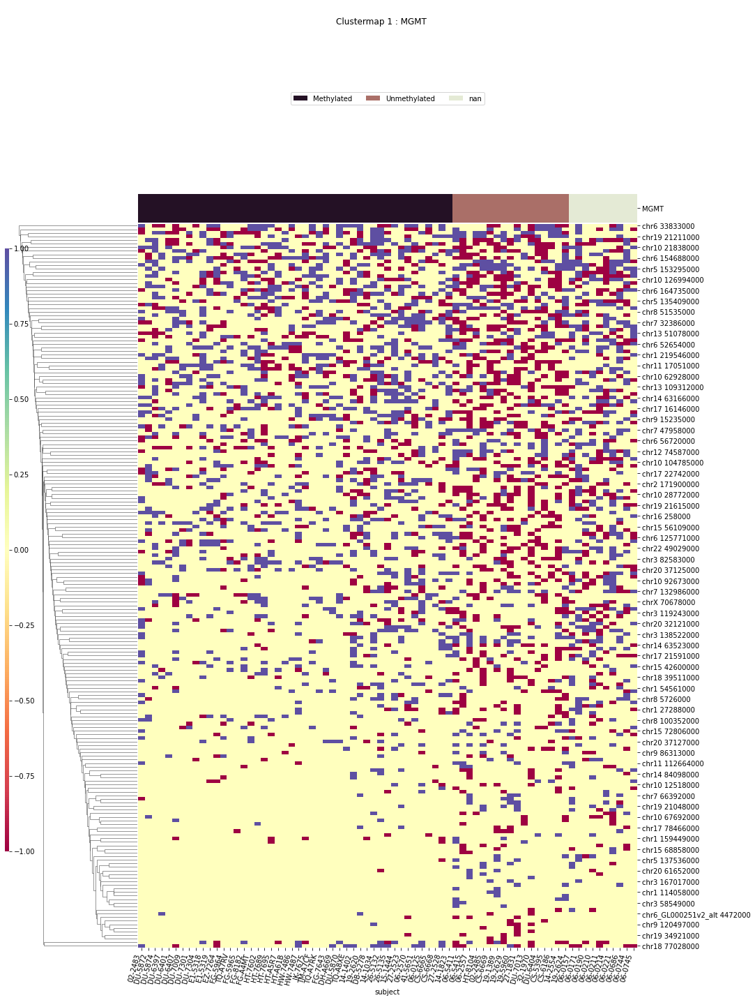

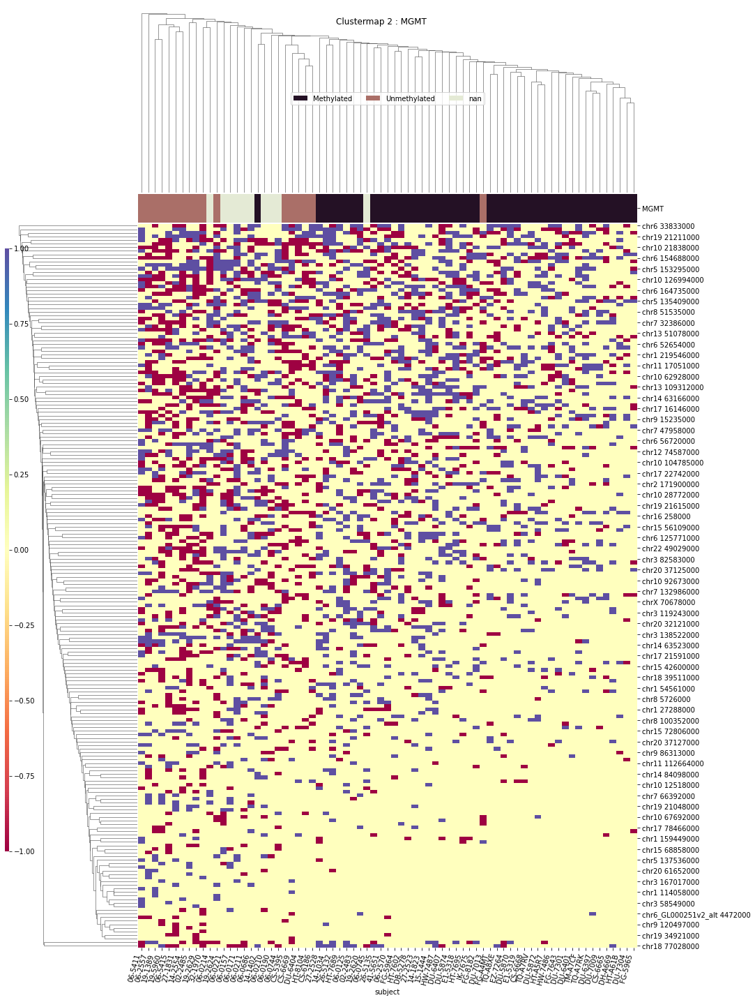

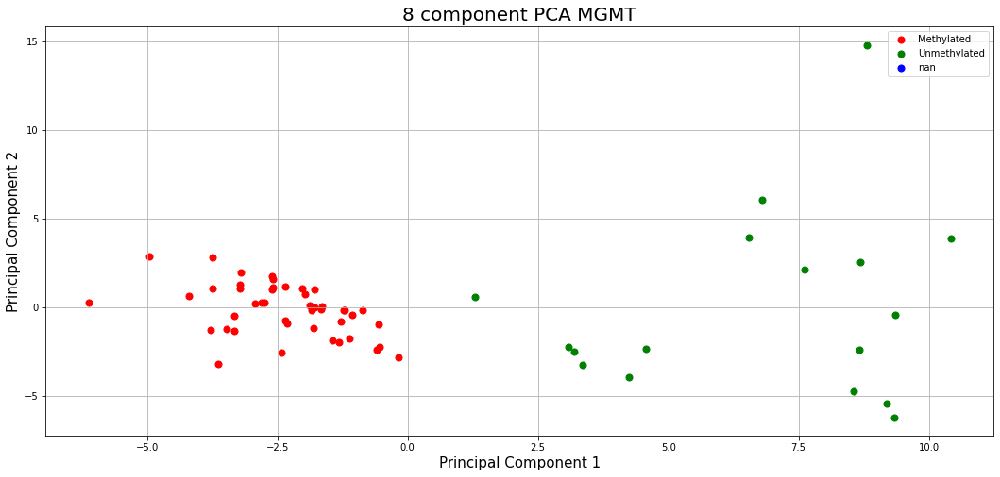

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 111529000' 'chr1 111607000' 'chr1 114803000' 'chr1 145763000'
 'chr1 152471000' 'chr1 23852000' 'chr1 23936000' 'chr1 30347000'
 'chr1 32803000' 'chr1 43501000' 'chr1 45739000' 'chr1 50380000'
 'chr1 86900000' 'chr1 91288000' 'chr1 92025000' 'chr1 96469000'
 'chr10 107801000' 'chr10 119723000' 'chr10 120216000' 'chr10 126995000'
 'chr10 31978000' 'chr10 45511000' 'chr10 70688000' 'chr10 96942000'
 'chr10 97417000' 'chr11 109146000' 'chr11 131085000' 'chr11 37430000'
 'chr11 4136000' 'chr11 60816000' 'chr11 63528000' 'chr11 78880000'
 'chr11 86771000' 'chr12 104322000' 'chr12 119920000' 'chr12 124101000'
 'chr12 131927000' 'chr12 14354000' 'chr12 48499000' 'chr12 62011000'
 'chr12 80306000' 'chr13 19601000' 'chr13 25511000' 'chr13 69615000'
 'chr13 95845000' 'chr14 21189000' 'chr14 35976000' 'chr14 48599000'
 'chr14 58589000' 'chr14 63166000' 'chr14 64037000' 'chr14 66544000'
 'chr14 94658000' 'chr15 20203000' 'chr15 27003000' 'chr15 5

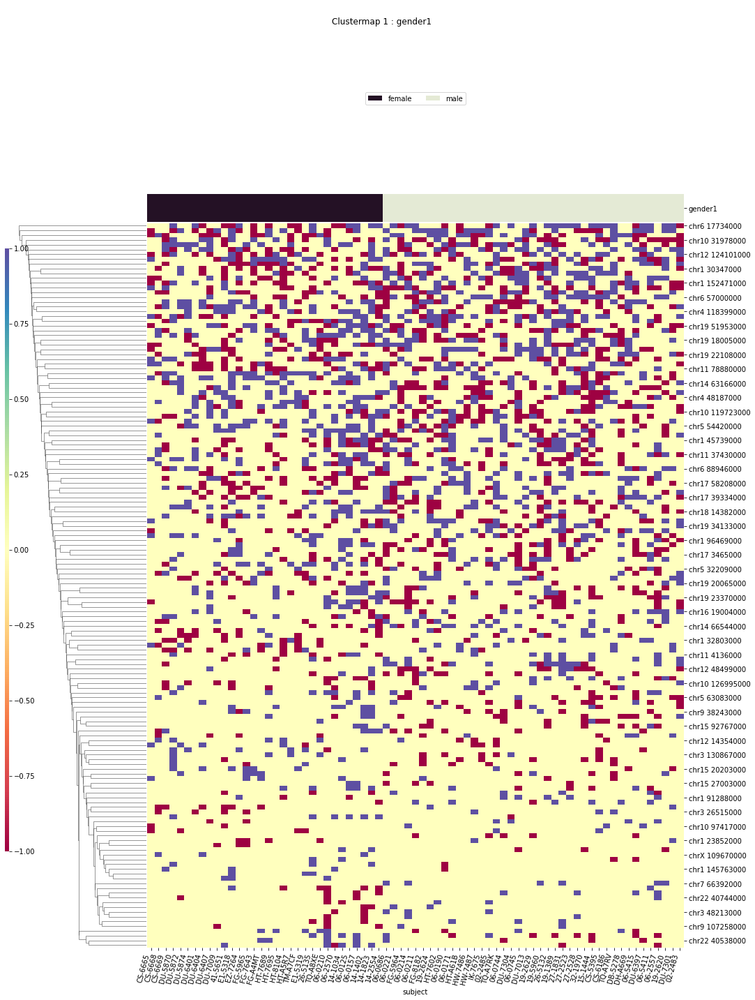

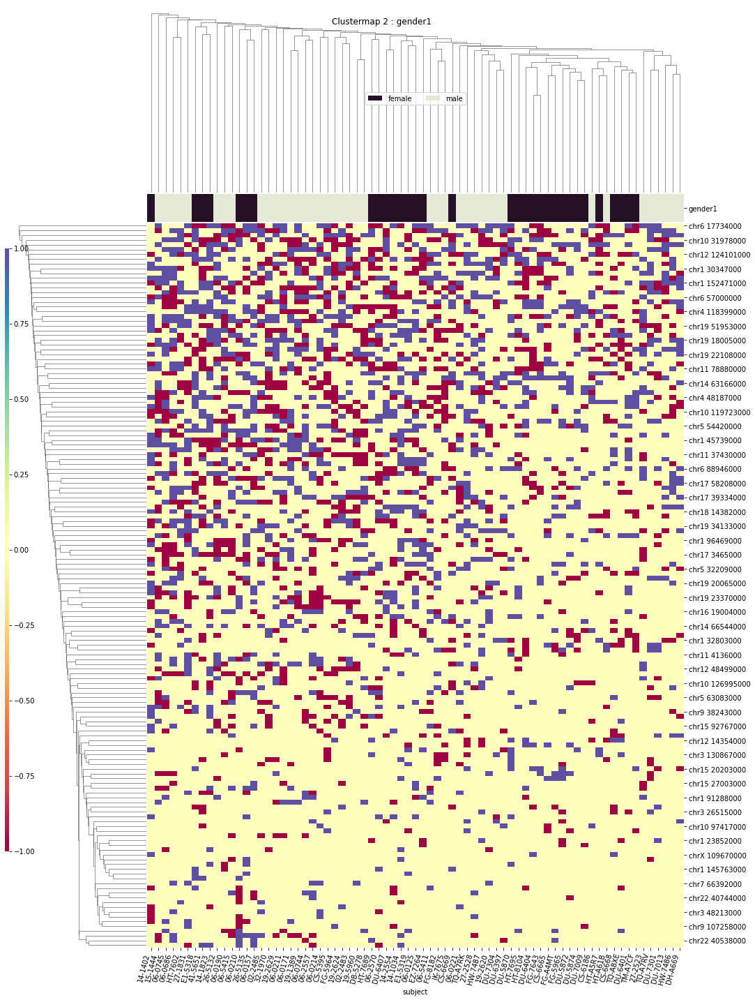

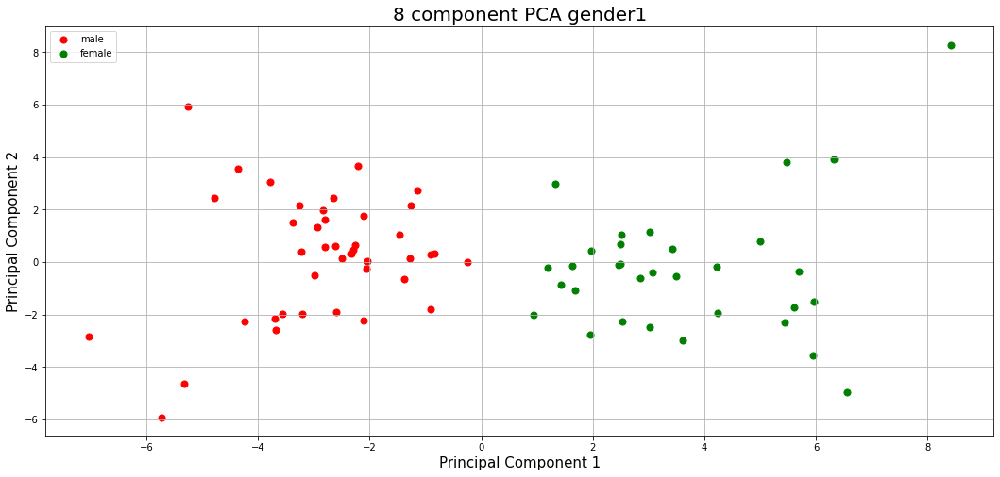

In [111]:
for column in 'primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf,
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-5,heat_p=0.05)

In [112]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 13:42:19'

primary_diagnosis
T-Testing
Boxplotting
 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr22 19083000


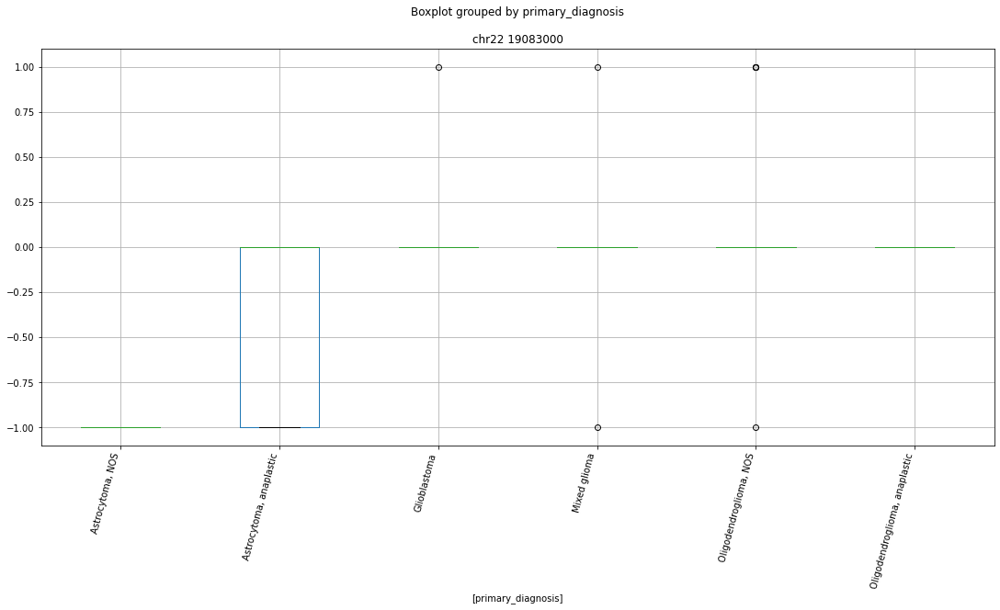

 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr11 82181000


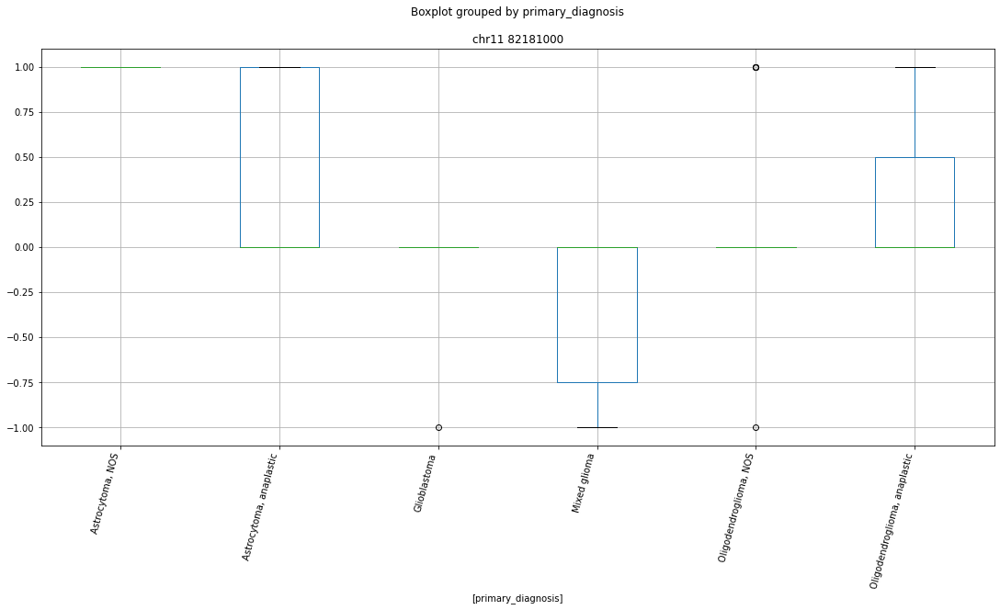

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 63808000


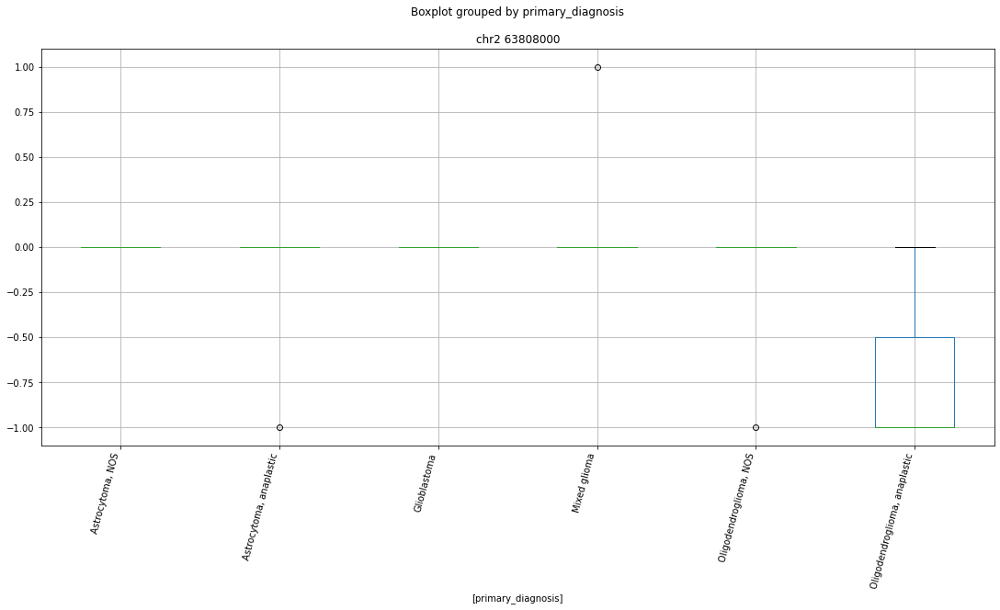

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 133484000


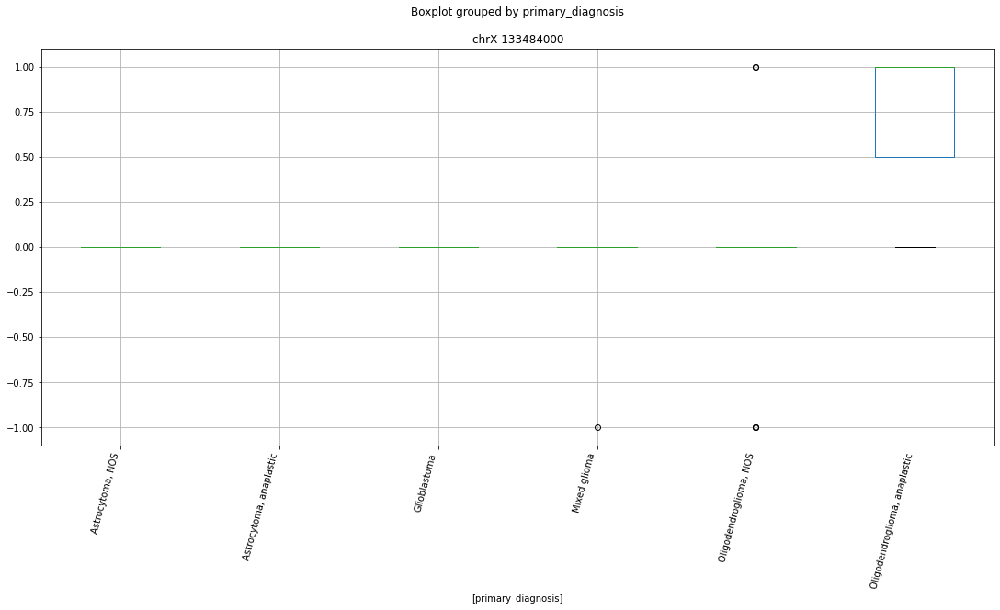

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 28838000


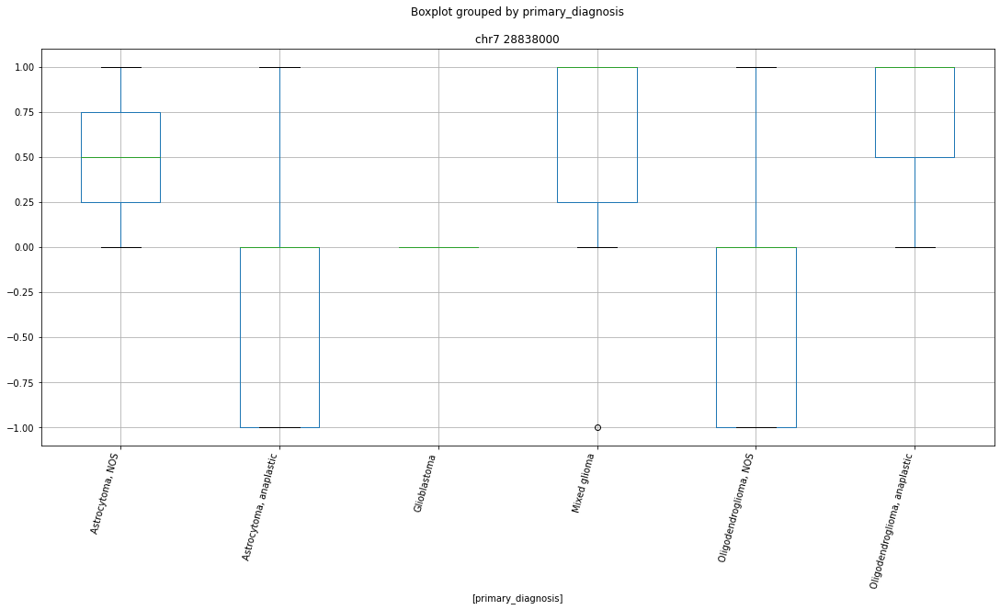

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 58454000


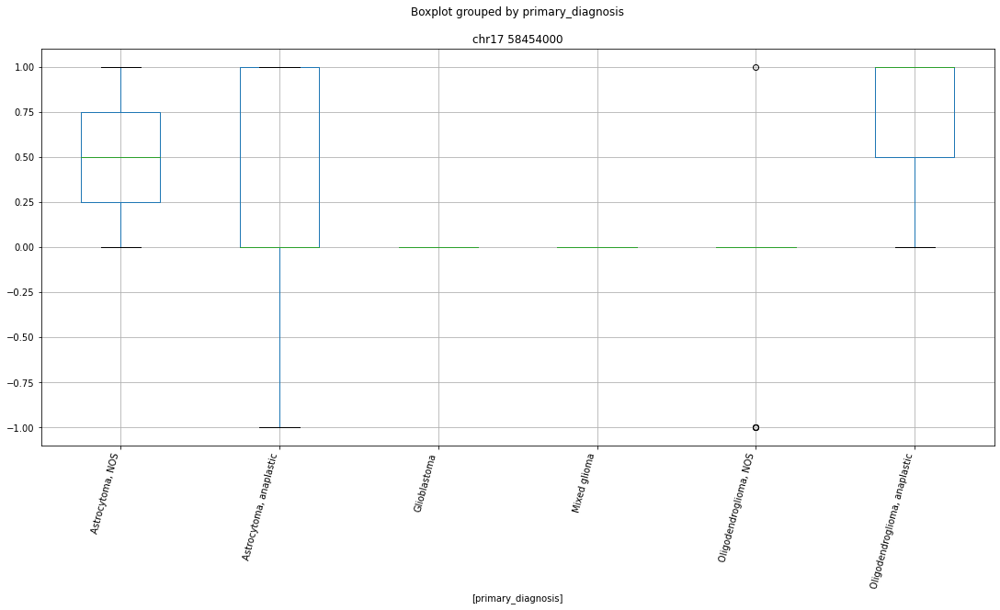

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr16 67712000


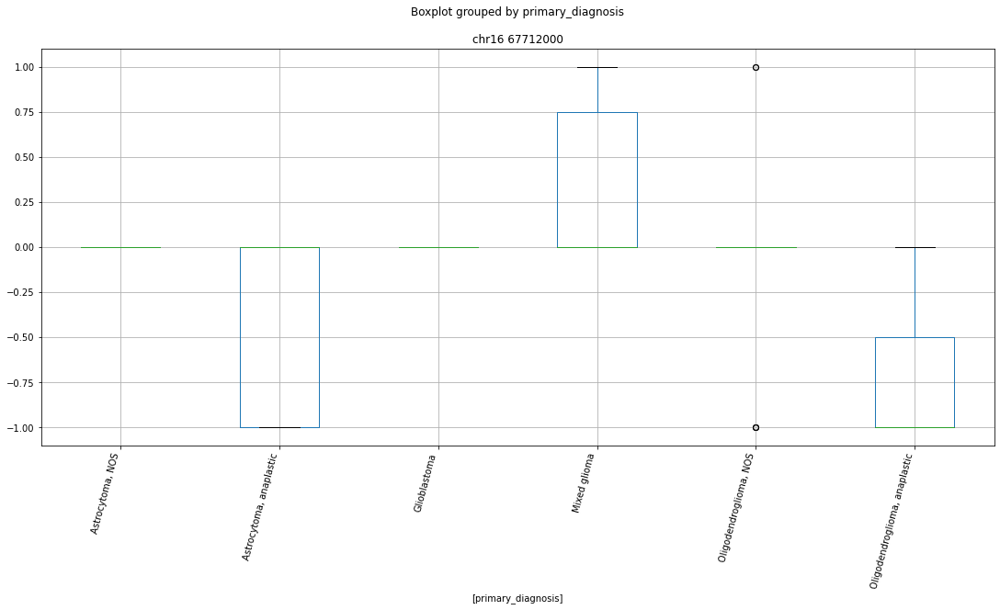

 p : 3.4049793131136327e-09  ( t : 7.895146188218008 ) :  chr14 19867000


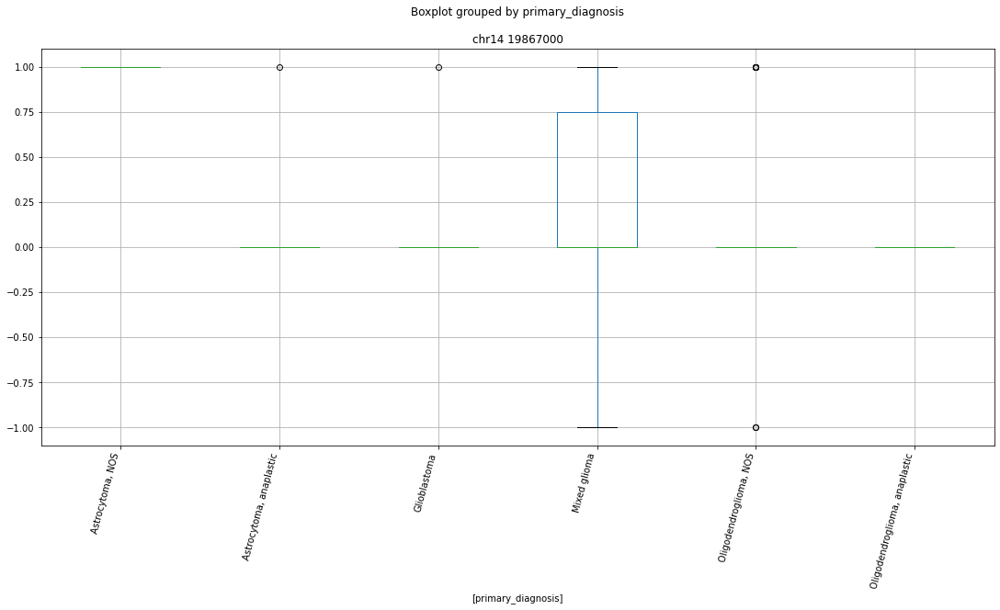

Clustermapping
['chr1 10029000' 'chr1 10427000' 'chr1 108488000' ... 'chrY 7180000'
 'primary_diagnosis' 'subject']


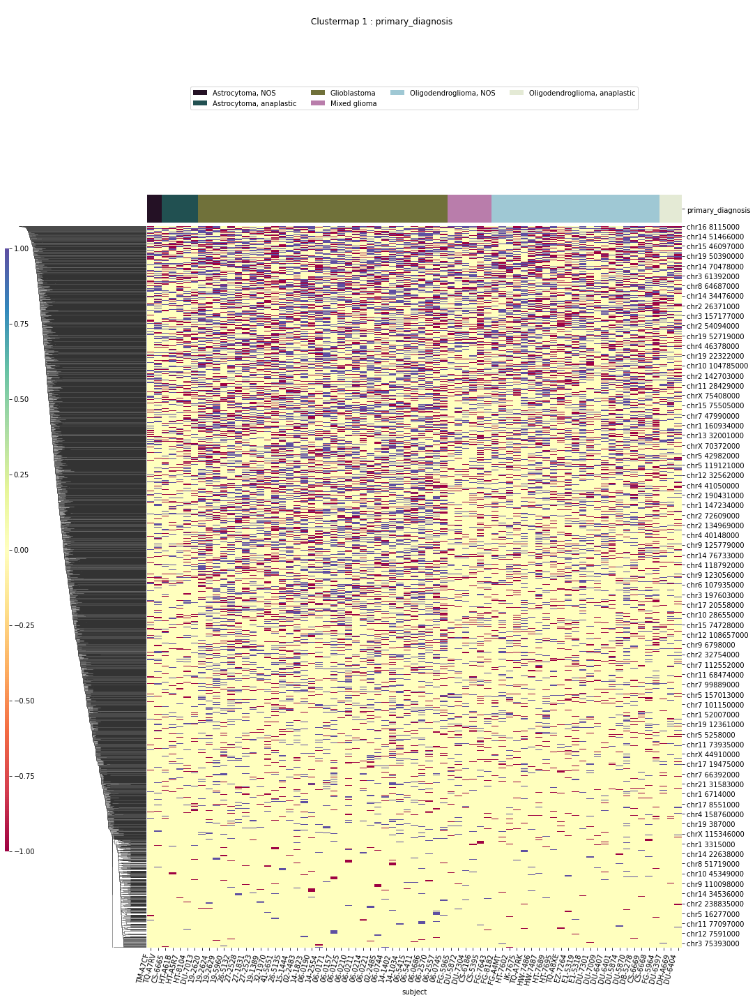

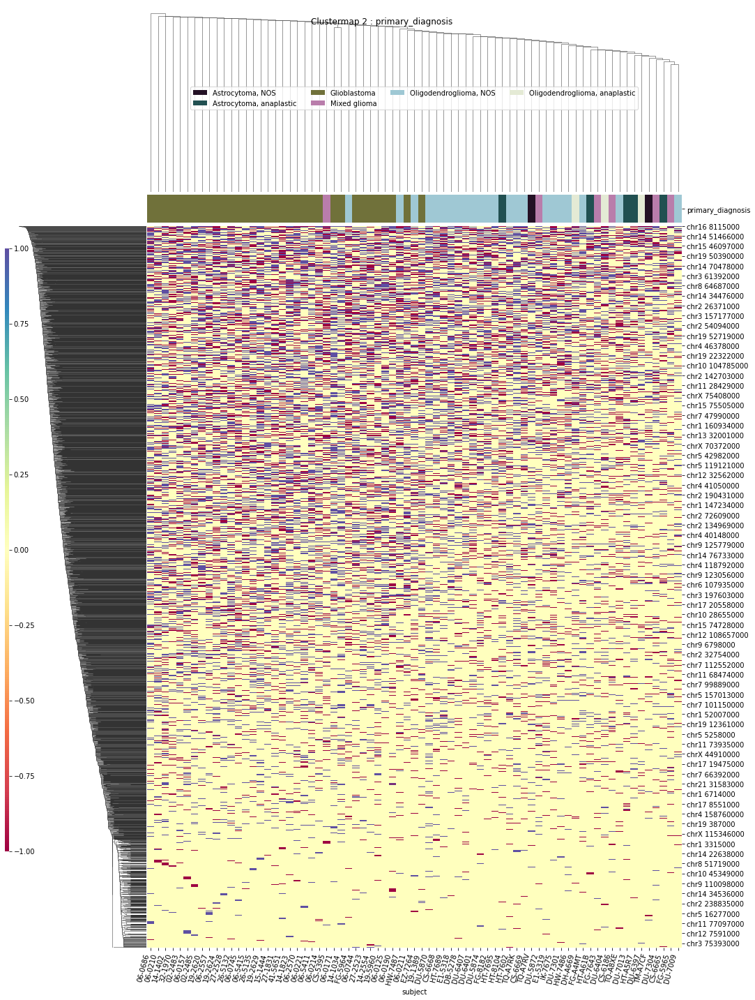

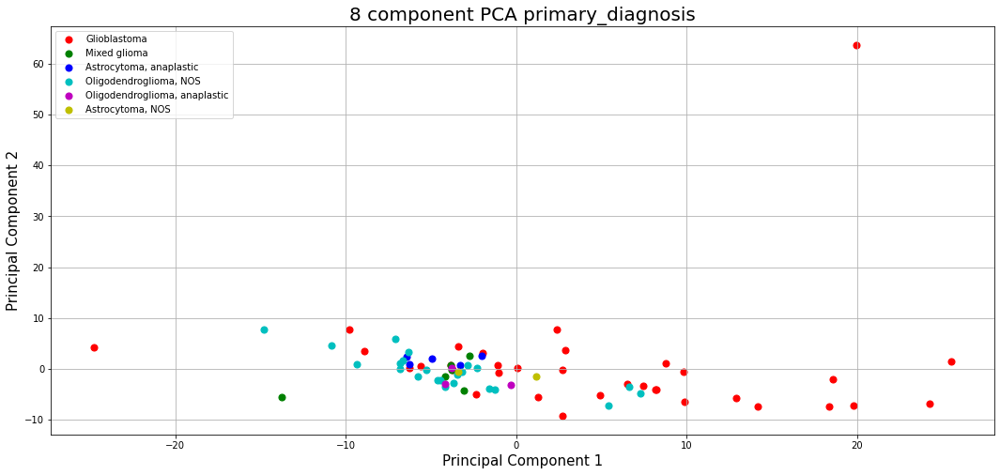

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 10427000' 'chr1 108488000' ... 'chrY 4296000' 'chrY 8917000'
 'subject']


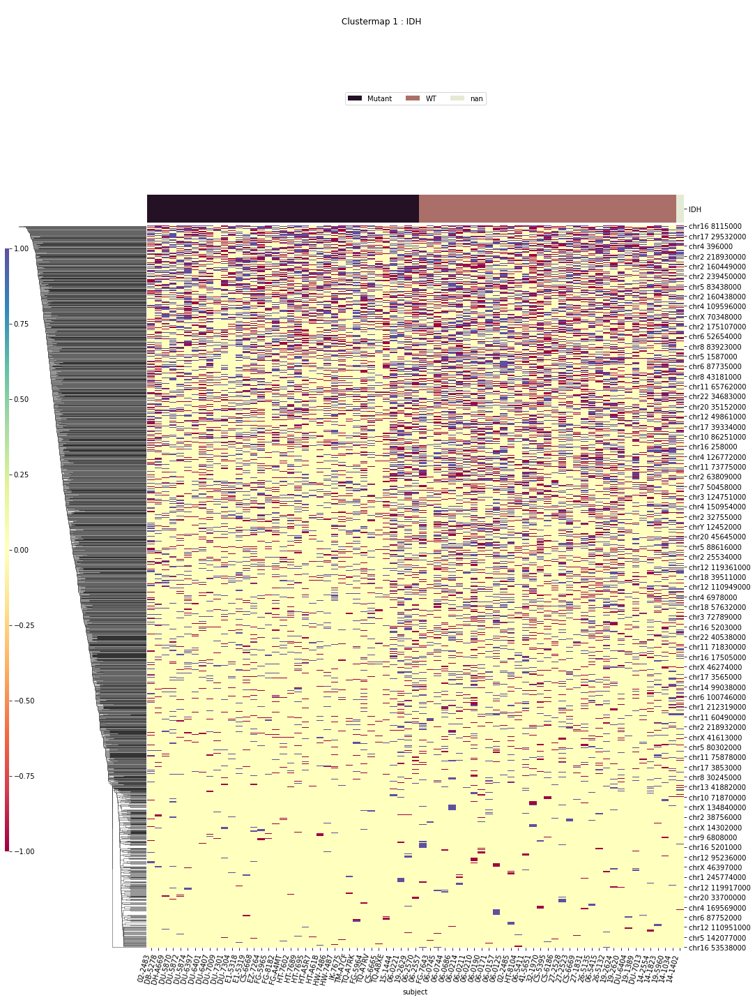

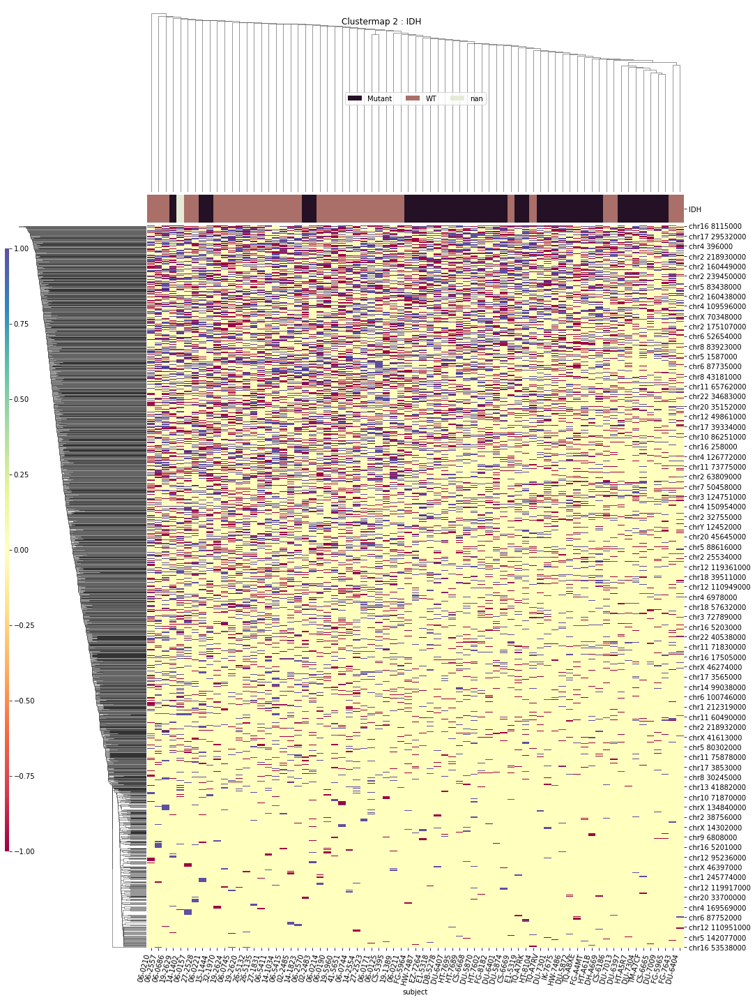

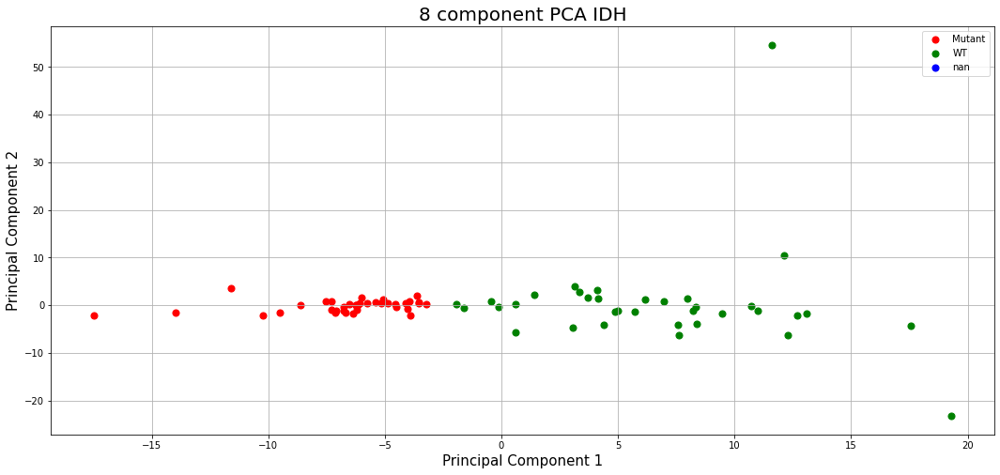

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 10029000' 'chr1 106413000' 'chr1 108490000' ... 'chrY 12878000'
 'subject' 'x1p19q']


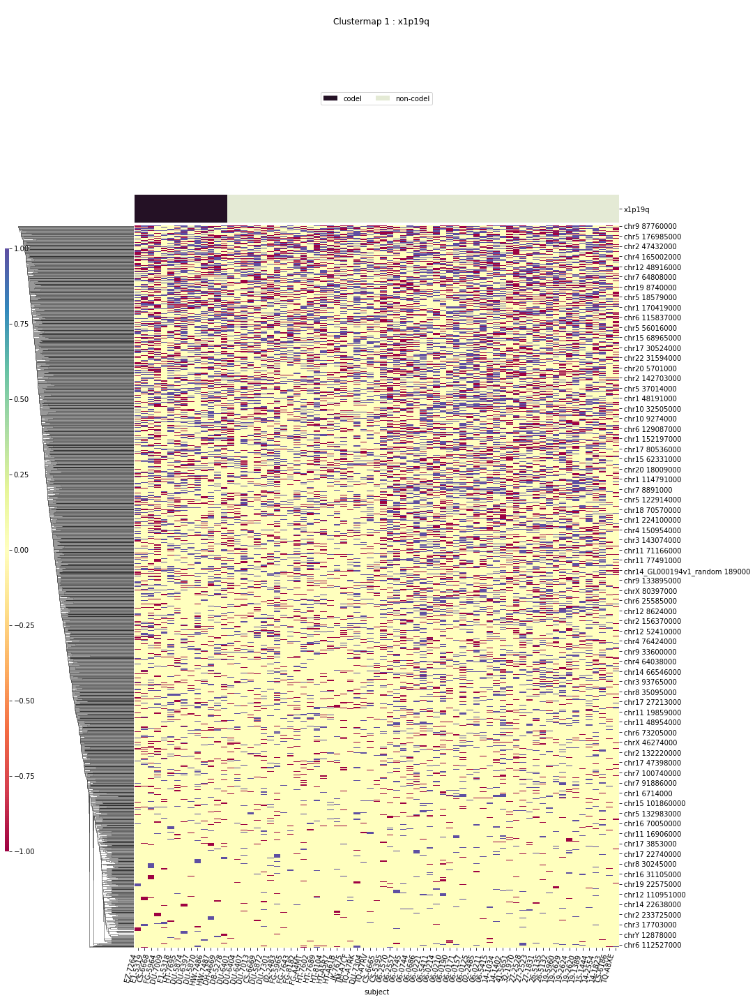

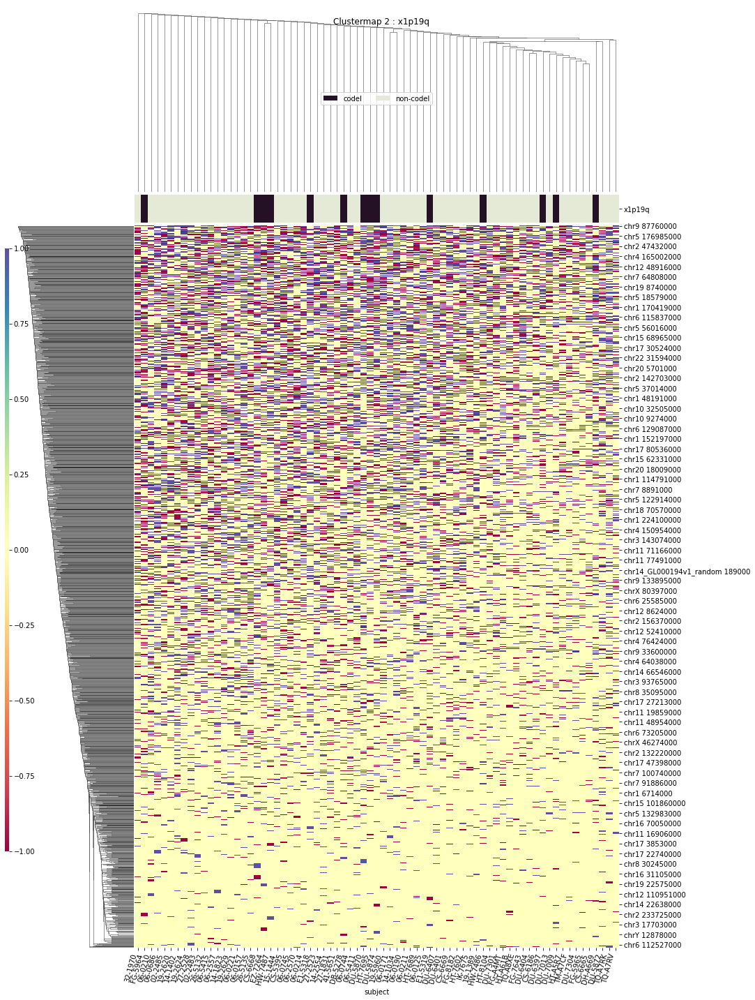

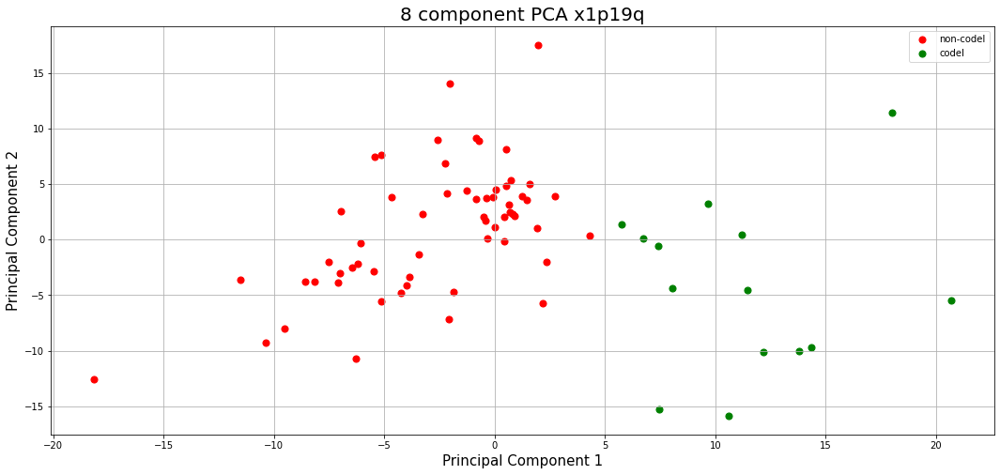

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 10427000' 'chr1 106413000' ... 'chrY 4296000' 'chrY 8917000'
 'subject']


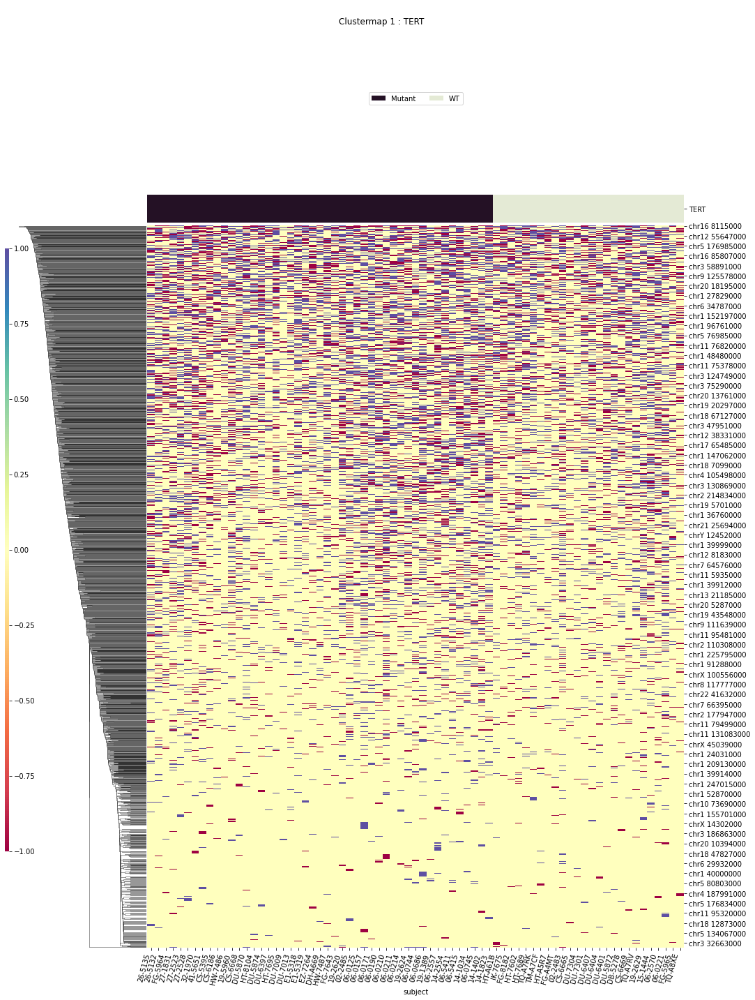

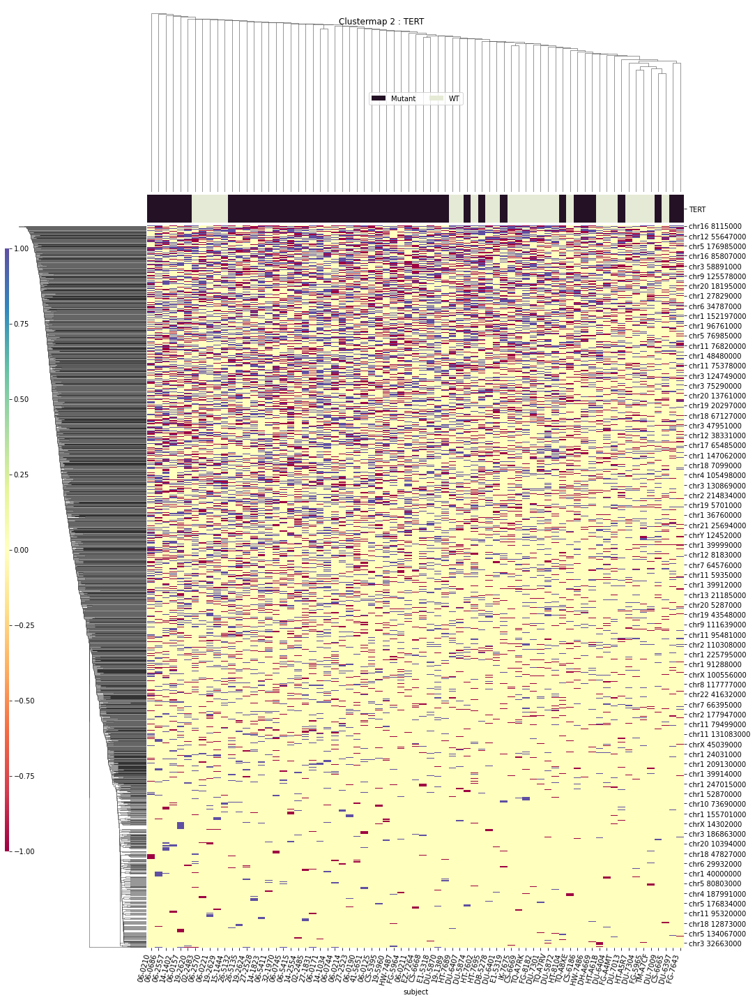

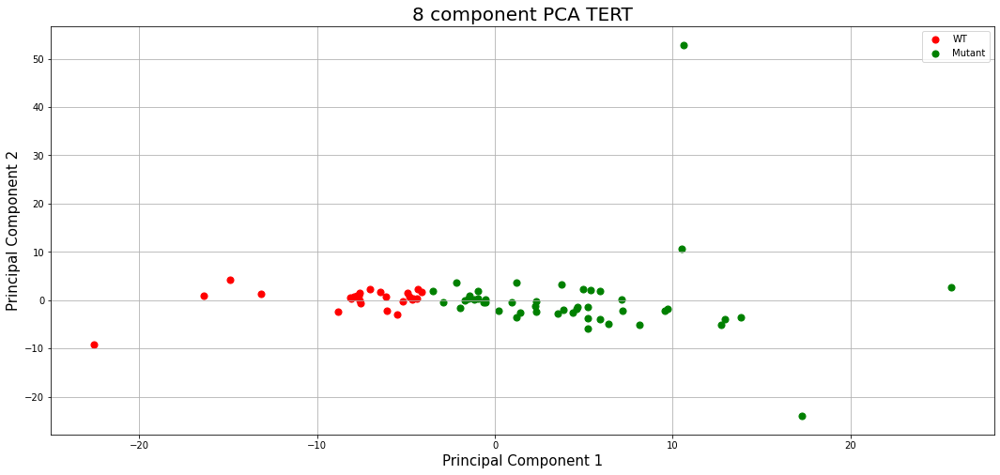

disease_type
T-Testing
Boxplotting
Clustermapping
['chr1 10427000' 'chr1 108488000' 'chr1 108490000' ... 'chrY 4296000'
 'disease_type' 'subject']


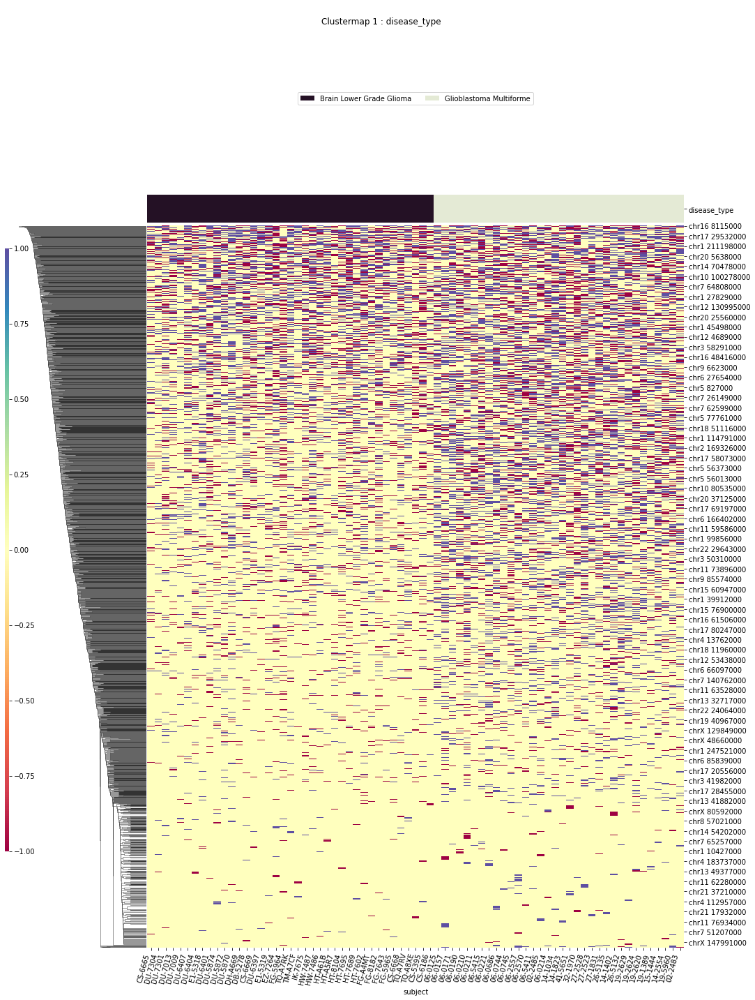

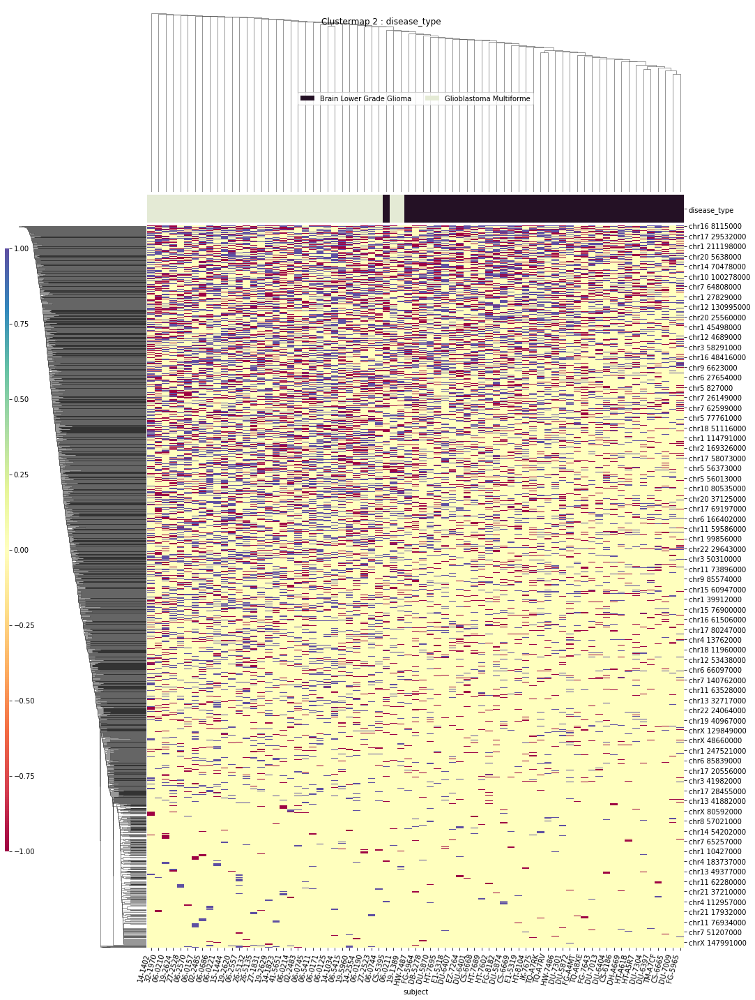

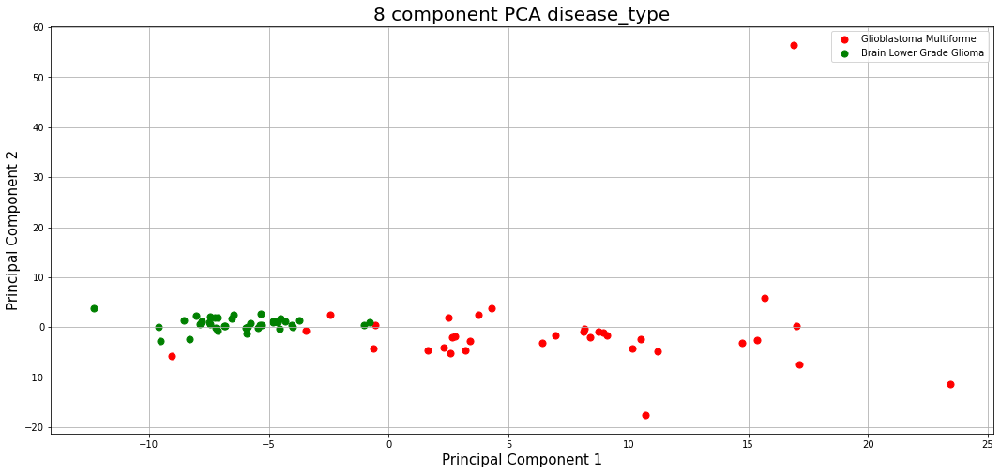

IDH_1p19q_status
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 10029000' 'chr1 10427000' ... 'chrY 4296000'
 'chrY 8917000' 'subject']


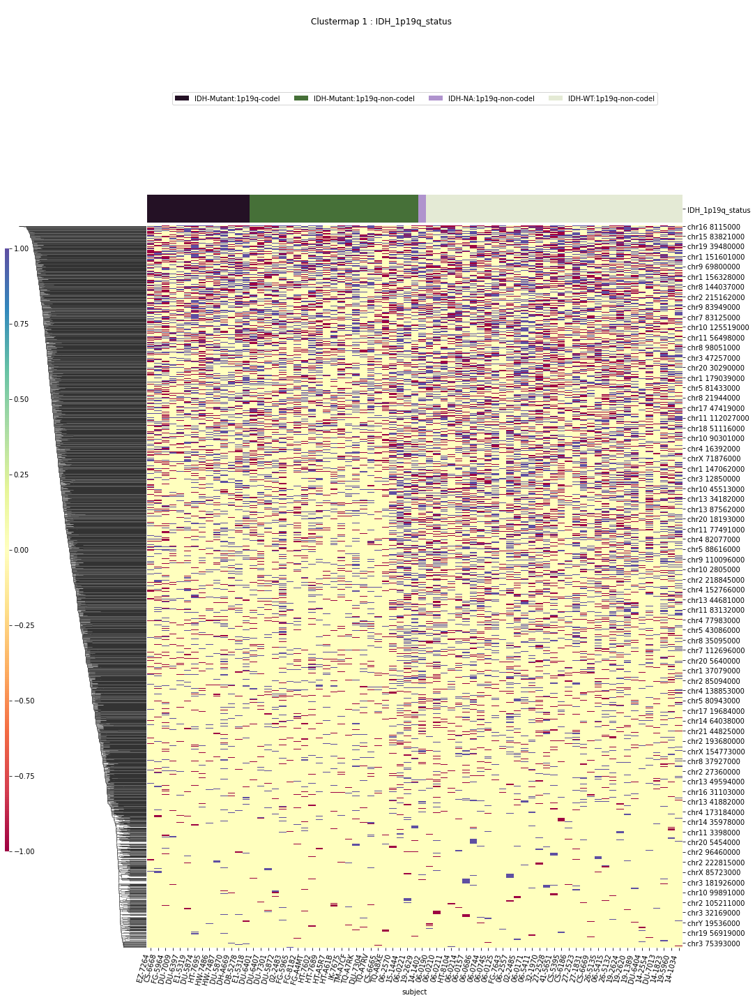

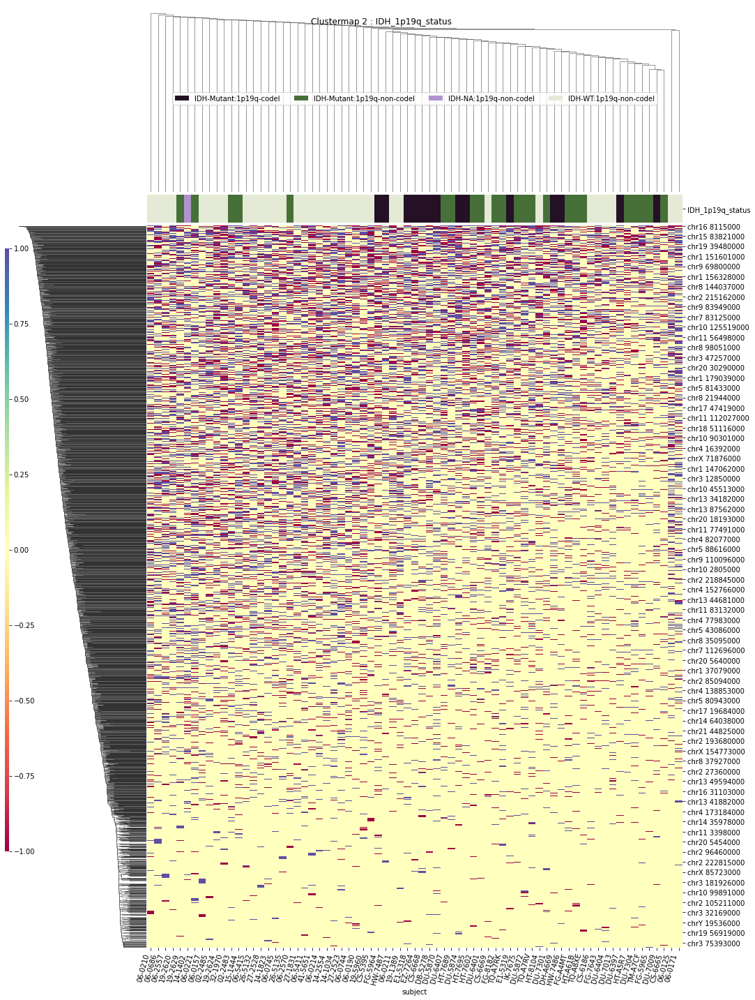

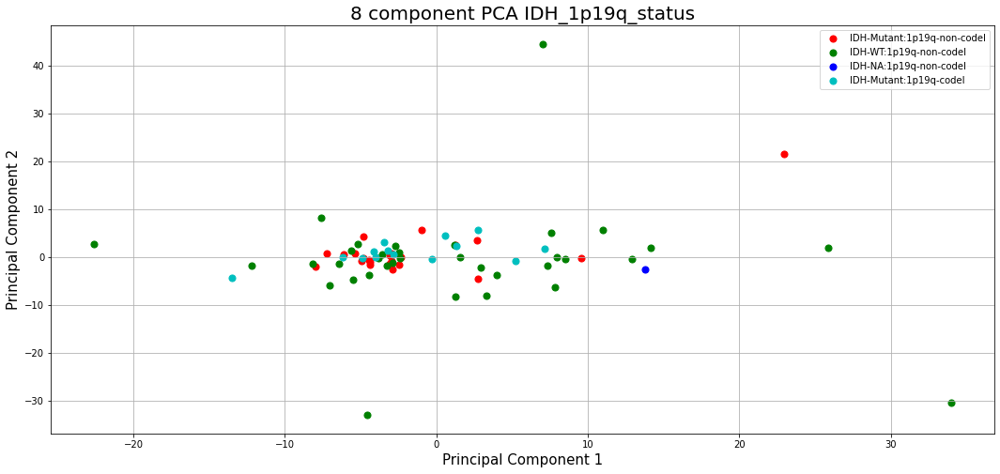

WHO_groups
T-Testing
Boxplotting
Clustermapping
['WHO_groups' 'chr1 10029000' 'chr1 10427000' ... 'chrY 7180000'
 'chrY 8917000' 'subject']


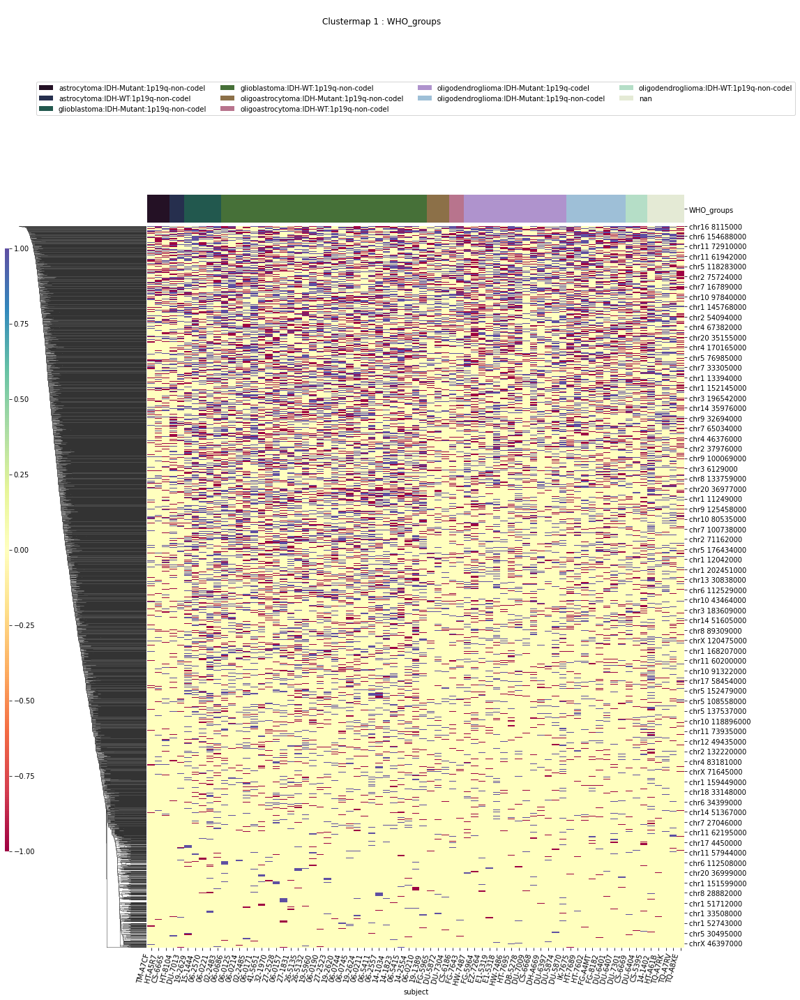

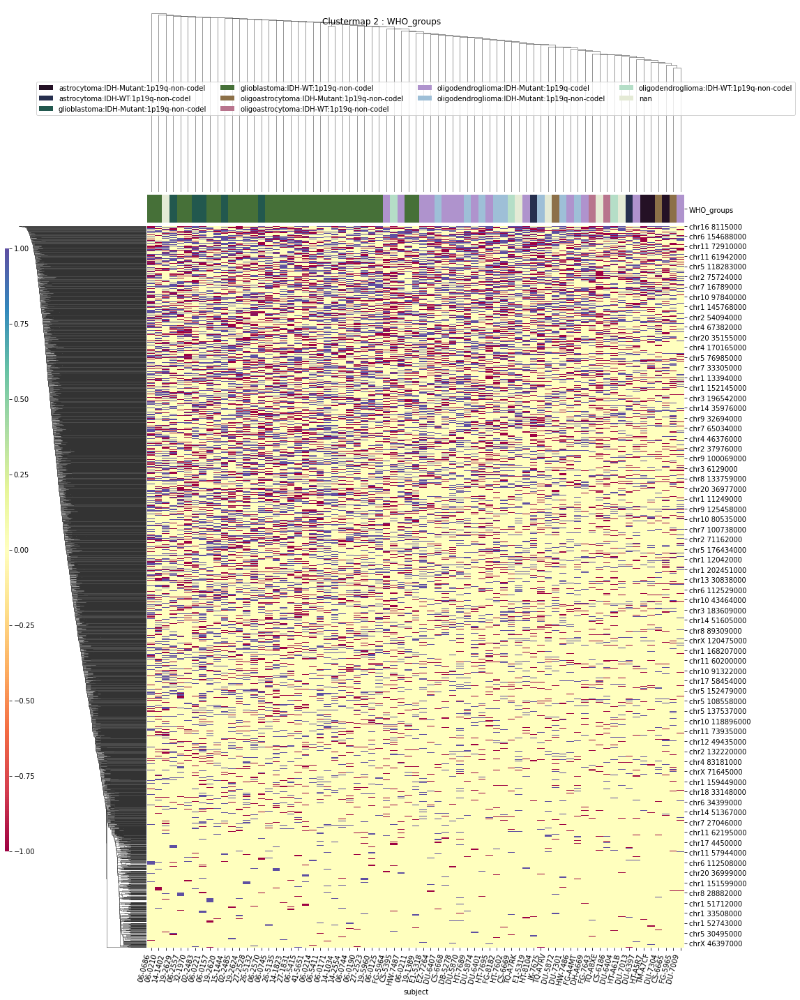

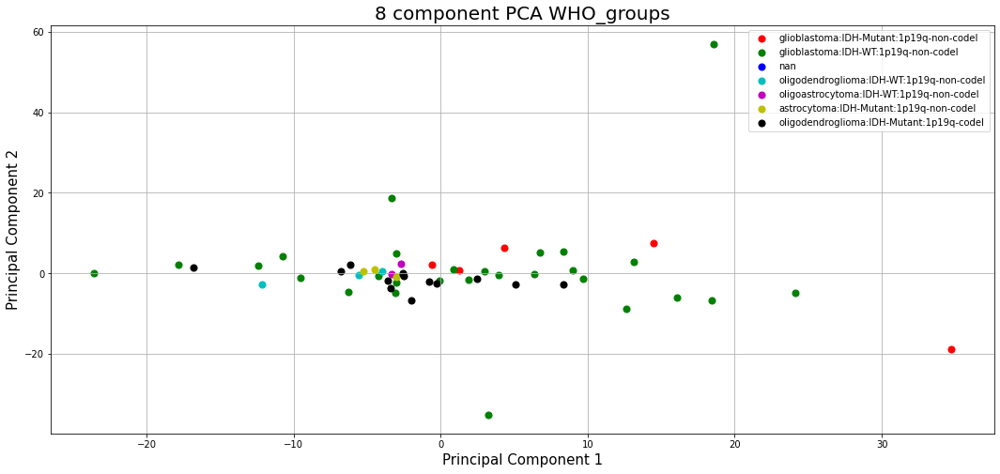

Triple_group
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
 p : 5.980116350794693e-09  ( t : 7.768066499641796 ) :  chr21 45267000


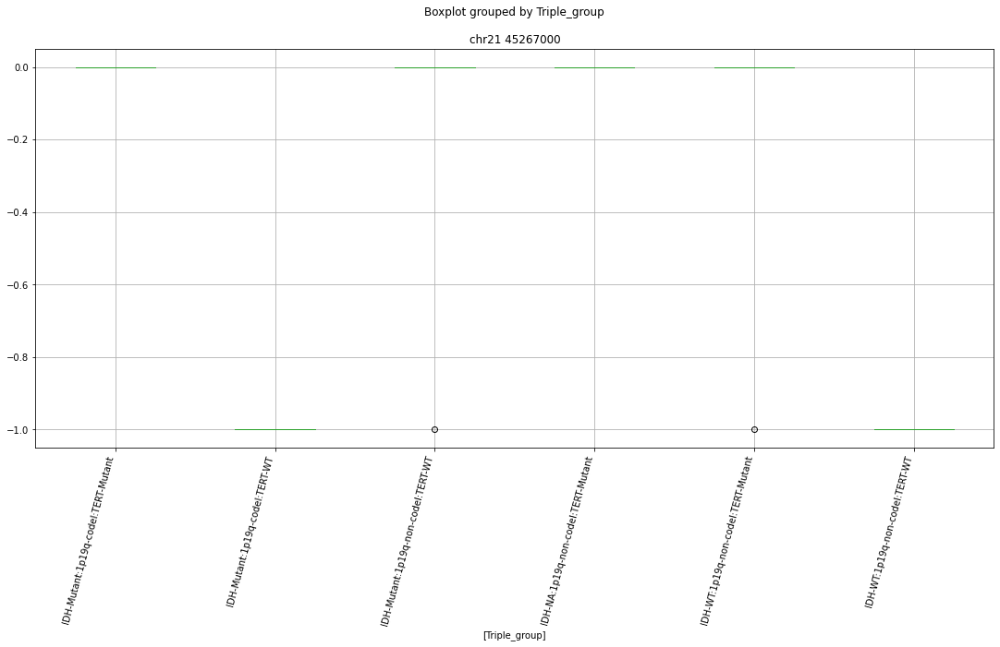

Clustermapping
['Triple_group' 'chr1 10029000' 'chr1 10427000' ... 'chrY 4296000'
 'chrY 8917000' 'subject']


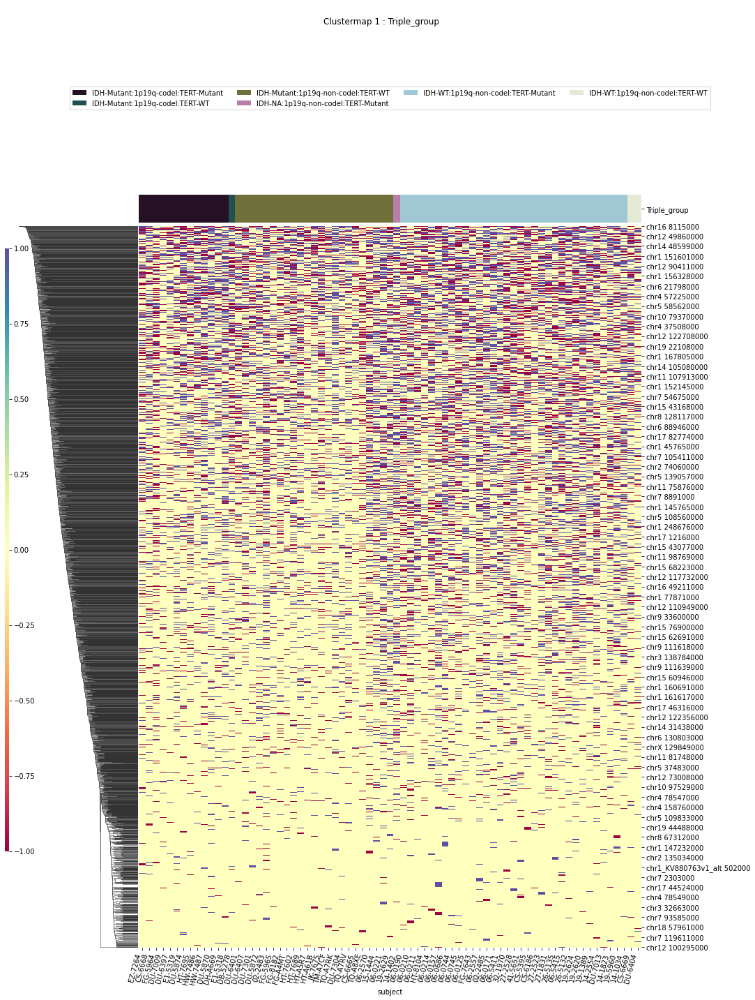

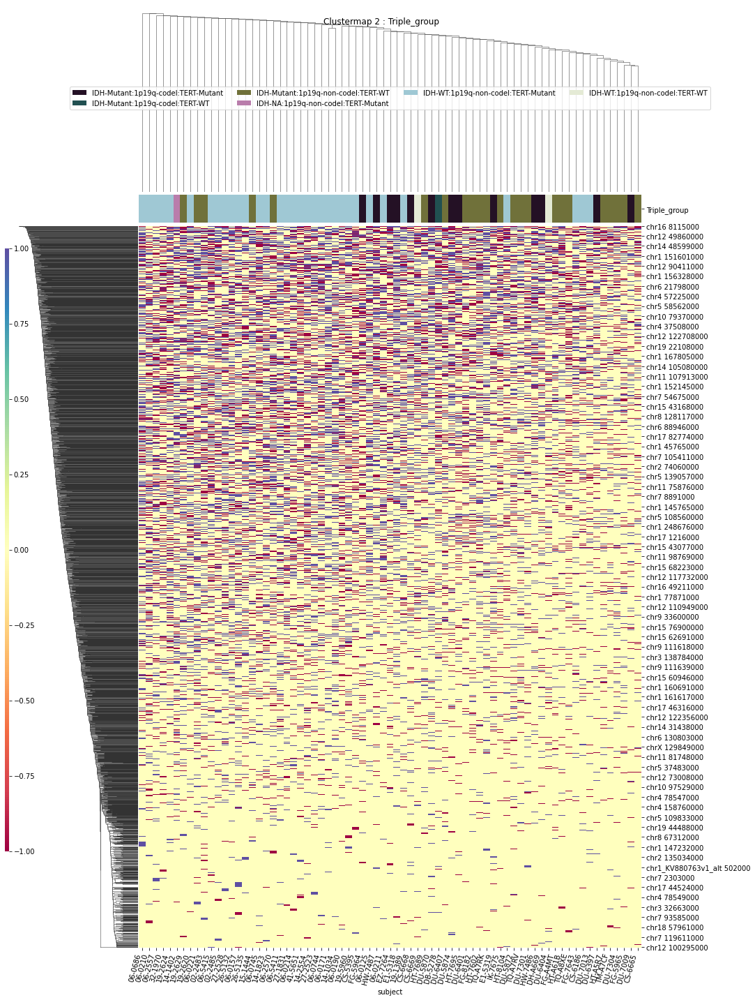

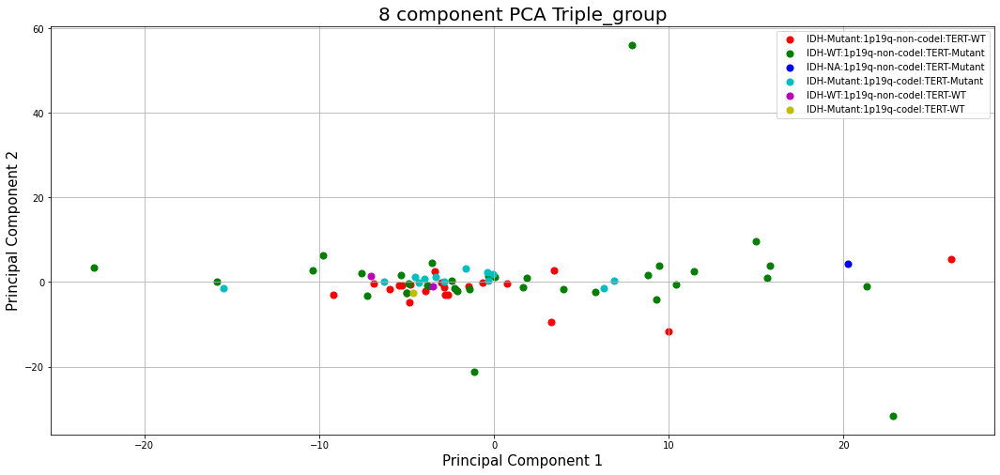

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 10427000' 'chr1 106413000' ... 'chrY 19536000'
 'chrY 20553000' 'subject']


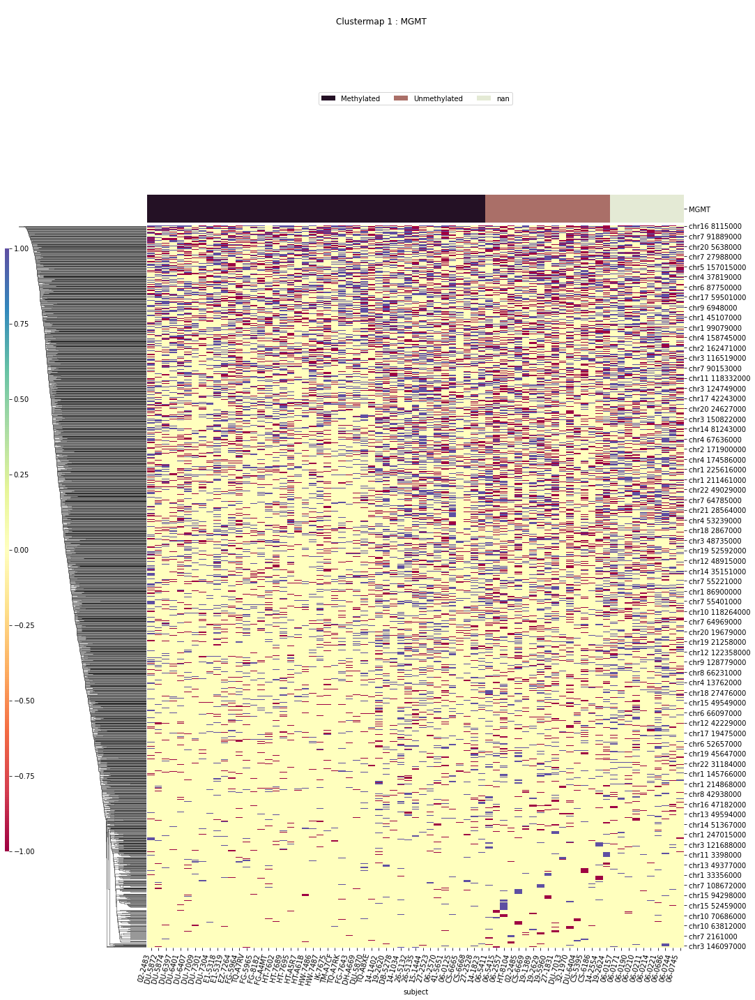

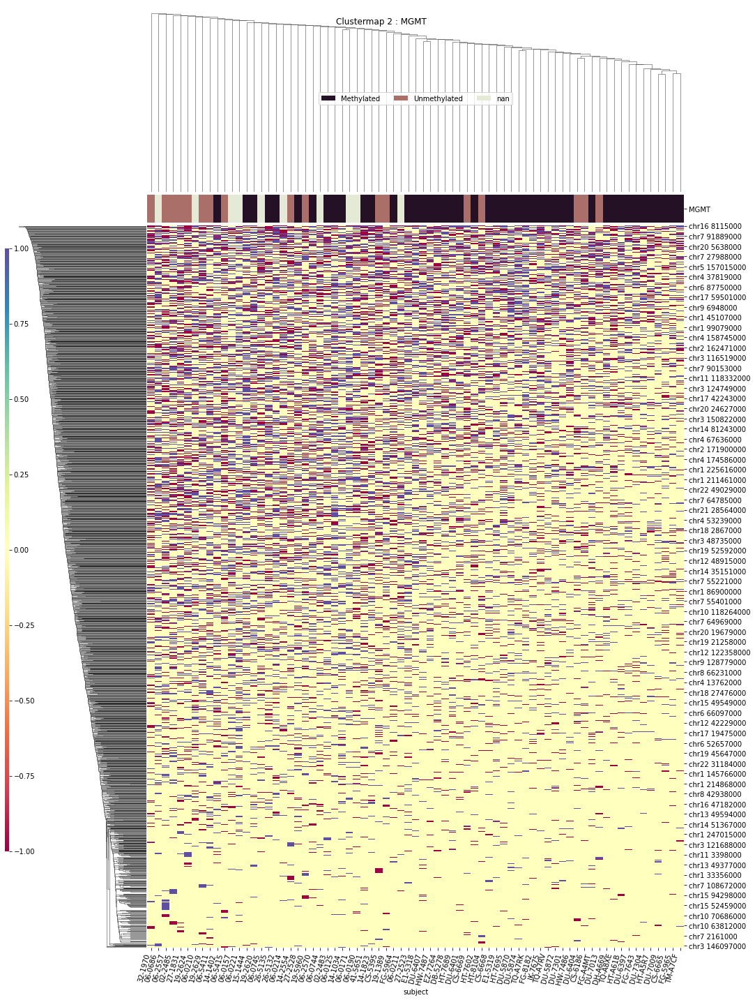

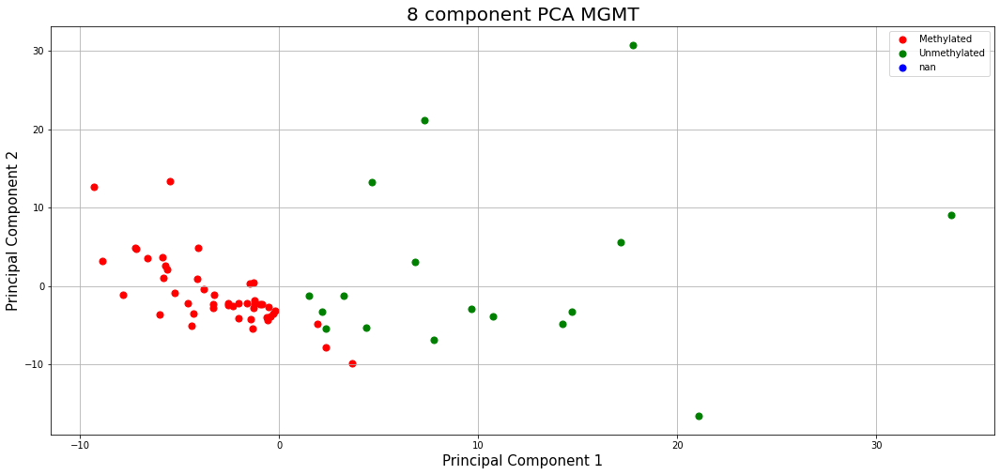

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 10029000' 'chr1 10427000' 'chr1 106413000' ... 'chrY 7180000'
 'gender1' 'subject']


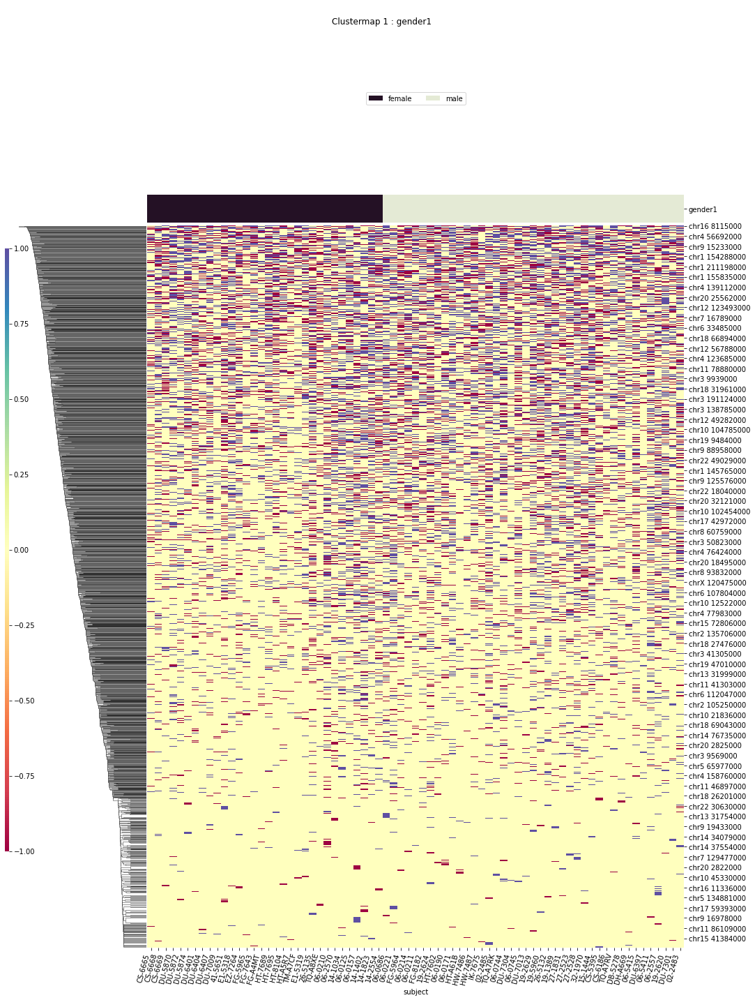

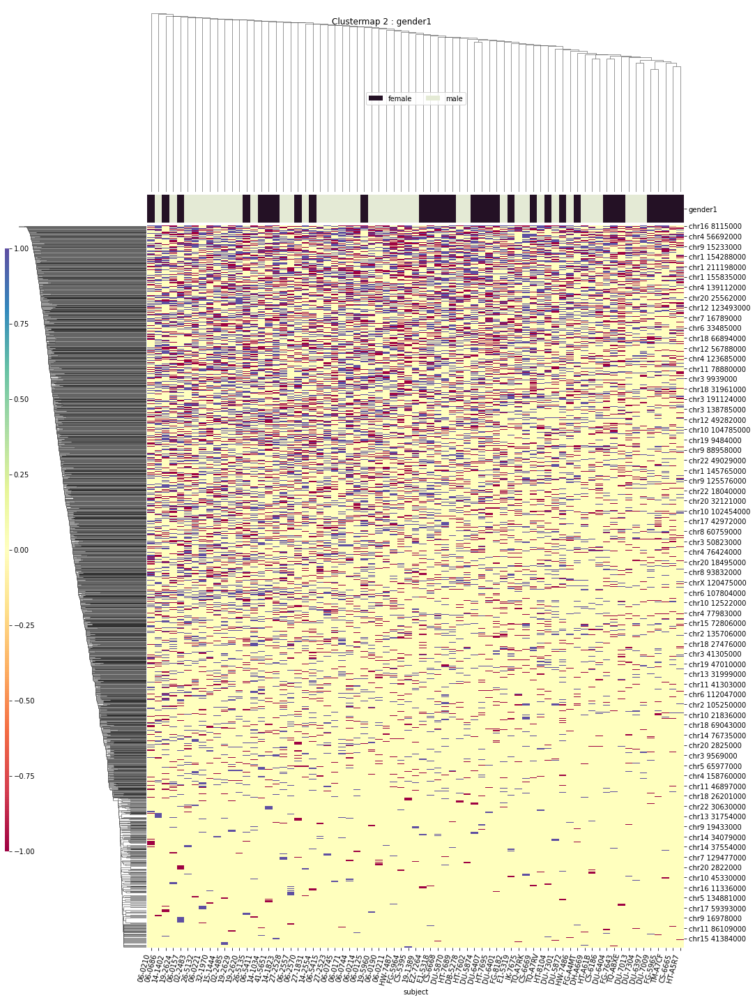

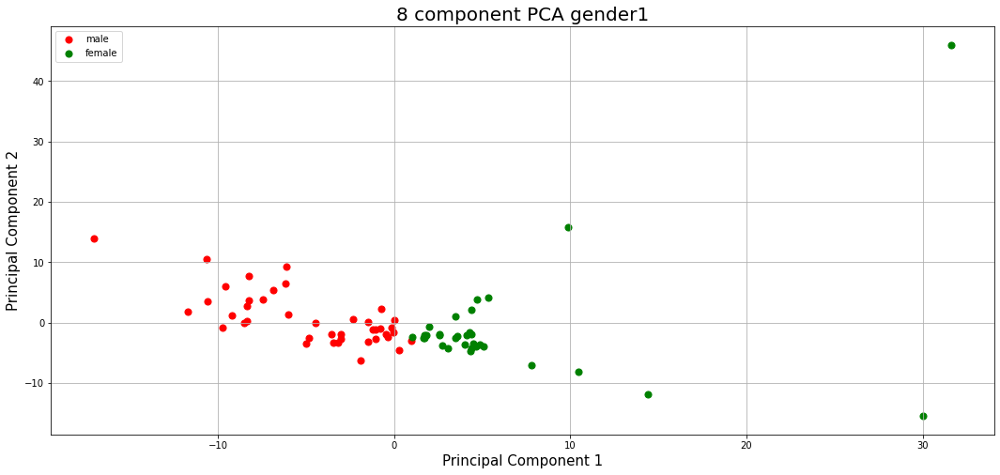

In [113]:
for column in 'primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf,
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-8,heat_p=0.5)

In [114]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 14:00:05'

In [115]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [116]:
pd.set_option('display.max_columns', default_max_columns)

In [117]:
pd.set_option('display.max_rows',default_max_rows)

In [118]:
pd.set_option('display.precision', default_precision)